In [ ]:
#!pip install ydata-profiling

In [ ]:
# Importamos librerias basicas
import pandas as pd # Manipulacion dataframes
import numpy as np # matrices y vectores
import matplotlib.pyplot as plt #graficas
import seaborn as sns # opcional, aunque tambien sirve para graficar mejor
import sklearn

Matplotlib is building the font cache; this may take a moment.


**1. Carga de datos**

In [76]:
df = pd.read_excel('BD_creditos.xlsx')
df.head()

,tipo_credito,fecha_prestamo,capital_prestado,plazo_meses,edad_cliente,tipo_laboral,salario_cliente,total_otros_prestamos,cuota_pactada,puntaje,...,saldo_mora,saldo_total,saldo_principal,saldo_mora_codeudor,creditos_sectorFinanciero,creditos_sectorCooperativo,creditos_sectorReal,promedio_ingresos_datacredito,tendencia_ingresos,Pago_atiempo
0,7,2024-12-21 11:31:35,3692160.0,10,42,Independiente,8000000,2500000,341296,88.768094,...,0.0,51258.0,51258.0,0.0,5,0,0,908526.0,Estable,1
1,4,2025-04-22 09:47:35,840000.0,6,60,Empleado,3000000,2000000,124876,95.227787,...,0.0,8673.0,8673.0,0.0,0,0,2,939017.0,Creciente,1
2,9,2026-01-08 12:22:40,5974028.4,10,36,Independiente,4036000,829000,529554,47.613894,...,0.0,18702.0,18702.0,0.0,3,0,0,NaN,NaN,0
3,4,2025-08-04 12:04:10,1671240.0,6,48,Empleado,1524547,498000,252420,95.227787,...,0.0,15782.0,15782.0,0.0,3,0,0,1536193.0,Creciente,1
4,9,2025-04-26 11:24:26,2781636.0,11,44,Empleado,5000000,4000000,217037,95.227787,...,0.0,204804.0,204804.0,0.0,3,0,1,933473.0,Creciente,1


**2. Exploracion inicial de datos**

**2.1 Descripcion general de los datos**

El dataset ontiene informacion de 10.763 registros de creditos con 23 variables que describen tanto las caracteristicas de los prestamos como las de los clientes

**Descripcion de los datos**

+ Tipo_credito: Identificador numerico del tipo de credito

+ Fecha_prestamo: Fecha en la que se otorgo el prestamo

+ Capital_prestado: Monto del credito otorgado

+ Plazo_meses: Duracion del prestamo en meses

+ Edad_cliente: Edad del cliente solicitante

+ Tipo_laboral: Tipo de ocupacion del cliente (Empleado, Independiente)

+ Salario_cliente: Ingresos mensuales del cliente

+ Total_otros_prestamos: Monto total acumulado de otros prestamos que tiene actualmente ademas del prestamo principal que se esta evaluacion.

+ Cuota_pactada: Valor de la cuota mensual del prestamos

+ Puntaje: Calificacion interna de riego del cliente

+ Puntaje_datacredito: Puntaje externo e riesgo crediticio

+ Cant_creditosvigentes: Numero de creditos activos que tiene el cliente

+ Huella_consulta: Numero de veces que el cliente ha sifo consultado en centrales de riesgo

+ Saldo_mora: Valor en mora del credito

+ Saldo_total: Total pendiente por pagar

+ Saldo_principal: Capital pendiente por pagar

+ Saldo_mora_codeudor: Mora asociada al codeudor

+ Creditos_sectorFinanciero: Numero de creditos con entidades financieras

+ Creditos_sectorCooperativo: Numero de creditos con cooperativas

+ Creditos_sectorReal: Numero de creditos con el sector real (comercio, servicios, etc.)

+ Promedio_ingresos_datacredito: Ingreso promedio reportado en Datacredito

+ Tendencia_ingresos: Tendencia de ingresos (Creciente, Decreciente, Estable)

+ Pago_atiempo: Variable objetivo (1 = cliente paga a tiempo, 0 = presenta incumplimiento)

In [77]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10763 entries, 0 to 10762
Data columns (total 23 columns):
 #   Column                         Non-Null Count  Dtype         
---  ------                         --------------  -----         
 0   tipo_credito                   10763 non-null  int64         
 1   fecha_prestamo                 10763 non-null  datetime64[ns]
 2   capital_prestado               10763 non-null  float64       
 3   plazo_meses                    10763 non-null  int64         
 4   edad_cliente                   10763 non-null  int64         
 5   tipo_laboral                   10763 non-null  object        
 6   salario_cliente                10763 non-null  int64         
 7   total_otros_prestamos          10763 non-null  int64         
 8   cuota_pactada                  10763 non-null  int64         
 9   puntaje                        10763 non-null  float64       
 10  puntaje_datacredito            10757 non-null  float64       
 11  cant_creditosvi

Vamos a eliminar aquellos atributos que tengan demasiados valores nulos y en los cuales necesitemos hacer un esfuerzo muy grande para encontrar los valores correctos y necesitemos imputar una gran cantidad de datos. En este caso, no se ve necesario eliminar columnas y se realizara imputación en el proceso de ingenieria de caracteristicas, a simple vista tampoco se ven variables redundantes o irrelevantes. En este caso vamos a usar los nulos como estan por defecto. np.nan

In [78]:
df.replace(["", " ", "NA", "N/A", "NULL", "None", "Desconocido"], np.nan, inplace= True)

Tipo de variables

Variables categoricas

**Ordinales:**

+ Tendencia_ingresos

**Nominales:**

+ Tipo_credito

+ Tipo_laboral

+ Pago_atiempo

**Discretas:**

+ Fecha_prestamo

+ Plazo_meses

+ Edad_cliente

+ Cant_creditosvigentes

+ Huella_consulta

+ Creditos_sectorFinanciero

+ Creditos_sectorCooperativo

+ Creditos_sectorReal


**Continuas:**

+ Capital_prestado

+ Salario_cliente

+ Total_otros_prestamos

+ Cuota_pactada

+ Puntaje

+ Puntaje_datacredito

+ Saldo_mora

+ Saldo_total

+ Saldo_principal

+ Saldo_mora_codeudor

+ Promedio_ingresos_datacredito

**Variables Dicotomicas:**

+ Tipo_laboral

+ Pago_atiempo

**Variables Politomicas:**

+ Tipo_credito

+ Tendencia_ingresos

In [10]:
df.tipo_credito.value_counts()

tipo_credito
4     7747
9     2876
10     116
6       21
7        2
68       1
Name: count, dtype: int64

In [11]:
df.tipo_laboral.value_counts()

tipo_laboral
Empleado         6754
Independiente    4009
Name: count, dtype: int64

In [12]:
df.Pago_atiempo.value_counts()

Pago_atiempo
1    10252
0      511
Name: count, dtype: int64

**Conversion del tipo de datos**

In [13]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10763 entries, 0 to 10762
Data columns (total 23 columns):
 #   Column                         Non-Null Count  Dtype         
---  ------                         --------------  -----         
 0   tipo_credito                   10763 non-null  int64         
 1   fecha_prestamo                 10763 non-null  datetime64[ns]
 2   capital_prestado               10763 non-null  float64       
 3   plazo_meses                    10763 non-null  int64         
 4   edad_cliente                   10763 non-null  int64         
 5   tipo_laboral                   10763 non-null  object        
 6   salario_cliente                10763 non-null  int64         
 7   total_otros_prestamos          10763 non-null  int64         
 8   cuota_pactada                  10763 non-null  int64         
 9   puntaje                        10763 non-null  float64       
 10  puntaje_datacredito            10757 non-null  float64       
 11  cant_creditosvi

In [79]:
df["tipo_laboral"] = df["tipo_laboral"].astype("category")

In [15]:
df.tendencia_ingresos.value_counts()

tendencia_ingresos
Creciente      5294
Decreciente    1291
Estable        1188
0                 7
8315              6
1000000           4
9147              2
158042            1
168750            1
3978              1
-28589            1
-566272           1
24702             1
31837             1
122727            1
417087            1
9090              1
173031            1
-70715            1
-435177           1
-702927           1
-4105             1
54683             1
22832             1
209090            1
5697              1
10808             1
-288              1
-164315           1
2029000           1
17181             1
15245             1
82657             1
52862             1
1817052           1
75761             1
146918            1
1123000           1
15090             1
4250635           1
22363             1
-101368           1
86286             1
65988             1
77975             1
-224714           1
Name: count, dtype: int64

Se observa que la variable tendencia_ingresos deberia contener la informacion: Decreciente, Estable, Creciente. Sin embargo, observamos que hay valores numericos, entonces se decide arreglar estos datos numericos teniendo en cuenta lo siguiente: Si el numero es > 0, es creciente, Si el numero es = 0, es estable y si el numero es < 0, es decreciente.

In [80]:
def limpiar_tendencia(valor):
  if pd.isna(valor):
    return np.nan

  #Si ya esta como categoria valida, mantenerlo
  if str(valor).strip().lower() in ["creciente", "decreciente", "estable"]:
    return str(valor).capitalize()

  try:
    num = float(valor)
    if num == 0:
      return "Estable"
    elif num > 0:
      return "Creciente"
    else:
      return "Decreciente"
  except:
    return np.nan #En caso de algo raro

In [64]:
df["tendencia_ingresos"] = df["tendencia_ingresos"].apply(limpiar_tendencia)

In [65]:
df["tendencia_ingresos"].value_counts()

tendencia_ingresos
Creciente      5335
Decreciente    1301
Estable        1195
Name: count, dtype: int64

**Variables Dicotomicas:**

+ Tipo_laboral

+ Pago_atiempo

**Variables Politomicas:**

+ Tipo_credito

+ Tendencia_ingresos

In [66]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10763 entries, 0 to 10762
Data columns (total 23 columns):
 #   Column                         Non-Null Count  Dtype         
---  ------                         --------------  -----         
 0   tipo_credito                   10763 non-null  int64         
 1   fecha_prestamo                 10763 non-null  datetime64[ns]
 2   capital_prestado               10763 non-null  float64       
 3   plazo_meses                    10763 non-null  int64         
 4   edad_cliente                   10763 non-null  int64         
 5   tipo_laboral                   10763 non-null  object        
 6   salario_cliente                10763 non-null  int64         
 7   total_otros_prestamos          10763 non-null  int64         
 8   cuota_pactada                  10763 non-null  int64         
 9   puntaje                        10763 non-null  float64       
 10  puntaje_datacredito            10757 non-null  float64       
 11  cant_creditosvi

In [81]:
df["tendencia_ingresos"] = pd.Categorical(df["tendencia_ingresos"], categories=["Decreciente", "Estable", "Creciente"], ordered=True)

In [82]:
df["tipo_credito"] = df["tipo_credito"].astype("category")
df["Pago_atiempo"] = df["Pago_atiempo"].astype("category")

In [83]:
print("\nValores nulos por columna:\n", df.isnull().sum())


Valores nulos por columna:
 tipo_credito                        0
fecha_prestamo                      0
capital_prestado                    0
plazo_meses                         0
edad_cliente                        0
tipo_laboral                        0
salario_cliente                     0
total_otros_prestamos               0
cuota_pactada                       0
puntaje                             0
puntaje_datacredito                 6
cant_creditosvigentes               0
huella_consulta                     0
saldo_mora                        156
saldo_total                       156
saldo_principal                   405
saldo_mora_codeudor               590
creditos_sectorFinanciero           0
creditos_sectorCooperativo          0
creditos_sectorReal                 0
promedio_ingresos_datacredito    2930
tendencia_ingresos               2990
Pago_atiempo                        0
dtype: int64


**3. Exploracion de datos y descripcion (EDA)**

In [70]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10763 entries, 0 to 10762
Data columns (total 23 columns):
 #   Column                         Non-Null Count  Dtype         
---  ------                         --------------  -----         
 0   tipo_credito                   10763 non-null  category      
 1   fecha_prestamo                 10763 non-null  datetime64[ns]
 2   capital_prestado               10763 non-null  float64       
 3   plazo_meses                    10763 non-null  int64         
 4   edad_cliente                   10763 non-null  int64         
 5   tipo_laboral                   10763 non-null  object        
 6   salario_cliente                10763 non-null  int64         
 7   total_otros_prestamos          10763 non-null  int64         
 8   cuota_pactada                  10763 non-null  int64         
 9   puntaje                        10763 non-null  float64       
 10  puntaje_datacredito            10757 non-null  float64       
 11  cant_creditosvi

**3.1 Analisis univariable**

In [24]:
df.saldo_mora_codeudor.value_counts()

saldo_mora_codeudor
0.0       10170
2145.0        1
30.0          1
470.0         1
Name: count, dtype: int64

In [25]:
df.saldo_mora.value_counts()

saldo_mora
0.0        10552
30.0           2
132.0          1
5721.0         1
67.0           1
2145.0         1
366.0          1
238.0          1
63.0           1
866.0          1
4379.0         1
1584.0         1
2119.0         1
1463.0         1
829.0          1
50.0           1
163.0          1
106.0          1
631.0          1
115.0          1
336.0          1
2291.0         1
4973.0         1
10081.0        1
105.0          1
45.0           1
148.0          1
29.0           1
116.0          1
222.0          1
202.0          1
102.0          1
17.0           1
78.0           1
46.0           1
407.0          1
484.0          1
127.0          1
70.0           1
10327.0        1
5096.0         1
61.0           1
12534.0        1
73.0           1
802.0          1
6709.0         1
470.0          1
236.0          1
79.0           1
2082.0         1
576.0          1
582.0          1
234.0          1
1153.0         1
172.0          1
Name: count, dtype: int64

In [71]:
prestamos_2026 = df[(df['fecha_prestamo'].dt.year >= 2025) &
                         (df['fecha_prestamo'].dt.month >= 8) &
                         (df['fecha_prestamo'].dt.day >= 21)]

prestamos_2026

,tipo_credito,fecha_prestamo,capital_prestado,plazo_meses,edad_cliente,tipo_laboral,salario_cliente,total_otros_prestamos,cuota_pactada,puntaje,...,saldo_mora,saldo_total,saldo_principal,saldo_mora_codeudor,creditos_sectorFinanciero,creditos_sectorCooperativo,creditos_sectorReal,promedio_ingresos_datacredito,tendencia_ingresos,Pago_atiempo
182,4,2025-12-27 17:59:33,821760.0,6,41,Empleado,3600000,2878000,125367,95.227787,...,0.0,120117.0,120117.0,0.0,7,1,2,NaN,NaN,1
220,4,2025-08-30 10:16:26,1252800.0,6,63,Independiente,2800000,1295000,189864,95.227787,...,0.0,50154.0,50154.0,0.0,0,1,1,NaN,NaN,1
227,4,2025-08-25 10:23:35,1152000.0,6,65,Independiente,4610000,1580000,173772,95.227787,...,0.0,35810.0,35810.0,0.0,4,1,1,969508.0,Creciente,1
254,4,2025-10-30 12:48:29,1283088.0,18,38,Empleado,5350000,2254000,74430,95.227787,...,0.0,123463.0,123463.0,0.0,8,0,1,NaN,NaN,1
260,9,2025-09-22 17:52:14,2758813.2,11,42,Empleado,2030000,0,217964,95.227787,...,0.0,0.0,0.0,0.0,0,0,0,931394.0,Creciente,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10703,4,2025-08-25 17:15:02,778560.0,6,29,Empleado,1435000,184000,117199,95.227787,...,0.0,1288.0,1288.0,0.0,2,0,1,1324743.0,Creciente,1
10722,9,2025-10-30 17:50:48,3367867.2,10,35,Empleado,3030000,3304000,295477,47.613894,...,0.0,81831.0,74861.0,0.0,8,0,1,983368.0,Creciente,0
10729,4,2025-08-25 11:17:32,1638000.0,10,31,Empleado,1871000,1133000,155561,44.043534,...,0.0,72130.0,72130.0,0.0,6,0,3,NaN,NaN,0
10748,4,2025-08-30 18:10:28,1368000.0,24,23,Empleado,1055324,166000,63389,-4.727537,...,0.0,5248.0,5248.0,0.0,0,0,1,1064314.0,Creciente,0


In [27]:
df.describe()

,fecha_prestamo,capital_prestado,plazo_meses,edad_cliente,salario_cliente,total_otros_prestamos,cuota_pactada,puntaje,puntaje_datacredito,cant_creditosvigentes,huella_consulta,saldo_mora,saldo_total,saldo_principal,saldo_mora_codeudor,creditos_sectorFinanciero,creditos_sectorCooperativo,creditos_sectorReal,promedio_ingresos_datacredito
count,10763,1.076300e+04,10763.000000,10763.000000,1.076300e+04,1.076300e+04,1.076300e+04,10763.000000,10757.000000,10763.000000,10763.000000,10607.000000,1.060700e+04,1.035800e+04,10173.000000,10763.000000,10763.000000,10763.000000,7.833000e+03
mean,2025-04-16 23:06:02.111121664,2.434315e+06,10.575583,43.948620,1.721643e+07,6.238870e+06,2.436174e+05,91.170036,780.790834,5.726749,4.228561,7.746017,4.593741e+04,4.034617e+04,0.260002,2.779987,0.269813,1.302704,2.005157e+06
min,2024-11-26 09:17:04,3.600000e+05,2.000000,19.000000,0.000000e+00,0.000000e+00,2.394400e+04,-38.009990,-7.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000e+00
25%,2025-01-20 17:33:07.500000,1.224831e+06,6.000000,33.000000,2.000000e+06,5.000000e+05,1.210415e+05,95.227787,757.000000,3.000000,2.000000,0.000000,2.898000e+03,2.690000e+03,0.000000,1.000000,0.000000,0.000000,9.251570e+05
50%,2025-03-27 16:23:12,1.921920e+06,10.000000,42.000000,3.000000e+06,1.000000e+06,1.828630e+05,95.227787,791.000000,5.000000,4.000000,0.000000,1.617800e+04,1.444250e+04,0.000000,2.000000,0.000000,1.000000,1.204496e+06
75%,2025-06-16 13:27:58,3.084840e+06,12.000000,53.000000,4.875808e+06,2.000000e+06,2.878335e+05,95.227787,825.000000,8.000000,6.000000,0.000000,5.298200e+04,4.763225e+04,0.000000,4.000000,0.000000,2.000000,2.231859e+06
max,2026-04-26 18:43:52,4.144415e+07,90.000000,123.000000,2.200000e+10,6.787675e+09,3.816752e+06,95.227787,999.000000,62.000000,29.000000,12534.000000,5.116066e+06,1.562285e+06,2145.000000,51.000000,13.000000,25.000000,3.810658e+07
std,NaN,1.909643e+06,6.632082,15.060877,3.554767e+08,1.184183e+08,2.104937e+05,16.465441,104.878031,3.977162,3.064683,225.955117,1.062698e+05,7.124244e+04,21.772917,2.748807,0.716471,1.824430,2.144116e+06


**Breve analisis del Describe**

+ Fechas en el futuro (fecha_prestamo): Se puede identificar registros con fechas posteriores a la fecha actual. Este hallazgo es inconsistente con la variable objetivo Pago_atiempo, ya que no es posible conocer si un cliente cumplira con un prestamo que aun no ha sido desembolsado. Lo mas probable es que se deban a errores de captura o a la inclusion de prestamos programados

+ Edad del Cliente (edad_cliente): La edad maxima reportada es de 123 años, lo cual es un valor atipico extremo y probablemente un error de ingreso de datos

+ Salario del Cliente (salario_cliente) y Monto Total de Prestamos (total_cifras_prestamos): Presentan valores maximos extremadamente altos (22,000 millones y 6,787 millones, respectivamente) en comparacion con el percentil 75 o el cuartil Q3 (4,87 millones y 2 millones). La desviacion estandar muy grande confirma que unos pocos clientes o registros distorcionan completamente el promedio.

+ Los promedios de estas variables estan severamente inflados. Basar estrategias en estos promedios seria un error. Es buena idea confiar en la mediana

+ Monto tipico de prestamo (capital_prestado): La mediana esta en 1,921,920. El 75% de los prestamos son menores a 3,084,840

+ Plazo Promedio: La mediana es de 10 meses, lo que indica que el 75% son prestamos a corto plazo son prestamos a corto plazo

+ Morosidad: La mediana y el tercer cuartil (75%) son $0. Esto es excelente ya que indica que al menos el 75% de la cartera esta al dia, Sin embargo, el saldo maximo en mora es alto (12,594) lo que muestra que el riesgo aunque concentrado en pocos casos es significativo

+ Los clientes estan mas expuestos al sector financiero tradicional y al setor real, pero poco al sector cooperativo



In [ ]:
#from ydata_profiling import ProfileReport

#profile_data = ProfileReport(df, minimal=True)
#profile_data

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████| 23/23 [00:00<00:00, 59.05it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

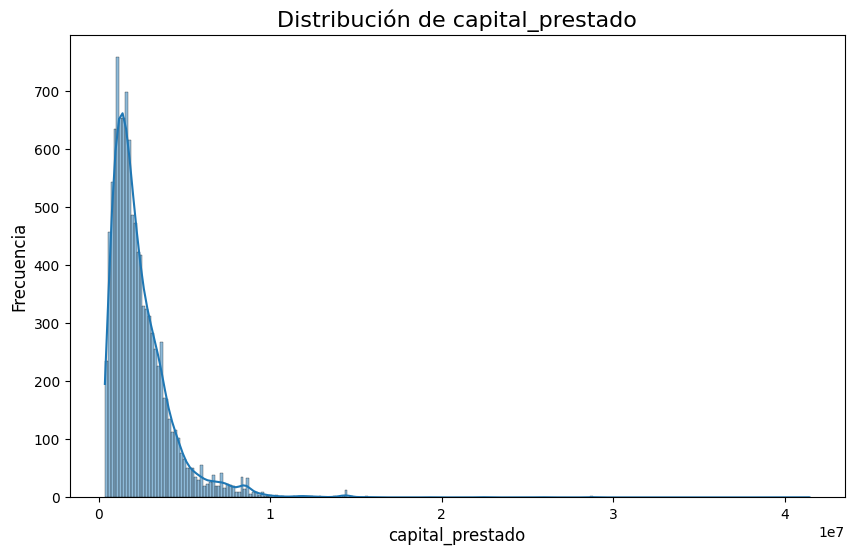

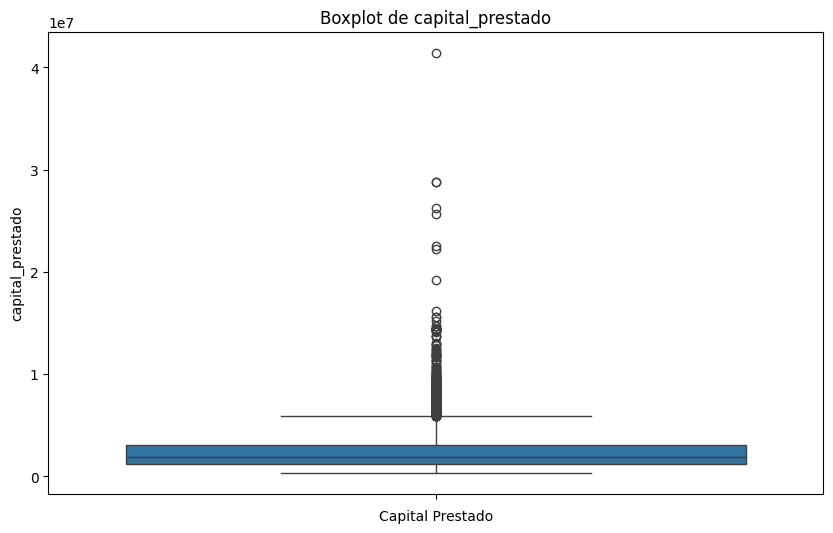

In [28]:
plt.figure(figsize=(10, 6))

# Crea el histograma con seaborn.
# 'kde=True' añade una línea de densidad de probabilidad, muy útil para entender la forma de la distribución.
sns.histplot(data=df, x='capital_prestado', kde=True)

# Añade título y etiquetas para los ejes
plt.title('Distribución de capital_prestado', fontsize=16)
plt.xlabel('capital_prestado', fontsize=12)
plt.ylabel('Frecuencia', fontsize=12)

# Muestra el gráfico
plt.show()

plt.figure(figsize=(10, 6))
sns.boxplot(data=df, y='capital_prestado')
plt.title('Boxplot de capital_prestado')
plt.xlabel('Capital Prestado')
plt.show()

**Interpretacion y analisis de la variable Capital Prestado**

**1. Distribucion sesgada a la derecha**

+ La mayoria de los prestamos se concentran en montos bajos o medianos

+ Solo un pequeño grupo de clientes recibe creditos muy altos

+ La cartera de la organizacion esta dominada por creditos pequeños, lo cual puede ser positivo en terminos de diversificacion del riesgo, ya que ua mayor base de clientes reduce la dependencia de pocos prestamos grandes

**2. Presencia de outliers (prestamos extremadamente altos)**

+ El boxplot muestra que existen creditos con valores muy superiores a la media, algunos que incluso superan los 40 millones

+ Estos casos pueden representar:
  + Clientes premium o estrategicos a quienes la organizacion confia grandes montos

  + Posibles errores en el registro de datos

  + Riesgo de concentracion, ya que un solo credito de alto valor puede general perdidas importantes si entra en mora

**3. Implicaciones para la organizacion**

+ El analisis permite a la empresa identificar el rango tipico de creditos otorgados y revisar su politica de asignacion

+ Muestra que la mayoria de clientes acceden a montos bajos, lo cual da estabilidad

+ Sirve como insumo para mejorar politicas de credito, control de riesgos y depuracion de datos



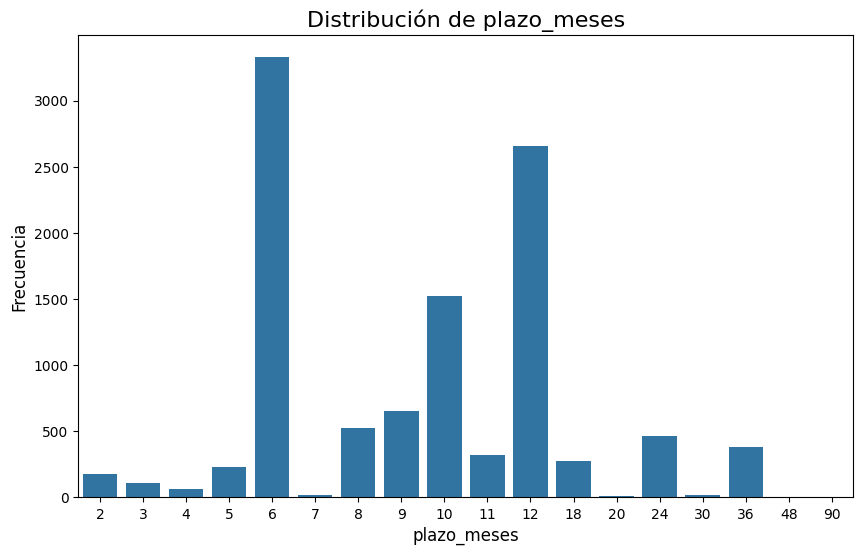

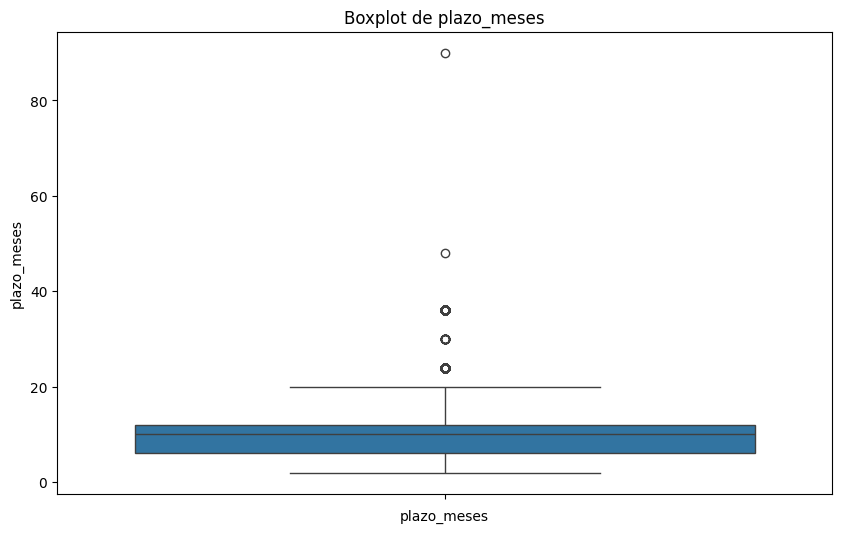

In [26]:
plt.figure(figsize=(10, 6))

# Crea el countplot con seaborn.
sns.countplot(data=df, x='plazo_meses')

# Añade título y etiquetas para los ejes
plt.title('Distribución de plazo_meses', fontsize=16)
plt.xlabel('plazo_meses', fontsize=12)
plt.ylabel('Frecuencia', fontsize=12)

# Muestra el gráfico
plt.show()

plt.figure(figsize=(10, 6))
sns.boxplot(data=df, y='plazo_meses')
plt.title('Boxplot de plazo_meses')
plt.xlabel('plazo_meses')
plt.show()

**Interpretacion y analisis de la variable Plazo Meses**

**1. Concentracion en plazos especificos**

+ La mayor parte de los creditos se otorgan a 6 meses, 10 meses y 12 meses, lo que indica que estos son los productos mas demandados por los cliente o los mas ofrecidos por la entidad

+ Esto puede responder a estrategias comerciales (ej. promociones a 6 y 12 meses) o a preferencias de los clientes por plazos cortos/medios

**2. Menor frecuencia en plazos largos**

+ Plazos como 7, 20, 30, 48 o 90 meses son poco frecuentes

+ Esto sugiere que la organizacion tiene menor penetracion en creditos de largo plazo, lo que puede representar una oportunidad de negocio si se quiere ampliar la oferta para clientes que buscan financiamiento mas extendido

**3. Presencia de valores atipicos (outliers)**

+ El boxplot muestra valores de hasta 90 meses, muy por encima del rango intercuartilico

+ Esto puede reflejar productos especiales (ej. hipotecarios o de inversion) o errores de captura de datos

**4. Implicaciones en la organizacion**

+ La alta concentracion en plazos de 6 a 12 meses puede generar dependencia de esos productos, lo que expone al riesgo de que si cambian las condiciones del mercado, los clientes migren facilmente

+ Los plazos largos podrian implicar mayor riesgo de impago, pero tambien un mayor ingreso por intereses, la entidad puede decidir si fortalecer esa linea o concentrarse en plazos cortos mas seguros

Es valioso porque permite a la organizacion tomar decisiones sobre:

+ Estrategia de producto

+ Gestion del riesgo

+ Oportunidades de mercado

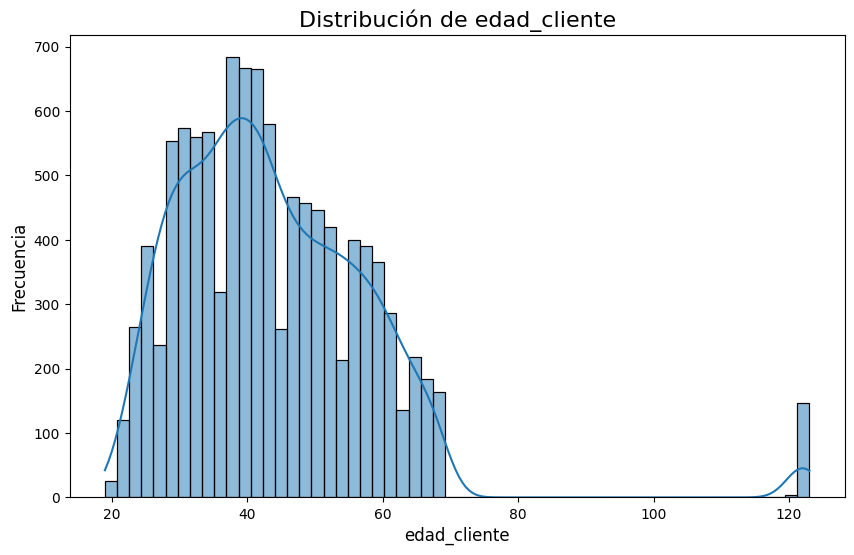

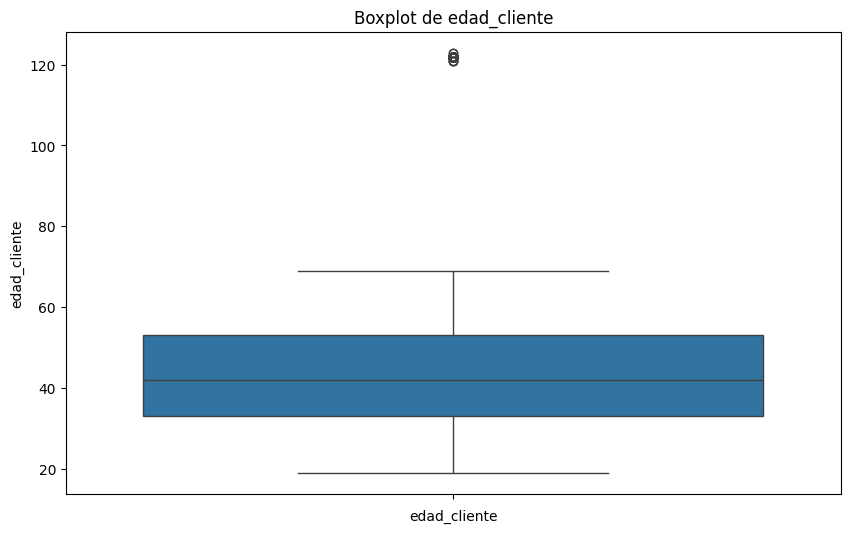

In [27]:
plt.figure(figsize=(10, 6))

# Crea el histograma con seaborn.
# 'kde=True' añade una línea de densidad de probabilidad, muy útil para entender la forma de la distribución.
sns.histplot(data=df, x='edad_cliente', kde=True)

# Añade título y etiquetas para los ejes
plt.title('Distribución de edad_cliente', fontsize=16)
plt.xlabel('edad_cliente', fontsize=12)
plt.ylabel('Frecuencia', fontsize=12)

# Muestra el gráfico
plt.show()

plt.figure(figsize=(10, 6))
sns.boxplot(data=df, y='edad_cliente')
plt.title('Boxplot de edad_cliente')
plt.xlabel('edad_cliente')
plt.show()

**Interpretacion y analisis de la variable Eded Cliente**

**1. Distribucion de edades**

+ La mayor concentracion de clientes esta entre los 30 y 60 años, lo que indica que la organizacion presta mayormente a adultos en etapa productiva, lo cual es coherente con el perfil de clientes que suelen solicitar creditos

+ Hay un grupo importante en los 20 - 30 años, lo que muestra que tambien existen clientes jovenes que acceden a financiamiento

+ Se observan valores entre los 120 y 123 años, lo cual es altamente improbable y apunta a errores en la calidad de los datos (quizas registros mal digitados o campos sin validar)

**2. Boxplot**

+ Refuerza lo anterior: la mayoria de los clientes se concentra en un rango razonable (20 - 70 años)

+ Los outliers (>100 años) son claramente visibles y no representan clientes reales, sino anomalias que deberian tratarse en la etapa de ingenieria de caracteristicas

**3. Implicaciones en la organizacion**

+ Conocer la distribucion de edades ayuda a segmentar clientes. Por ejemplo, saber que la mayoria esta en 30 - 60 años permite diseñar productor financieros adaptados a este rango (creditos hipotecarios, empresariales, consumo)

+ La organizacion puede orientar campañas especificas:
  + Jovenes (20 - 30) -> Creditos educativos, empredimiento, consumo

  + Adultos maduros (40 - 60) -> Vivienda, consolidacion de deudas, creditos grandes.



In [28]:
df["salario_cliente"].sort_values(ascending=False).head(10)

,salario_cliente
5735,22000000000
2866,16991100000
7014,13258352050
7043,12450806583
7041,8252584000
7070,7170914725
7053,4857353453
7116,4663274549
7110,4067140000
7058,3979311000


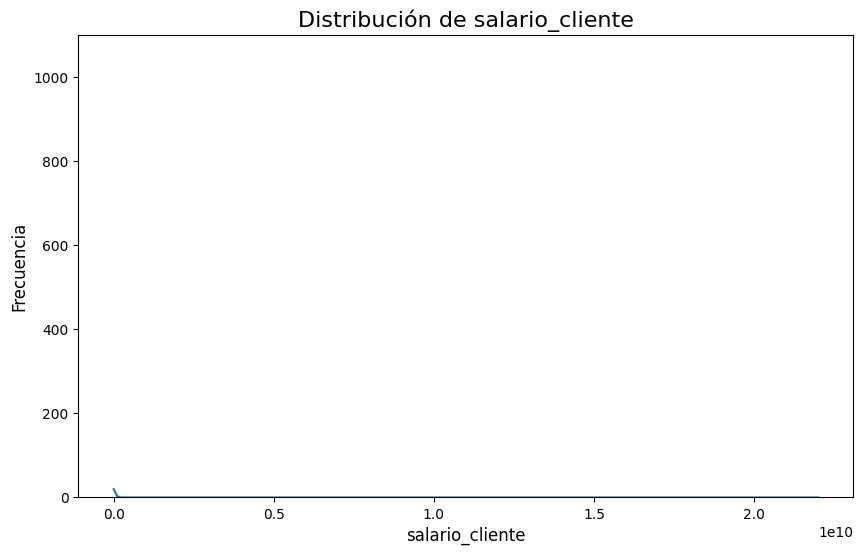

In [29]:
plt.figure(figsize=(10, 6))
# Crea el histograma con seaborn.
# 'kde=True' añade una línea de densidad de probabilidad, muy útil para entender la forma de la distribución.
sns.histplot(data=df, x='salario_cliente', kde=True)

# Añade título y etiquetas para los ejes
plt.title('Distribución de salario_cliente', fontsize=16)
plt.xlabel('salario_cliente', fontsize=12)
plt.ylabel('Frecuencia', fontsize=12)
# Muestra el gráfico
plt.show()

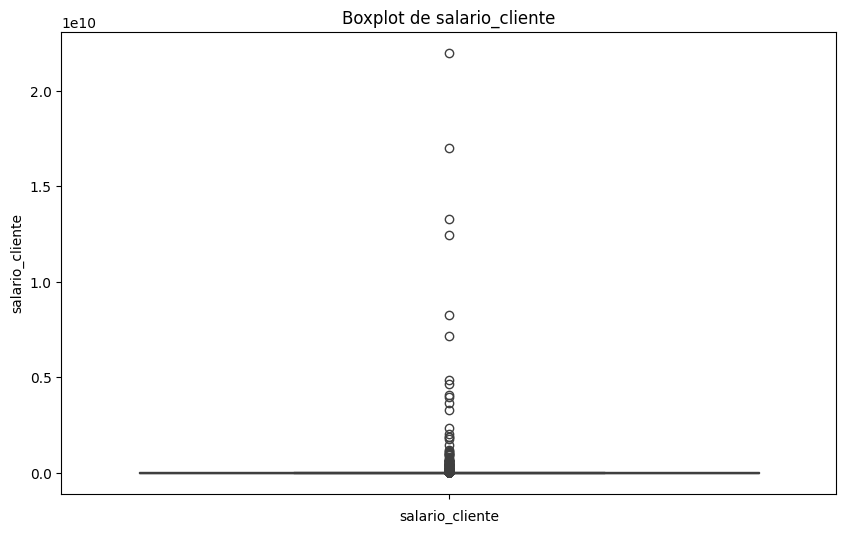

In [30]:
plt.figure(figsize=(10, 6))
sns.boxplot(data=df, y='salario_cliente')
#plt.ylim(0, 20000000)
plt.title('Boxplot de salario_cliente')
plt.xlabel('salario_cliente')
plt.show()

In [31]:
df.salario_cliente.value_counts()

,count
salario_cliente,
3000000,829
5000000,798
2000000,787
4000000,617
2500000,525
...,...
3218083,1
6407000,1
1907000,1


In [32]:
y = np.log1p(22000000000)
print(y)

y_log = 23.81430829035018
y_real = np.expm1(y_log)
print(y_real)

23.81430829035018
21999999999.99996


In [33]:
y_real = np.expm1(15)
print(y_real)

3269016.3724721107


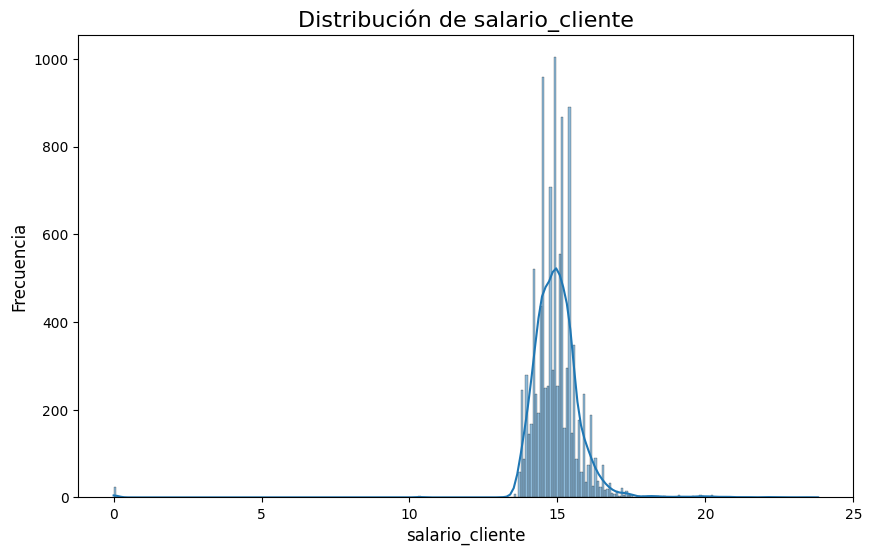

In [34]:
plt.figure(figsize=(10, 6))
# Crea el histograma con seaborn.
# 'kde=True' añade una línea de densidad de probabilidad, muy útil para entender la forma de la distribución.
sns.histplot(x=np.log1p(df['salario_cliente']), kde=True)

# Añade título y etiquetas para los ejes
plt.title('Distribución de salario_cliente', fontsize=16)
plt.xlabel('salario_cliente', fontsize=12)
plt.ylabel('Frecuencia', fontsize=12)
# Muestra el gráfico
plt.show()

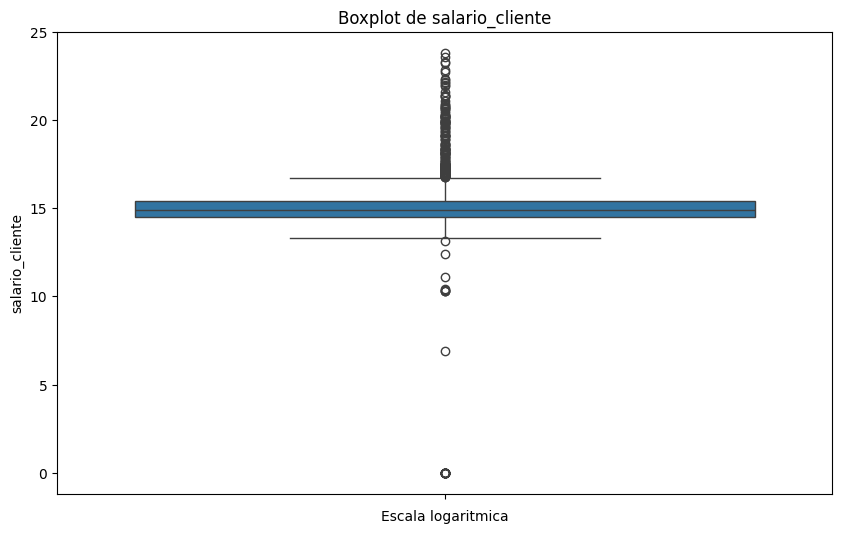

In [35]:
#Log (1+x)
plt.figure(figsize=(10, 6))
sns.boxplot(y=np.log1p(df['salario_cliente']))
plt.title('Boxplot de salario_cliente')
plt.xlabel('Escala logaritmica')
plt.show()

**Analisis de la variable Salario Cliente**

**1. Histograma**

+ La transformacion logaritmica revela que la amyoria de los salarios se concentran en un rango relativamente estable (alrededor de 15 en logaritmo) aproximadamente 3,000,000

+ Sin la transformcion, los salarios extremos ocultaban la froam real de la distribucion

+ El histograma muestra una distribucion asimetrica, con ligera cola a la derecha

+ El histograma con escala logaritmica permite entender la tedencia central y la dispersion real de los salarios de los clientes sin que los outliers distorsiones la vista

**2. Boxplot**

+ El 50% de la poblacion esta relativamente concentrado en un nivel bajo-medio de ingresos aprox 3,000,000

+ Existen personas con ingresos desproporcionadamente altos

+ El bigote inferior muestra la presencia de clientes con ingresos muy bajos o nulos

**3. Implicaciones en la organizacion**

+ Permite identificar el rango tipico de ingresos de los clientes, lo cual es util para diseñar productos financieros adaptados al perfil promedio

+ La cola a la derecha sugiere que hay un grupo reducido con mayores ingresos que podria ser objetivo de productos premium



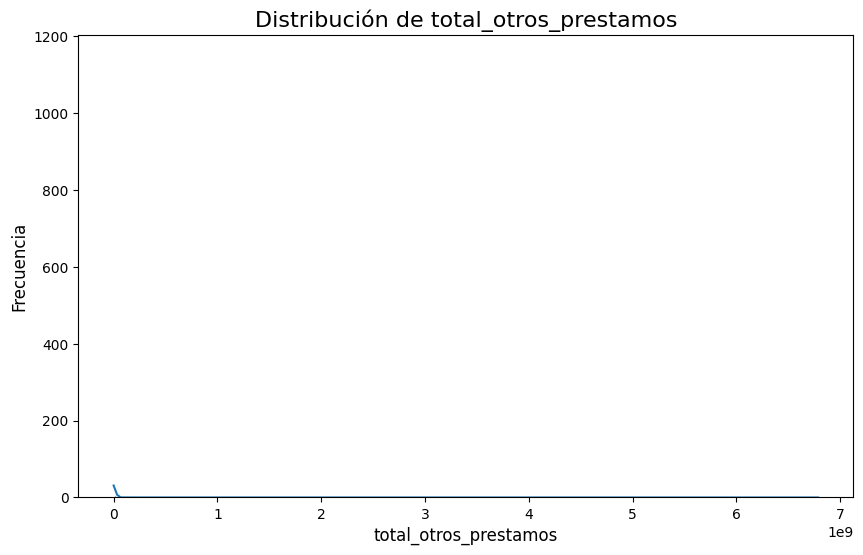

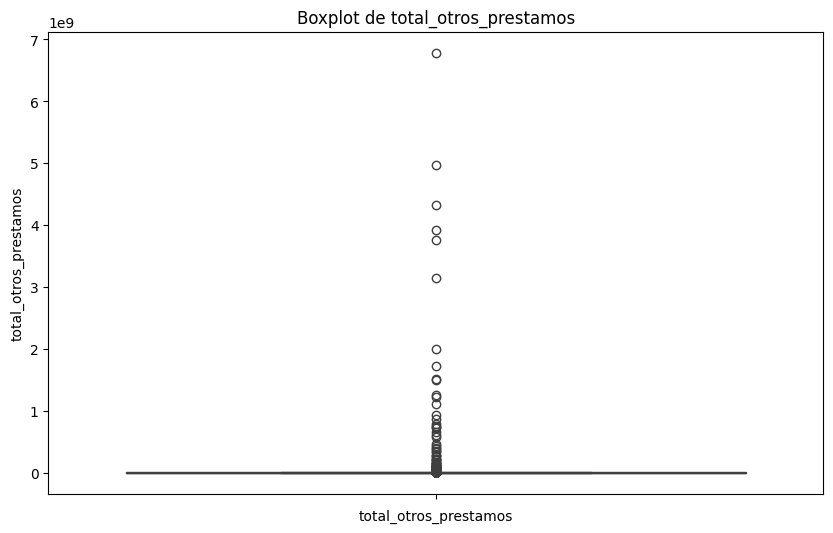

In [36]:
plt.figure(figsize=(10, 6))

# Crea el histograma con seaborn.
# 'kde=True' añade una línea de densidad de probabilidad, muy útil para entender la forma de la distribución.
sns.histplot(data=df, x='total_otros_prestamos', kde=True)

# Añade título y etiquetas para los ejes
plt.title('Distribución de total_otros_prestamos', fontsize=16)
plt.xlabel('total_otros_prestamos', fontsize=12)
plt.ylabel('Frecuencia', fontsize=12)

# Muestra el gráfico
plt.show()

plt.figure(figsize=(10, 6))
sns.boxplot(data=df, y='total_otros_prestamos')
plt.title('Boxplot de total_otros_prestamos')
plt.xlabel('total_otros_prestamos')
plt.show()

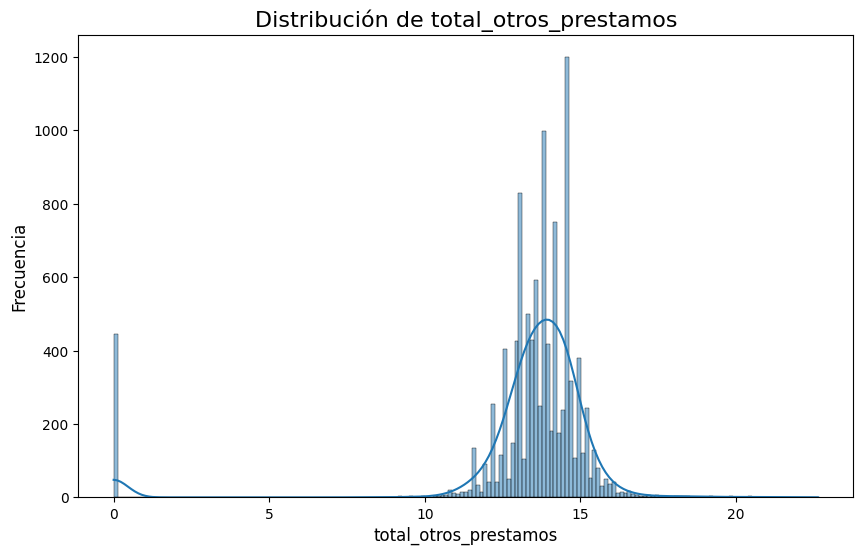

In [37]:
plt.figure(figsize=(10, 6))
# Crea el histograma con seaborn.
# 'kde=True' añade una línea de densidad de probabilidad, muy útil para entender la forma de la distribución.
sns.histplot(x=np.log1p(df['total_otros_prestamos']), kde=True)

# Añade título y etiquetas para los ejes
plt.title('Distribución de total_otros_prestamos', fontsize=16)
plt.xlabel('total_otros_prestamos', fontsize=12)
plt.ylabel('Frecuencia', fontsize=12)
# Muestra el gráfico
plt.show()

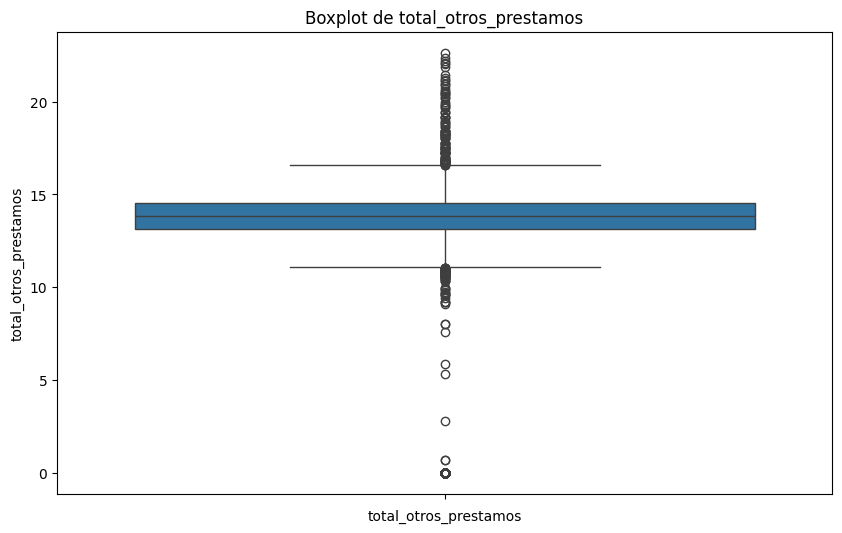

In [38]:
#Log (1+x)
plt.figure(figsize=(10, 6))
sns.boxplot(y=np.log1p(df['total_otros_prestamos']))
plt.title('Boxplot de total_otros_prestamos')
plt.xlabel('total_otros_prestamos')
plt.show()

In [39]:
y_real = np.expm1(15)
print(y_real)

3269016.3724721107


**Analisis de la variable Total Otros Prestamos**

**1. Histograma**

+ Se observa un gran grupo acumulado en 0, clientes que no tienen otros prestamos reportados

+ El grueso de la distribucion se concentra entre valores log1p equivalente aproximadamente a 13-15 (442,412 - 3,000,000)

+ La forma es casi normal en la parte central, aunque con ligeras colas a los extremos

**2. Boxplot**

+ La mediana se ubica alrededor de 13-14 log1p (442,412 - 1,202,603), consistente con el histograma

+ Bastante estrecho lo que confirma que la mayoria de los clientes con prestamos tienen un comportamiento similar

+ Mas del 25% de los clientes estan muy endeudados con otros prestamos

**3. Implicaciones en la organizacion**

+ Se puede generar una oportunidad con los clientes que no tienen otros prestamos

+ La presencia de outliers hacia arriba es un indicador de riesgo potencial, ya que son clientes con mas obligaciones

+ Los outliers en 0 no son outliers negativo sino un grupo de clientes sin deuda externa que puede ser atractivo para nuevas colocaciones de credito


In [40]:
y_real = np.expm1(14)
print(y_real)

1202603.2841647768


In [41]:
df.cuota_pactada.value_counts()

,count
cuota_pactada,
205990,13
171015,12
500578,12
142664,11
166667,10
...,...
95173,1
82066,1
142537,1


In [42]:
df["cuota_pactada"].sort_values(ascending=False).head(10)

,cuota_pactada
7133,3816752
5028,2671342
7032,2525162
7108,2439394
7107,2355457
315,2219827
5430,2199518
7064,2165346
1063,2156598
10707,2140141


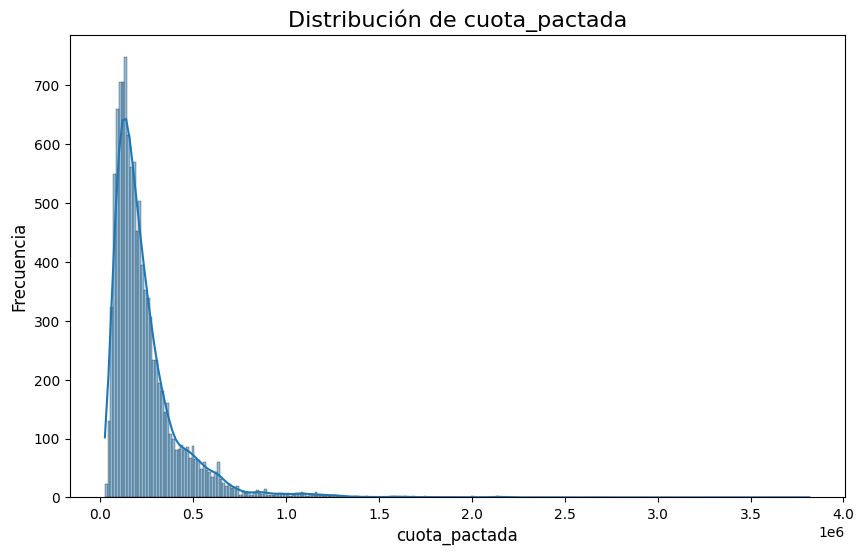

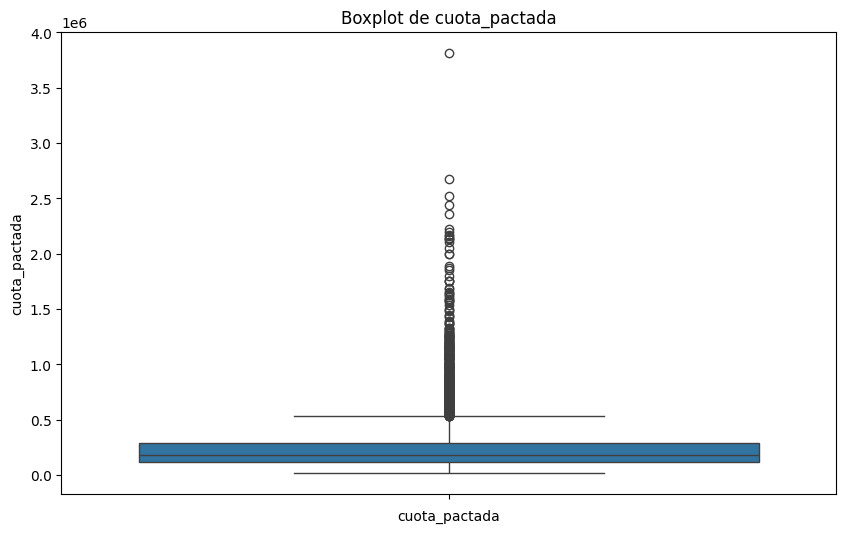

In [43]:
plt.figure(figsize=(10, 6))

# Crea el histograma con seaborn.
# 'kde=True' añade una línea de densidad de probabilidad, muy útil para entender la forma de la distribución.
sns.histplot(data=df, x='cuota_pactada', kde=True)

# Añade título y etiquetas para los ejes
plt.title('Distribución de cuota_pactada', fontsize=16)
plt.xlabel('cuota_pactada', fontsize=12)
plt.ylabel('Frecuencia', fontsize=12)

# Muestra el gráfico
plt.show()

plt.figure(figsize=(10, 6))
sns.boxplot(data=df, y='cuota_pactada')
plt.title('Boxplot de cuota_pactada')
plt.xlabel('cuota_pactada')
plt.show()

**Analisis de la variable Cuota Pactada**

**1. Histograma**

+ La distribucion es altamente sesgada a la derecha

+ La mayoria de las cuotas pactadas se concentras en valores bajos, entre 24,361 y 500,000 aproximadamente

+ Existe una larga cola de valores muy altos, aunque son pocos afectan la dispersion general

+ La gran mayoria de clientes tienen cuotas relativamente bajas mientras que un grupo tiene cuotas excepcionalmente altas

**2. Boxplot**

+ Confirma la asimetria y presencia de muchos outliers hacia valores altos

+ La mediana se encuentra bastante baja en comparacion con el rango total, lo que indica que mas del 50% de los clientes pagan cuotas relativamente bajas

+ Los valores extremos no parecen ser errores, sino clientes con prestamos grandes o condiciones financieras especiales

**3. Implicaciones en la empresa**

+ El negocio puede dividir a los clientes en grupos:

  + Clientes de bajo monto pagan cuotas bajas posiblemente con mayor estabilidad

  + Clientes de alto monto representan riesgo mayor si incumplen pero tambien genera mas ingresos

+ Los lcientes con cuotas altas requieren un monitoreo mas cercano ya que el impacto de impago es mucho mayor

+ Para los lcientes con cuotas altas conviene diseñar planes de refinanciamiento o seguros de pago que reduzca la exposicion al riesgo del banco

+ Para los clientes de cuotas bajas se pueden ofrecer planes de fidelizacion o microcreditos adicionales

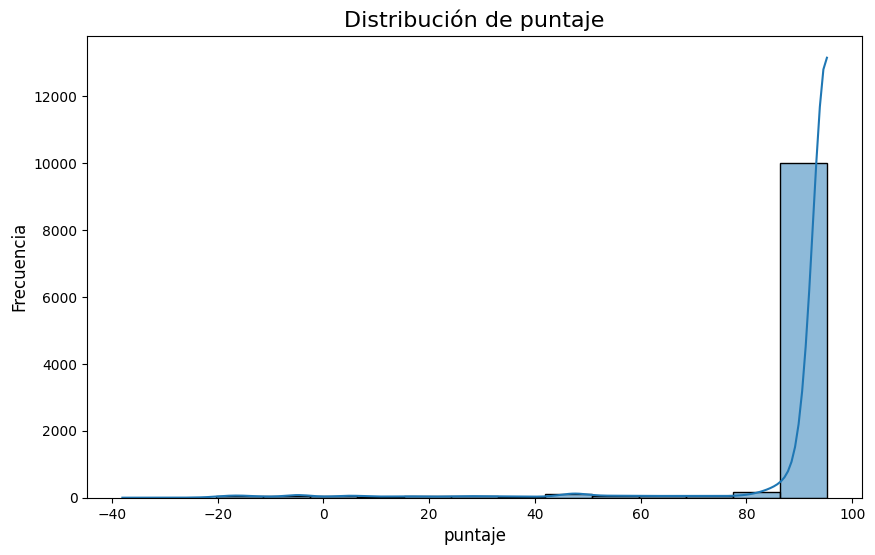

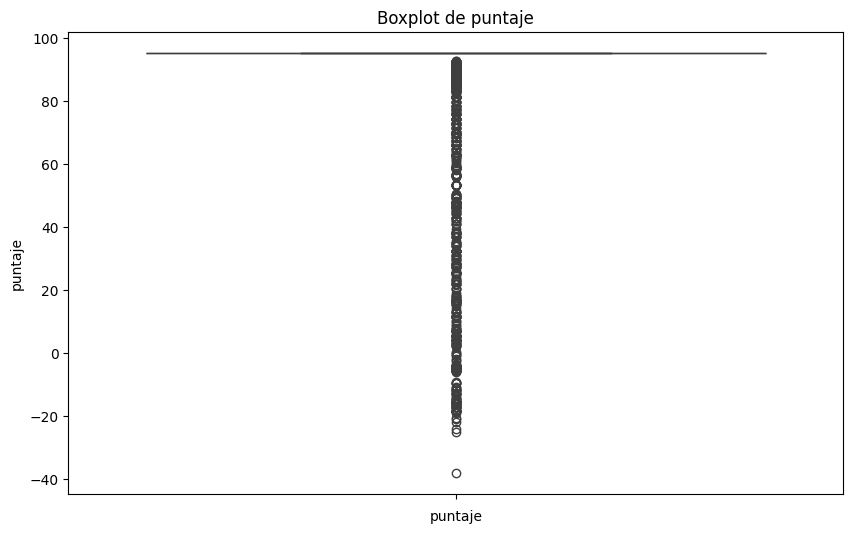

In [44]:
plt.figure(figsize=(10, 6))

# Crea el histograma con seaborn.
# 'kde=True' añade una línea de densidad de probabilidad, muy útil para entender la forma de la distribución.
sns.histplot(data=df, x='puntaje', kde=True)

# Añade título y etiquetas para los ejes
plt.title('Distribución de puntaje', fontsize=16)
plt.xlabel('puntaje', fontsize=12)
plt.ylabel('Frecuencia', fontsize=12)

# Muestra el gráfico
plt.show()

plt.figure(figsize=(10, 6))
sns.boxplot(data=df, y='puntaje')
plt.title('Boxplot de puntaje')
plt.xlabel('puntaje')
plt.show()

**Analisis de la variable Puntaje**

**1. Histograma**

+ La distribucion se concentra fuertemente en el rango 90-100, con un pico muy alto en ese segmento

+ Existen valores extraños en puntajes muy bajos e incluo negativos

+ La variabilidad es muy baja, casi todos estan en la parte superior

**2. Boxplot**

+ La mediana y la caja del boxplot estan situadas en valores cercanos a 95-100, confirmando que la mayoria de los datos estan agrupados arriba

+ Hay una gran cantidad de outliers hacia abajo, desde valores bajos hasta negativos

+ El rango intercuartilico es extremadamente pequeño lo que refleja muy poca dispersion en los datos

**3. Implicaciones para el negocio**

+ La mayoria de clientes son seguros o confiables

+ La empresa puede expandir cartera de manera mas segura con base solida de clientes de bajo riesgo

+ El alto puntaje puede usarse para premiar o fidelizar clientes


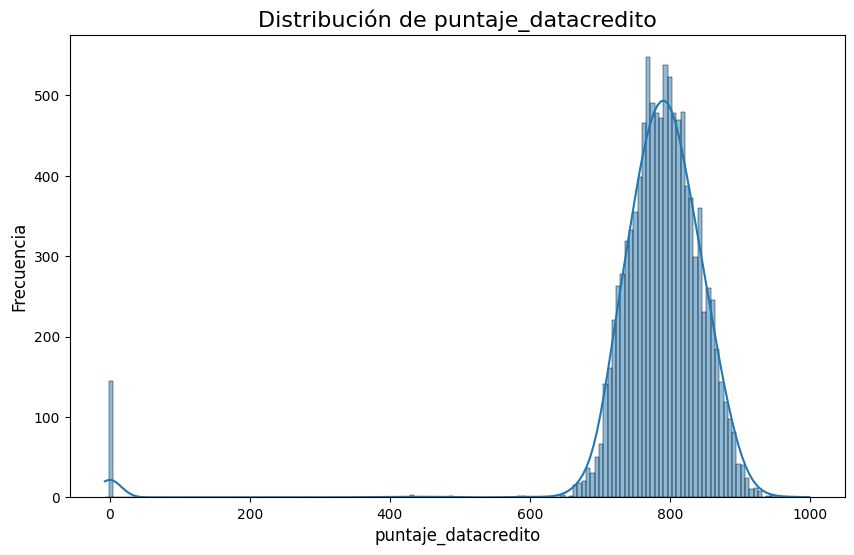

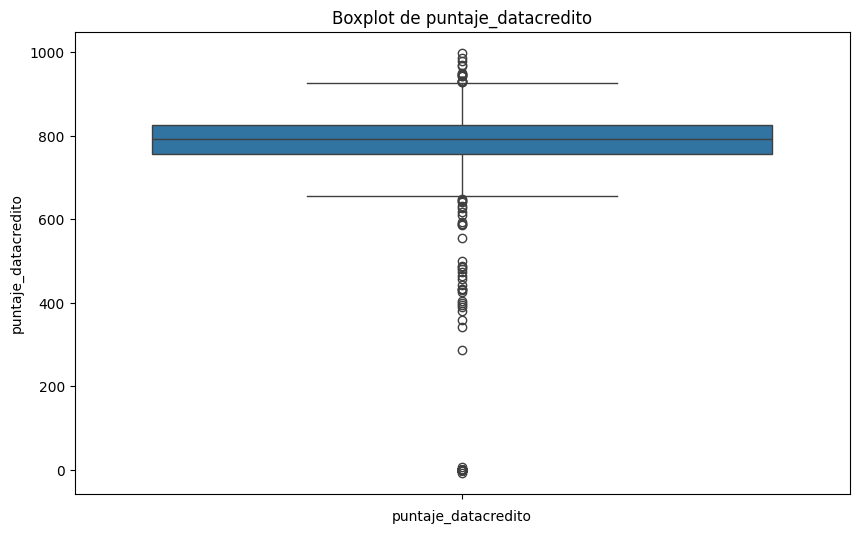

In [45]:
plt.figure(figsize=(10, 6))

# Crea el histograma con seaborn.
# 'kde=True' añade una línea de densidad de probabilidad, muy útil para entender la forma de la distribución.
sns.histplot(data=df, x='puntaje_datacredito', kde=True)

# Añade título y etiquetas para los ejes
plt.title('Distribución de puntaje_datacredito', fontsize=16)
plt.xlabel('puntaje_datacredito', fontsize=12)
plt.ylabel('Frecuencia', fontsize=12)

# Muestra el gráfico
plt.show()

plt.figure(figsize=(10, 6))
sns.boxplot(data=df, y='puntaje_datacredito')
plt.title('Boxplot de puntaje_datacredito')
plt.xlabel('puntaje_datacredito')
plt.show()

**Analisis de la variable Puntaje Datacredito**

**1. Histograma**

+ La mayor concentracion de clientes tiene puntajes entre 700 y 850 aproximadamente, con un pico fuerte cerca de 800

+ Existe un grupo reducido con puntajes bajos (<600) e incluso algunos casos son puntaje cercano a 0

+ La distribucion central se asemeja a una campana normal

+ La mayoria de clientes tienen un perfil de bajo riesgo

**2. Boxplot**

+ La mediana esta alrededor de 800, confirmando que la mayoria tiene un perfil de buen comportamiento crediticio

+ El rango intercuartilico esta entre aprox 750 y 850 mostrando que la dispersion es baja

+ Los outliers abajo son mas abudantes y criticos (puntajes de 0 incluso)

+ La organizacion cuenta con base estable, pero debe tener mecanismos de gestion diferenciada para los pocos clientes de riesgo alto

+ Los clientes con puntajes altos pueden ser tratados como clientes premium se les podria ofrecer mejores condiciones crediticias

**3. Implicaciones en el negocio**

+ La gran mayoría de clientes se encuentra en zona segura (700–850). Esto reduce el riesgo general del portafolio y fortalece la liquidez de la empresa.

+ Con clientes de puntajes altos, la empresa puede expandir créditos, aumentar montos y plazos, con bajo riesgo de mora.




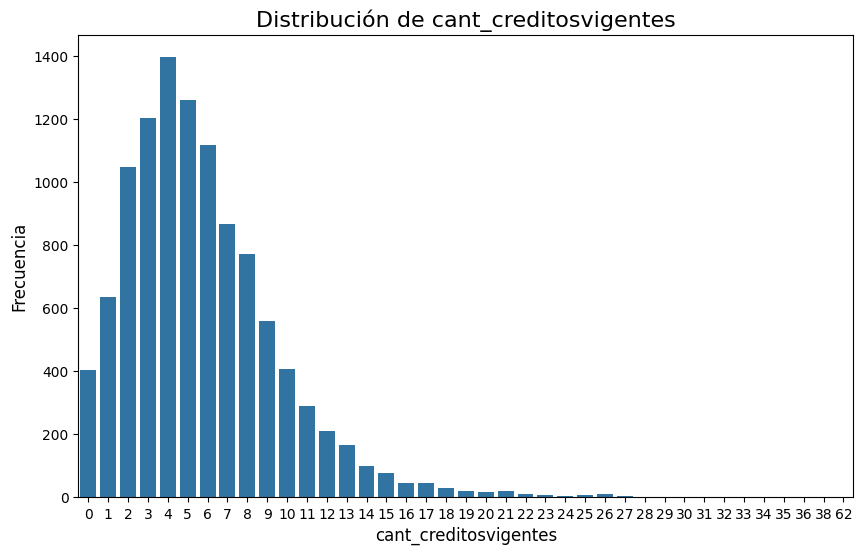

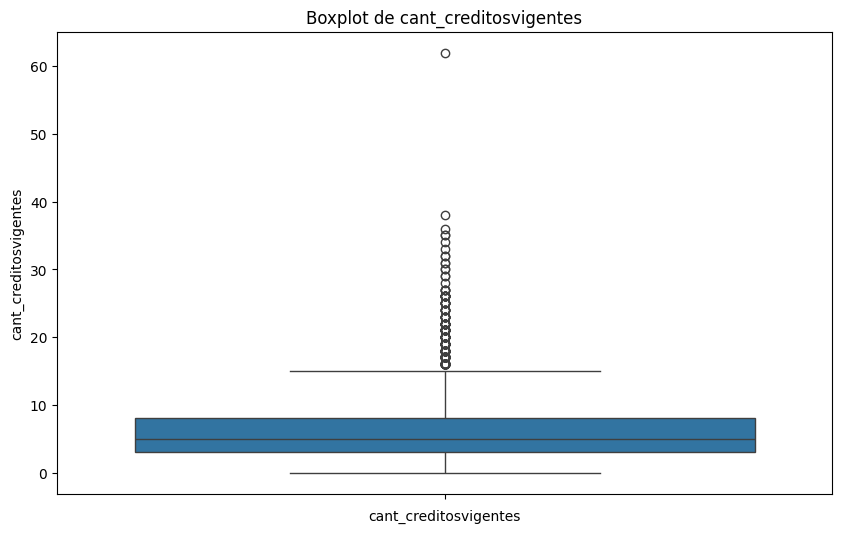

In [46]:
plt.figure(figsize=(10, 6))

# Crea el countplot con seaborn.
sns.countplot(data=df, x='cant_creditosvigentes')

# Añade título y etiquetas para los ejes
plt.title('Distribución de cant_creditosvigentes', fontsize=16)
plt.xlabel('cant_creditosvigentes', fontsize=12)
plt.ylabel('Frecuencia', fontsize=12)

# Muestra el gráfico
plt.show()

plt.figure(figsize=(10, 6))
sns.boxplot(data=df, y='cant_creditosvigentes')
plt.title('Boxplot de cant_creditosvigentes')
plt.xlabel('cant_creditosvigentes')
plt.show()

**Analisis de la variable Cantidad Creditos Vigentes**

**1. Countplot**

+ La mayoría de clientes tienen entre 3 y 6 créditos vigentes, siendo el valor más frecuente alrededor de 4 créditos

+ Se puede observar una distribución asimétrica positiva (cola larga a la derecha)

+ Existen pocos clientes con cantidades muy altas de créditos (más de 20 e incluso un caso con más de 60)

+ El patrón indica que los clientes suelen manejar un número moderado de créditos activos.

+ Los casos con 20, 30 o más créditos son outliers, poco comunes y posiblemente asociados a clientes corporativos, individuos con gran capacidad financiera, o a errores en el registro.

**2. Boxplot**

+ La mediana está en torno a 4–5 créditos.

+ El rango intercuartílico (Q1–Q3) va aproximadamente de 3 a 8 créditos.

+ Se detectan numerosos outliers hacia arriba (clientes con 15, 20, 30+ créditos).

+ La mayoría de clientes mantiene un perfil normal y saludable (entre 3 y 8 créditos).

+ Los clientes con muchos créditos vigentes pueden representar:

  + Oportunidad: clientes con gran capacidad de endeudamiento y confianza en el sistema financiero.

  + Riesgo: clientes sobreendeudados, con probabilidad más alta de incumplimiento.

** 3. Implicaciones en el negocio**

+ Clientes con 3–6 créditos son la norma y representan un nivel de riesgo manejable.

+ Bajo número de créditos (0–2): posibles clientes nuevos, con potencial de expansión en colocación de productos financieros.

+ Clientes con pocos créditos vigentes pueden ser objetivo para estrategias de cross-selling (colocar tarjetas, créditos de consumo, hipotecarios, etc.).



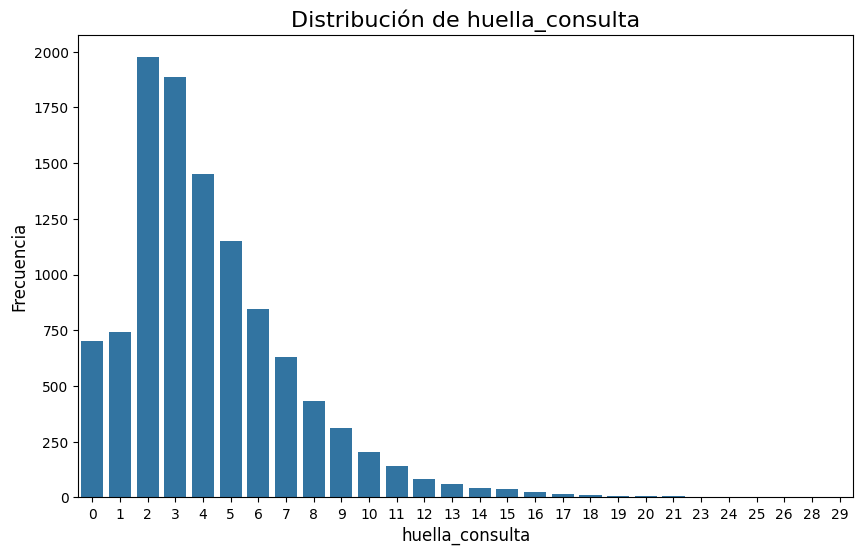

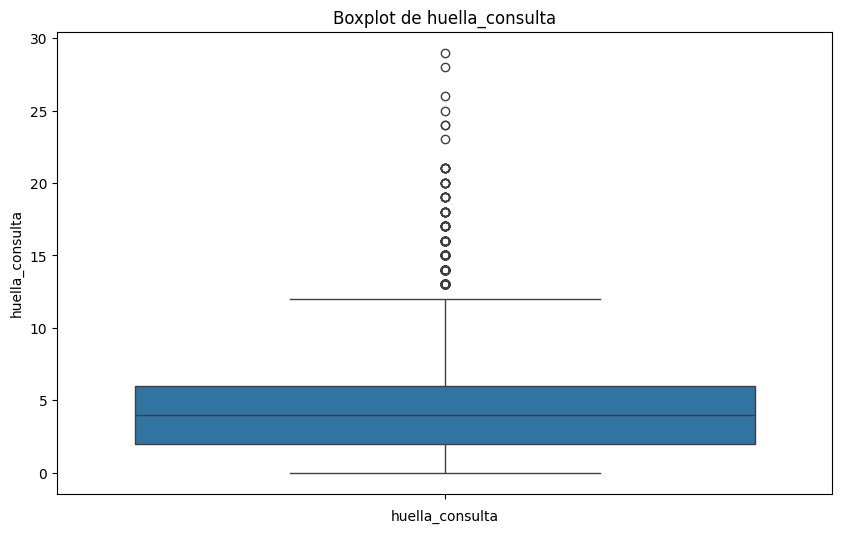

In [47]:
plt.figure(figsize=(10, 6))

# Crea el countplot con seaborn.
sns.countplot(data=df, x='huella_consulta')

# Añade título y etiquetas para los ejes
plt.title('Distribución de huella_consulta', fontsize=16)
plt.xlabel('huella_consulta', fontsize=12)
plt.ylabel('Frecuencia', fontsize=12)

# Muestra el gráfico
plt.show()

plt.figure(figsize=(10, 6))
sns.boxplot(data=df, y='huella_consulta')
plt.title('Boxplot de huella_consulta')
plt.xlabel('huella_consulta')
plt.show()

**Analisis sobre la variable Huella Consulta**

**1. Countplot**

+ La mayoría de los clientes tienen entre 2 y 5 consultas registradas.

+ Existe una distribución sesgada a la derecha, pocos clientes concentran valores muy altos de huella_consulta (más de 10, incluso hasta casi 30).

**2. Boxplot**

+ La mediana está alrededor de 3-4 consultas.

+ El rango intercuartílico (IQR) se encuentra entre 2 y 6 consultas, es decir, la mayoría de clientes se concentra en ese rango.

+ Los valores extremos (outliers) son numerosos, con clientes que superan las 12 consultas e incluso llegan a casi 30.

+ Esto confirma que, aunque la mayoría de clientes se comporta de manera “normal”, hay un grupo pequeño con comportamientos muy atípicos.

**3. Implicaciones en el negocio**

+ (Cliente con huella baja) Para el negocio, esto implica menor riesgo percibido, ya que no están siendo consultados por múltiples entidades al mismo tiempo.

+ Potencialmente, son clientes más estables y atractivos para otorgar crédito, pues su nivel de consultas es bajo.

+ Puede reflejar desesperación por acceder a crédito, lo cual está fuertemente asociado a sobreendeudamiento y posible incumplimiento.

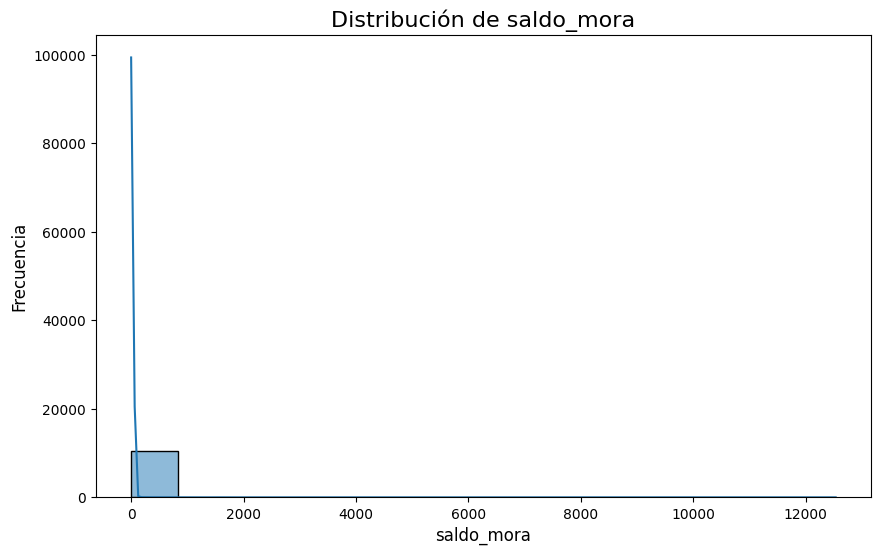

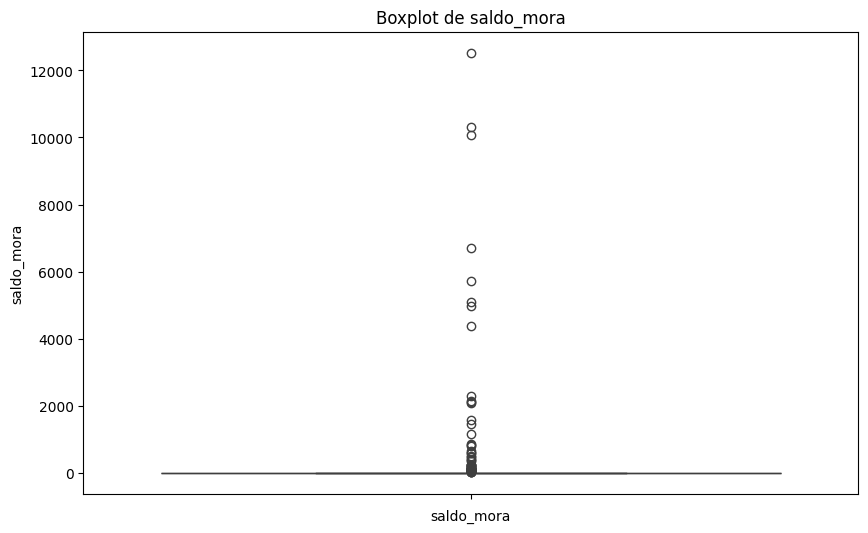

In [48]:
plt.figure(figsize=(10, 6))

# Crea el histograma con seaborn.
# 'kde=True' añade una línea de densidad de probabilidad, muy útil para entender la forma de la distribución.
sns.histplot(data=df, x='saldo_mora', kde=True)

# Añade título y etiquetas para los ejes
plt.title('Distribución de saldo_mora', fontsize=16)
plt.xlabel('saldo_mora', fontsize=12)
plt.ylabel('Frecuencia', fontsize=12)

# Muestra el gráfico
plt.show()

plt.figure(figsize=(10, 6))
sns.boxplot(data=df, y='saldo_mora')
plt.title('Boxplot de saldo_mora')
plt.xlabel('saldo_mora')
plt.show()

**Analisis de la variable Saldo Mora**


**1. Histograma**

+ La mayoría de los clientes tiene saldo_mora cercano a 0.

+ Existe una concentración muy alta en valores bajos, lo que indica que la gran mayoría de clientes presenta deudas pequeñas o nulas.

+ Se observan pocos clientes con saldos muy elevados (cola larga a la derecha).

**2.Boxplot**

+ La mediana está muy cercana a 0, confirmando que al menos el 50% de los clientes prácticamente no tiene mora.

+ Aparecen muchos outliers, con montos de mora muy altos (superiores incluso a 10,000).

+ La caja del boxplot es muy pequeña en comparación con la escala de valores, reforzando que la mayoría está en la franja baja, pero unos pocos clientes concentran deudas muy grandes.

**3. Implicaciones en el negocio**

+ La mayor parte de la cartera está sana: clientes al día o con atrasos mínimos.

+ Existe un amplio grupo de clientes confiables que podrían ser aprovechados para estrategias de cross-selling o financiamiento adicional.

+ Los outliers de saldo_mora pueden representar un alto riesgo para la cartera, ya que aunque son pocos clientes, concentran deudas muy grandes.

+ Establecer estrategias diferenciadas de cobranza:

  + Clientes con mora baja → recordatorios suaves.

  + Clientes con mora alta (outliers) → negociación intensiva, acuerdos de pago, reestructuración.



In [49]:
df.saldo_mora.value_counts()

,count
saldo_mora,
0.0,10552
30.0,2
132.0,1
5721.0,1
67.0,1
2145.0,1
366.0,1
238.0,1
63.0,1


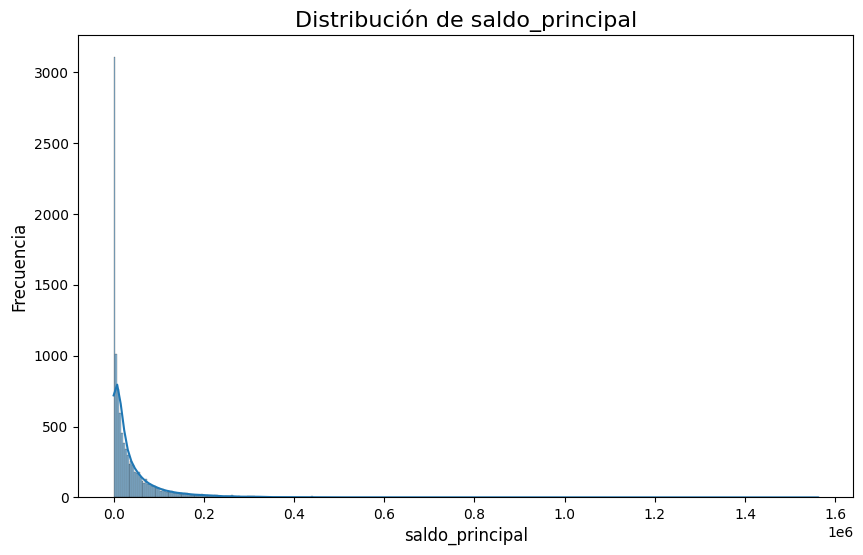

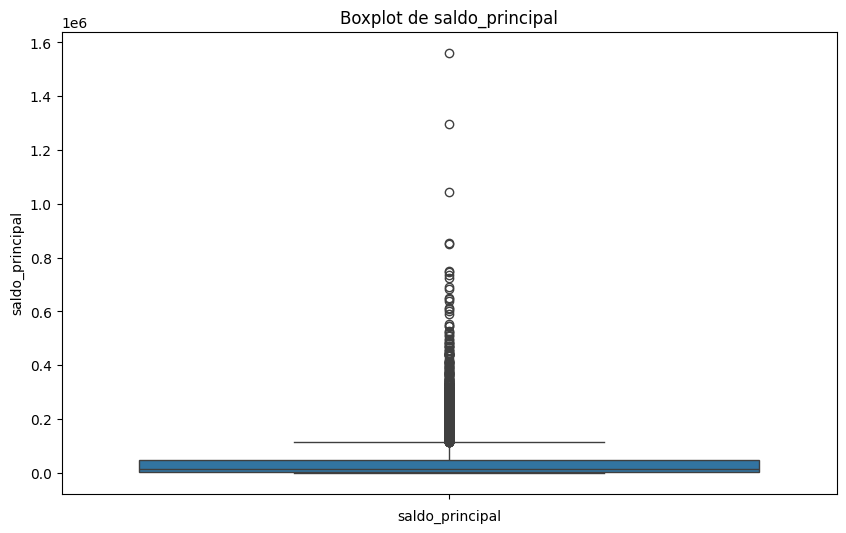

In [50]:
plt.figure(figsize=(10, 6))

# Crea el histograma con seaborn.
# 'kde=True' añade una línea de densidad de probabilidad, muy útil para entender la forma de la distribución.
sns.histplot(data=df, x='saldo_principal', kde=True)

# Añade título y etiquetas para los ejes
plt.title('Distribución de saldo_principal', fontsize=16)
plt.xlabel('saldo_principal', fontsize=12)
plt.ylabel('Frecuencia', fontsize=12)

# Muestra el gráfico
plt.show()

plt.figure(figsize=(10, 6))
sns.boxplot(data=df, y='saldo_principal')
plt.title('Boxplot de saldo_principal')
plt.xlabel('saldo_principal')
plt.show()

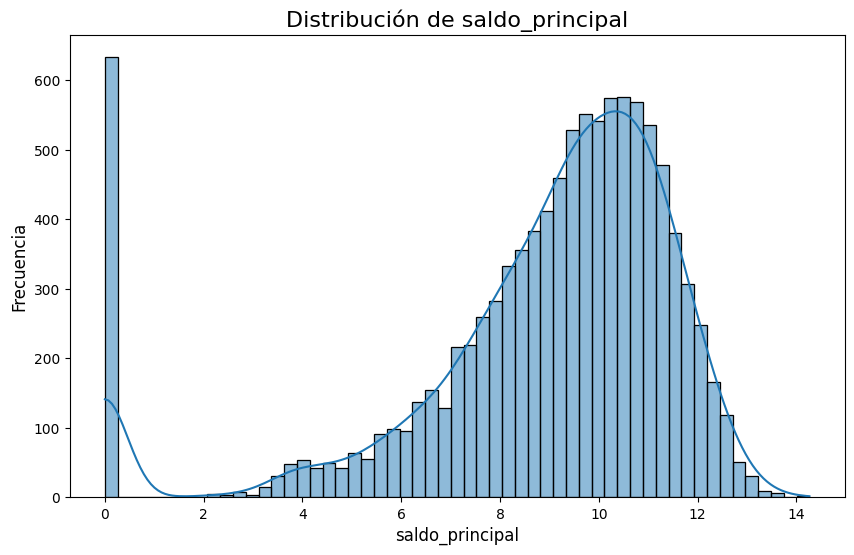

In [51]:
plt.figure(figsize=(10, 6))
# Crea el histograma con seaborn.
# 'kde=True' añade una línea de densidad de probabilidad, muy útil para entender la forma de la distribución.
sns.histplot(x=np.log1p(df['saldo_principal']), kde=True)

# Añade título y etiquetas para los ejes
plt.title('Distribución de saldo_principal', fontsize=16)
plt.xlabel('saldo_principal', fontsize=12)
plt.ylabel('Frecuencia', fontsize=12)
# Muestra el gráfico
plt.show()

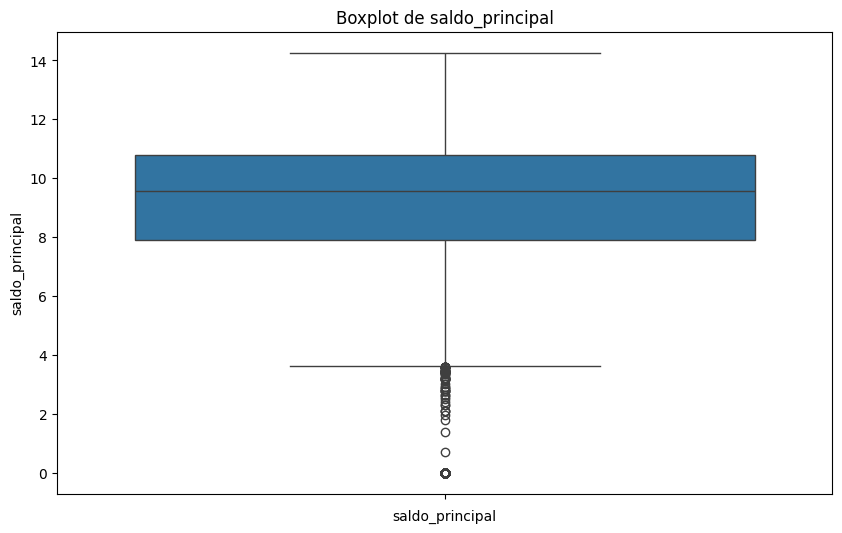

In [52]:
#Log (1+x)
plt.figure(figsize=(10, 6))
sns.boxplot(y=np.log1p(df['saldo_principal']))
plt.title('Boxplot de saldo_principal')
plt.xlabel('saldo_principal')
plt.show()

In [53]:
y_real = np.expm1(9.5)
print(y_real)

y_real = np.expm1(10)
print(y_real)


13358.726829661871
22025.465794806718


**Analisis de la variable Saldo Principal**

**1. Histograma**

+ Un gran número de clientes con saldo cercano a 0 (pico fuerte en la izquierda)

+ Una gran concentración alrededor de 9–11 en escala logarítmica

+ Aunque son pocos, estos clientes pueden representar un alto porcentaje del valor total de la cartera.


**2. Boxplot**

+ La mediana está cerca de 9.5–10 (13,358- 22,025) en escala log1p → la mayoría de clientes se concentra en saldos "altos"

+ El 50% de los clientes está concentrado en un rango relativamente estrecho dentro de la escala logarítmica.

+ Esto indica cierta homogeneidad en el grupo principal de clientes activos.

**3. Implicaciones en el negocio**

+ La mayor parte del saldo total puede estar concentrada en pocos clientes grandes.

+ Si se pierden, el negocio puede verse afectado.

+ Núcleo sólido de clientes activos.

+ Estrategia: fidelización, cross-selling, mantenimiento de confianza.


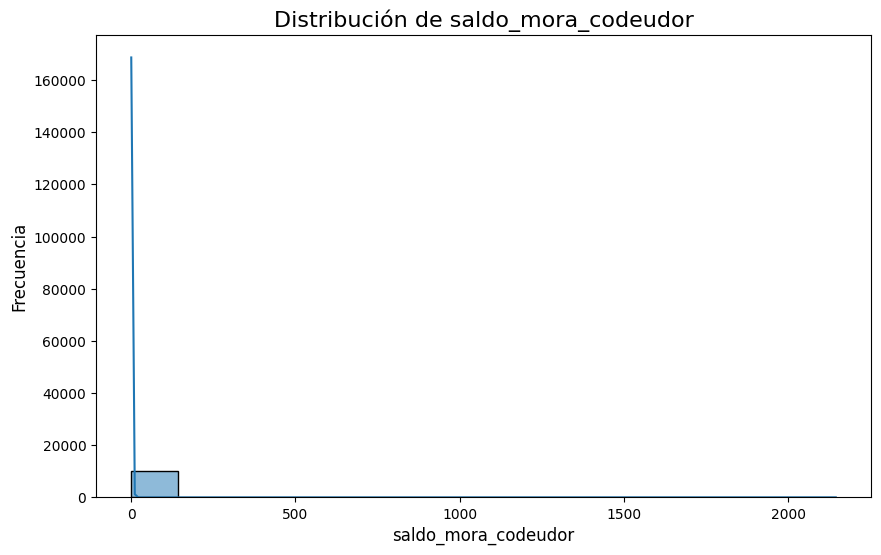

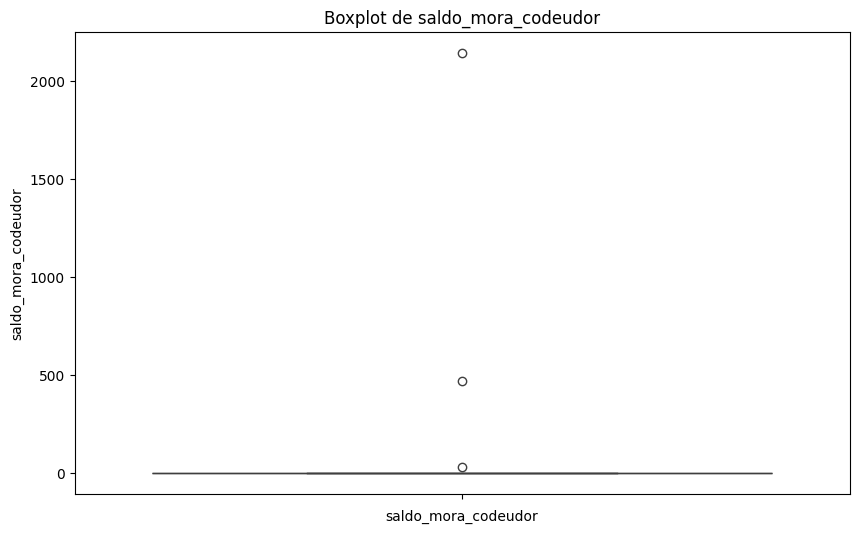

In [54]:
plt.figure(figsize=(10, 6))

# Crea el histograma con seaborn.
# 'kde=True' añade una línea de densidad de probabilidad, muy útil para entender la forma de la distribución.
sns.histplot(data=df, x='saldo_mora_codeudor', kde=True)

# Añade título y etiquetas para los ejes
plt.title('Distribución de saldo_mora_codeudor', fontsize=16)
plt.xlabel('saldo_mora_codeudor', fontsize=12)
plt.ylabel('Frecuencia', fontsize=12)

# Muestra el gráfico
plt.show()

plt.figure(figsize=(10, 6))
sns.boxplot(data=df, y='saldo_mora_codeudor')
plt.title('Boxplot de saldo_mora_codeudor')
plt.xlabel('saldo_mora_codeudor')
plt.show()

**Analisis variable saldo mora codeudor**

**1. Histograma**

+ La gran mayoría de las observaciones se concentran en saldo = 0

+ Esto significa que la mayoría de los codeudores no tienen mora o están al día con sus obligaciones

+ Es un dato positivo para la salud financiera de la cartera

+ Aunque la mayoría está en 0, existen algunos valores muy altos (hasta más de 2000).

+ Esto genera una distribución altamente sesgada a la derecha.

+ Son pocos casos, pero representan riesgos significativos.

**2. Boxplot**

+ El IQR está prácticamente en 0, lo que confirma que la mayoría absoluta de los codeudores no presentan mora

+ Se observan valores atípicos muy grandes: algunos en cientos y otros superiores a 2000

+ Estos outliers son casos de codeudores con moras muy elevadas, que distorsionan la distribución

+ El gráfico muestra que la masa central de datos está en 0, y unos pocos valores muy altos generan la dispersión

**3 Implicaciones en el negocio**

+ La mayoría de codeudores están al día → el sistema de garantías funciona bien y el riesgo está concentrado en pocos individuos.

+ Los pocos casos con moras muy altas son outliers de alto impacto:

  + Pueden representar montos significativos de pérdida potencial

  + Aunque sean pocos, su peso económico puede ser desproporcionado frente al resto

+ La estrategia no debería enfocarse en la masa central, sino en los outliers morosos








In [55]:
df.saldo_mora_codeudor.value_counts()

,count
saldo_mora_codeudor,
0.0,10170
2145.0,1
30.0,1
470.0,1


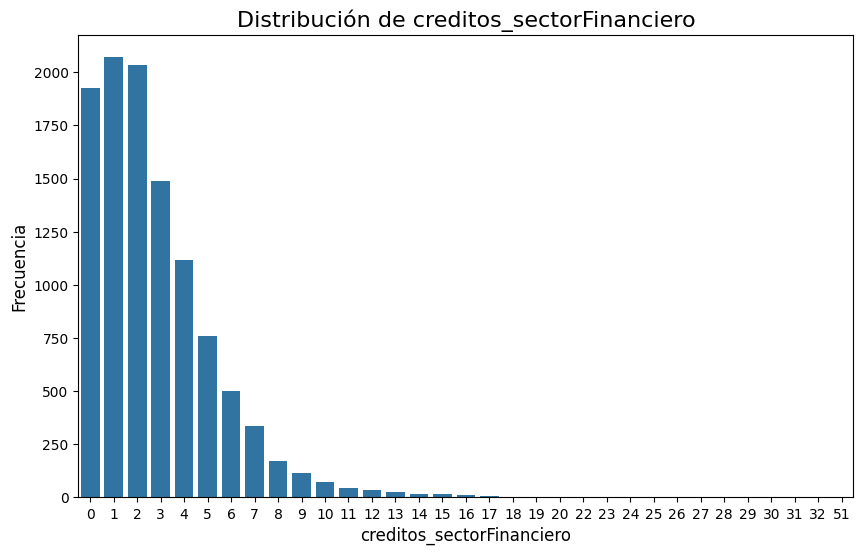

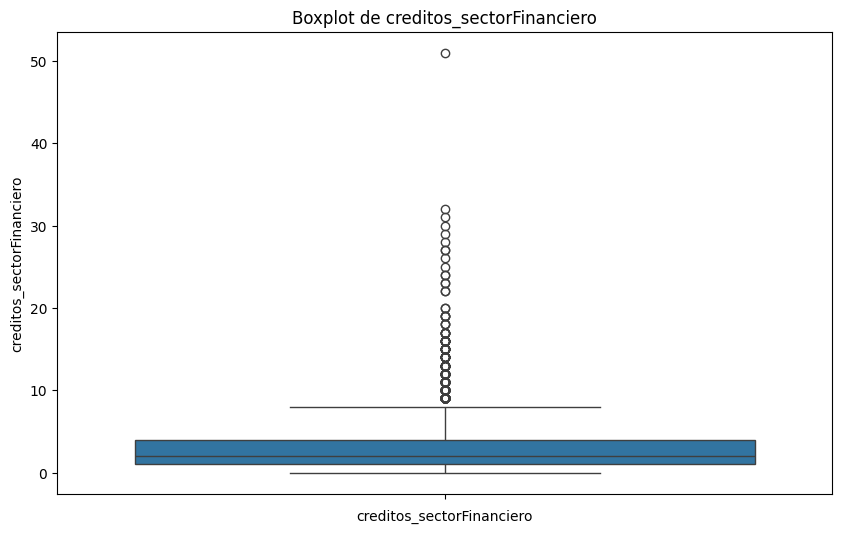

In [56]:
plt.figure(figsize=(10, 6))

# Crea el countplot con seaborn.
sns.countplot(data=df, x='creditos_sectorFinanciero')

# Añade título y etiquetas para los ejes
plt.title('Distribución de creditos_sectorFinanciero', fontsize=16)
plt.xlabel('creditos_sectorFinanciero', fontsize=12)
plt.ylabel('Frecuencia', fontsize=12)

# Muestra el gráfico
plt.show()

plt.figure(figsize=(10, 6))
sns.boxplot(data=df, y='creditos_sectorFinanciero')
plt.title('Boxplot de creditos_sectorFinanciero')
plt.xlabel('creditos_sectorFinanciero')
plt.show()

**Analisis de la variable creditos en el sector financiero**

**1. Countplot**

+ La gran mayoría de clientes tiene entre 0 y 4 créditos en el sector financiero.

+ A medida que aumenta el número de créditos, la frecuencia cae drásticamente.

+ Existen clientes con más de 20 créditos, e incluso un máximo cercano a 50.

+ Estos son casos muy poco comunes pero importantes de monitorear.

**2. Boxplot**

+ La mediana está alrededor de 2 créditos → la mayoría de los clientes mantiene una baja exposición en número de créditos.

+ El IQR se concentra aproximadamente entre 1 y 3 créditos, confirmando que la mayoría de los clientes se mantiene en un rango controlado.

+ Aparecen muchos outliers desde 8 créditos en adelante, llegando incluso a más de 50.

+ Estos clientes son minoría, pero representan un riesgo financiero alto, pues tienen un nivel de endeudamiento en el sistema mucho mayor al promedio.

**3. Implicaciones en el negocio**

+ Los clientes con 10, 20 o 51 créditos son señales de alerta roja. Son candidatos extremos a sufrir sobreendeudamiento

+  El enorme grupo de clientes con solo 1 crédito es una oportunidad de negocio. Ya son clientes de crédito, lo que significa que superaron los filtros de riesgo y están familiarizados con los productos.



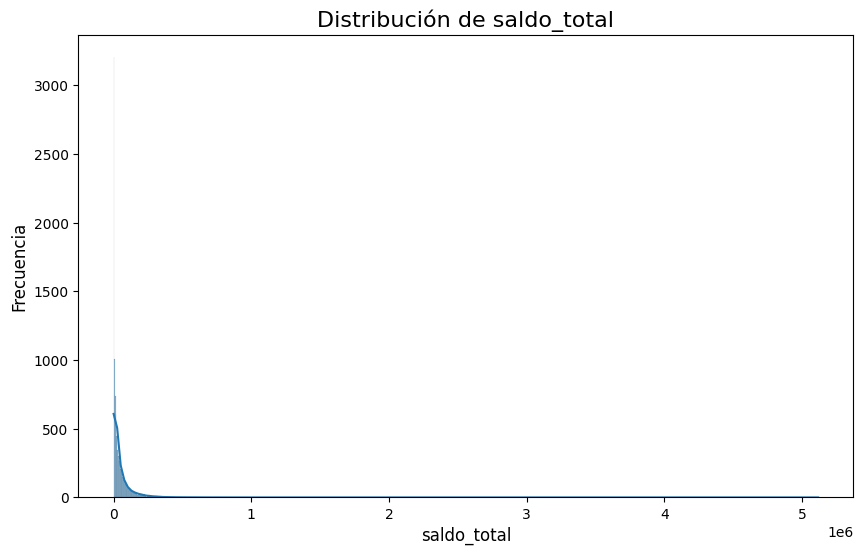

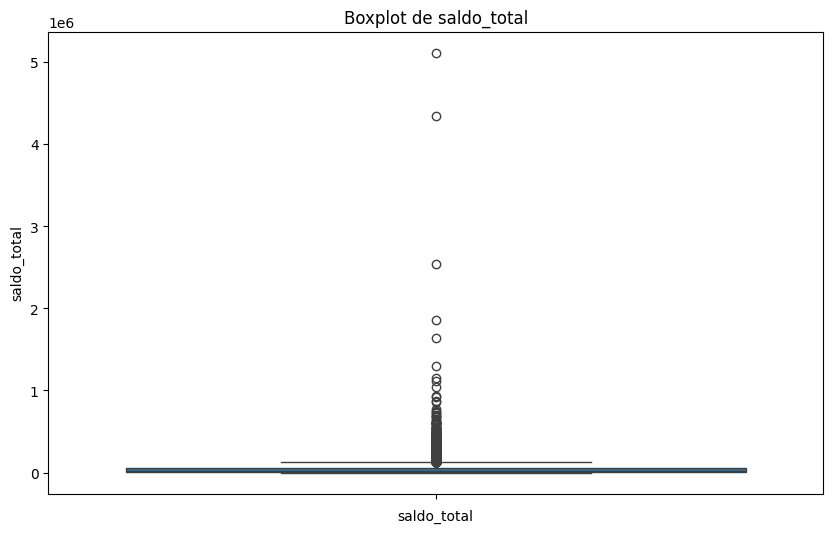

In [57]:
plt.figure(figsize=(10, 6))

# Crea el histograma con seaborn.
# 'kde=True' añade una línea de densidad de probabilidad, muy útil para entender la forma de la distribución.
sns.histplot(data=df, x='saldo_total', kde=True)

# Añade título y etiquetas para los ejes
plt.title('Distribución de saldo_total', fontsize=16)
plt.xlabel('saldo_total', fontsize=12)
plt.ylabel('Frecuencia', fontsize=12)

# Muestra el gráfico
plt.show()

plt.figure(figsize=(10, 6))
sns.boxplot(data=df, y='saldo_total')
plt.title('Boxplot de saldo_total')
plt.xlabel('saldo_total')
plt.show()

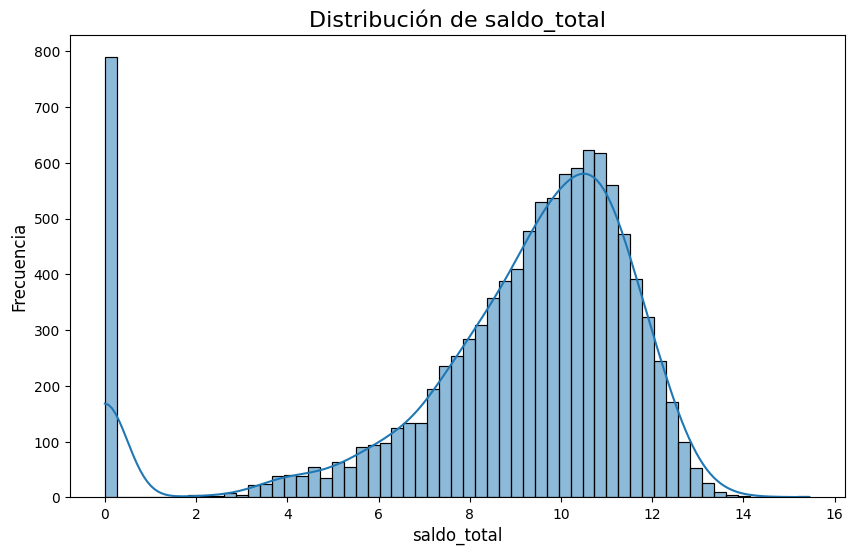

In [58]:
plt.figure(figsize=(10, 6))
# Crea el histograma con seaborn.
# 'kde=True' añade una línea de densidad de probabilidad, muy útil para entender la forma de la distribución.
sns.histplot(x=np.log1p(df['saldo_total']), kde=True)

# Añade título y etiquetas para los ejes
plt.title('Distribución de saldo_total', fontsize=16)
plt.xlabel('saldo_total', fontsize=12)
plt.ylabel('Frecuencia', fontsize=12)
# Muestra el gráfico
plt.show()

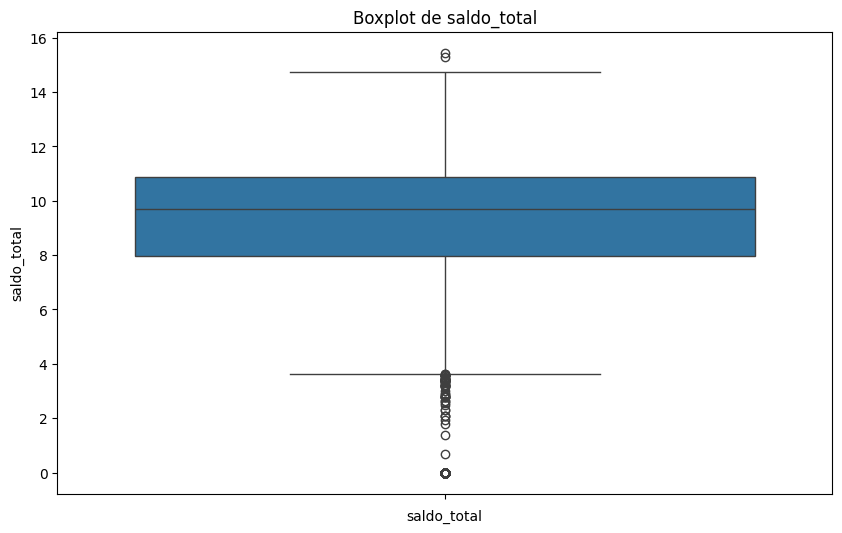

In [59]:
#Log (1+x)
plt.figure(figsize=(10, 6))
sns.boxplot(y=np.log1p(df['saldo_total']))
plt.title('Boxplot de saldo_total')
plt.xlabel('saldo_total')
plt.show()

In [60]:
y_real = np.expm1(8)
print(y_real)

y_real = np.expm1(12)
print(y_real)

2979.9579870417283
162753.79141900392


In [61]:
y_real = np.expm1(14)
print(y_real)

y_real = np.expm1(15)
print(y_real)

1202603.2841647768
3269016.3724721107


In [62]:
y_real = np.expm1(3)
print(y_real)

y_real = np.expm1(4)
print(y_real)

19.085536923187668
53.598150033144236


**Analisis de la variable saldo total**

**1. Histograma**

+ Un pico muy fuerte en 0 → significa que un grupo grande de clientes no presenta saldo o su saldo es mínimo.

+ Una gran masa de clientes con valores entre 8 y 12 en log1p → que corresponden a saldos muy altos en la escala original.

+ Aunque la mayoría está en el rango de 8–12, se observa una cola hacia la derecha (clientes con saldos todavía más altos).

**2. Boxplot**

+ Confirma que el 50% de los clientes tiene saldos elevados. Esto significa que la cartera está concentrada en clientes con montos altos

+ Algunos clientes tienen saldos mayores a 14–15 en log1p (1,202,603 - 3,269,016), equivalentes a montos extremadamente grandes en escala original.

+ Numerosos puntos se concentran por debajo de 3–4 en log1p (saldos muy bajos o cero).

**3. Implicacion en el negocio**

+ El portafolio tiene dos grandes segmentos:

  + Clientes con saldo nulo o bajo → podrían estar inactivos, recién adquiridos o en riesgo de abandono.

  + Clientes con saldo alto → núcleo principal y más rentable del negocio.

+ Una parte significativa del saldo total está en manos de pocos clientes con montos muy grandes.

+ La pérdida o fuga de esos clientes puede tener un impacto crítico en los resultados.

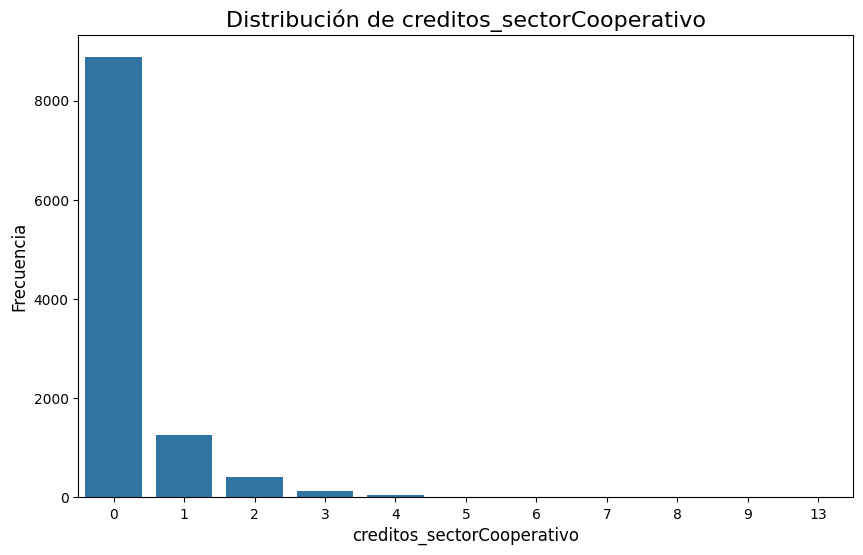

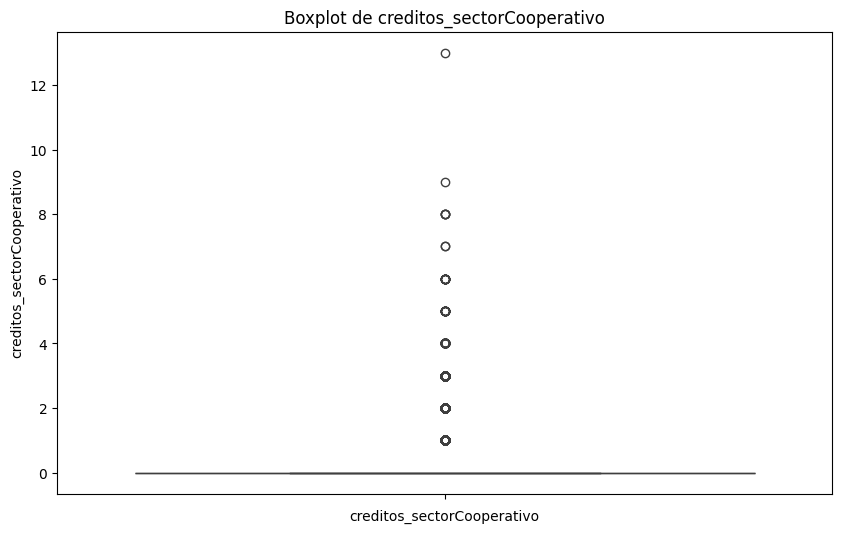

In [63]:
plt.figure(figsize=(10, 6))

# Crea el countplot con seaborn.
sns.countplot(data=df, x='creditos_sectorCooperativo')

# Añade título y etiquetas para los ejes
plt.title('Distribución de creditos_sectorCooperativo', fontsize=16)
plt.xlabel('creditos_sectorCooperativo', fontsize=12)
plt.ylabel('Frecuencia', fontsize=12)

# Muestra el gráfico
plt.show()

plt.figure(figsize=(10, 6))
sns.boxplot(data=df, y='creditos_sectorCooperativo')
plt.title('Boxplot de creditos_sectorCooperativo')
plt.xlabel('creditos_sectorCooperativo')
plt.show()

**Analisis de la variable sector cooperativo**

**1. Countplot**

+ La mayoría de los clientes tienen 0 créditos en el sector cooperativo (cerca de 9,000 observaciones).

+ Una cantidad menor tiene 1 o 2 créditos, y muy pocos tienen más de 3.

+ La distribución es fuertemente sesgada a la derecha, lo cual significa que la variable está dominada por valores bajos.

**2. Boxplot**

+ El diagrama muestra una gran concentración en la base (0), y una serie de outliers hacia arriba (clientes con entre 1 y 13 créditos).

+ Estos casos atípicos representan clientes con múltiples créditos en el sector cooperativo, muy distintos al comportamiento promedio.

**3. Implicacion en el negocio**

+

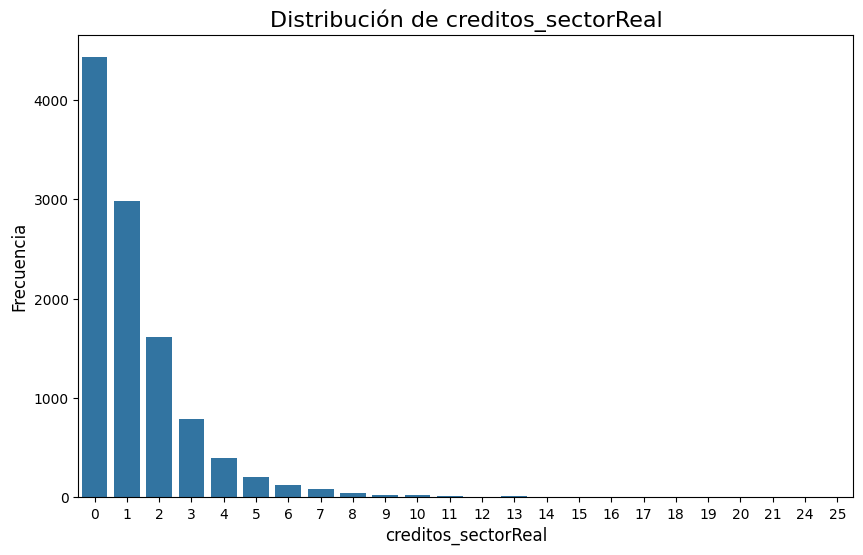

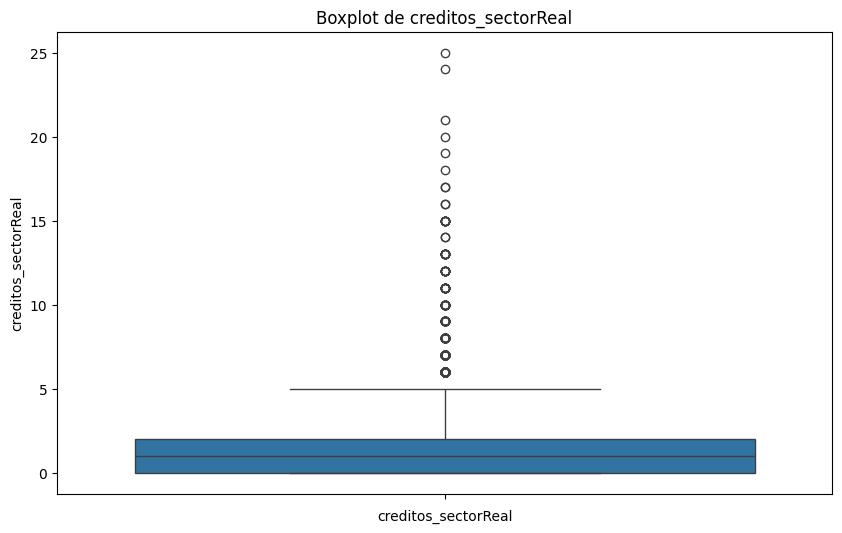

In [64]:
plt.figure(figsize=(10, 6))

# Crea el countplot con seaborn.
sns.countplot(data=df, x='creditos_sectorReal')

# Añade título y etiquetas para los ejes
plt.title('Distribución de creditos_sectorReal', fontsize=16)
plt.xlabel('creditos_sectorReal', fontsize=12)
plt.ylabel('Frecuencia', fontsize=12)

# Muestra el gráfico
plt.show()

plt.figure(figsize=(10, 6))
sns.boxplot(data=df, y='creditos_sectorReal')
plt.title('Boxplot de creditos_sectorReal')
plt.xlabel('creditos_sectorReal')
plt.show()

**Analisis de la variable creditos sector real**

**1 Countplot**

+ La mayoría de los clientes tienen entre 0 y 2 créditos en el sector real.

+ Existe una minoría con más de 10 créditos, llegando hasta casos extremos de 25 créditos.

+ La distribución es altamente sesgada hacia la derecha (asimétrica positiva).

Aunque hay clientes con múltiples créditos, el comportamiento común es tener pocos

**2. Boxplot**

+ La mediana se encuentra cerca de 1 crédito, lo que confirma lo visto en el histograma.

+ El rango intercuartílico es pequeño, la mayoría de los clientes está concentrada en valores bajos.

+ Hay muchos outliers, clientes con 6, 10, 15 y hasta 25 créditos.

Existe un grupo reducido de clientes con alto nivel de endeudamiento en el sector real.

**3. Impacto en el negocio**

+ Cliente tipicos (0-2 creditos) son un segmento clave para estrategias de captación de nuevos créditos, dado que tienen margen para endeudarse más.

+ Clientes con muchos creditos aunque son pocos, pueden concentrar un riesgo significativo si su capacidad de pago se ve comprometida.



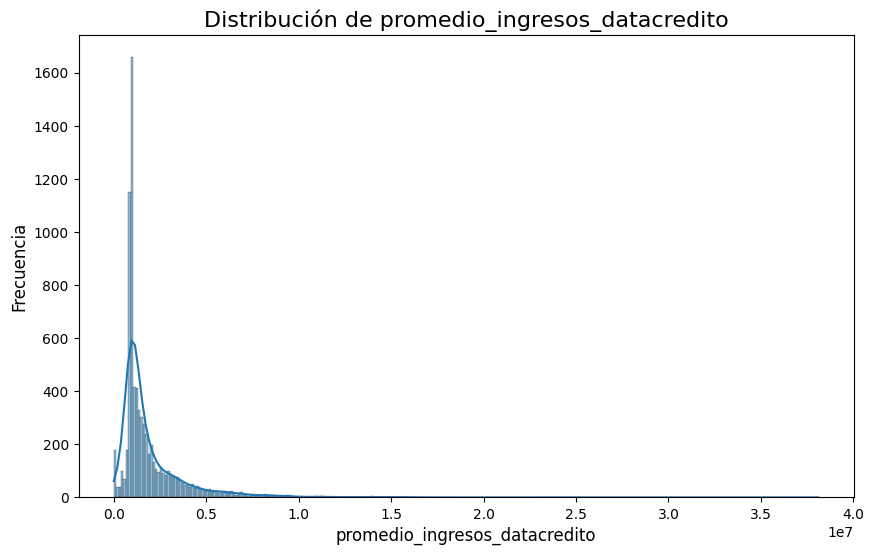

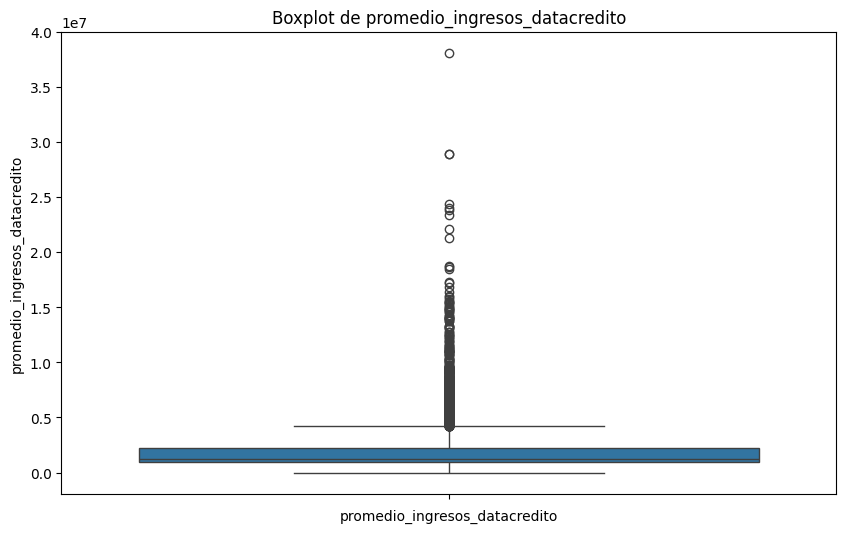

In [65]:
plt.figure(figsize=(10, 6))

# Crea el histograma con seaborn.
# 'kde=True' añade una línea de densidad de probabilidad, muy útil para entender la forma de la distribución.
sns.histplot(data=df, x='promedio_ingresos_datacredito', kde=True)

# Añade título y etiquetas para los ejes
plt.title('Distribución de promedio_ingresos_datacredito', fontsize=16)
plt.xlabel('promedio_ingresos_datacredito', fontsize=12)
plt.ylabel('Frecuencia', fontsize=12)

# Muestra el gráfico
plt.show()

plt.figure(figsize=(10, 6))
sns.boxplot(data=df, y='promedio_ingresos_datacredito')
plt.title('Boxplot de promedio_ingresos_datacredito')
plt.xlabel('promedio_ingresos_datacredito')
plt.show()

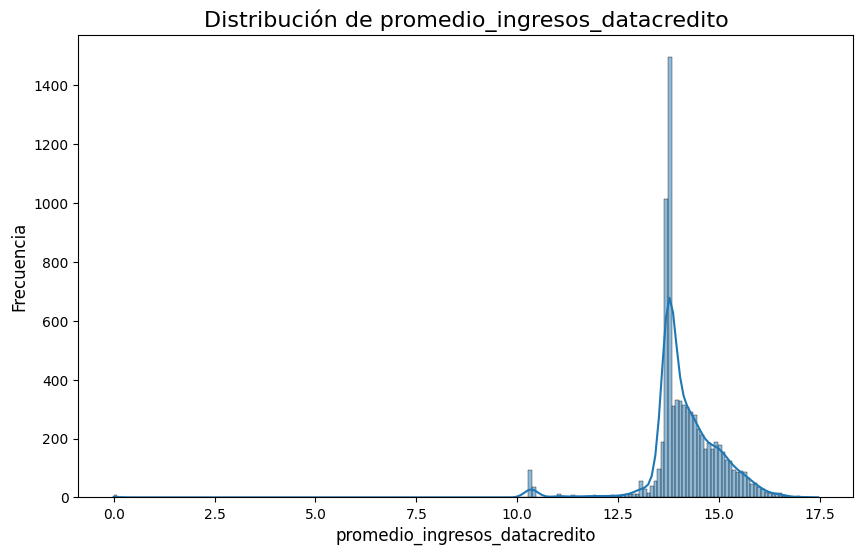

In [66]:
plt.figure(figsize=(10, 6))
# Crea el histograma con seaborn.
# 'kde=True' añade una línea de densidad de probabilidad, muy útil para entender la forma de la distribución.
sns.histplot(x=np.log1p(df['promedio_ingresos_datacredito']), kde=True)

# Añade título y etiquetas para los ejes
plt.title('Distribución de promedio_ingresos_datacredito', fontsize=16)
plt.xlabel('promedio_ingresos_datacredito', fontsize=12)
plt.ylabel('Frecuencia', fontsize=12)
# Muestra el gráfico
plt.show()

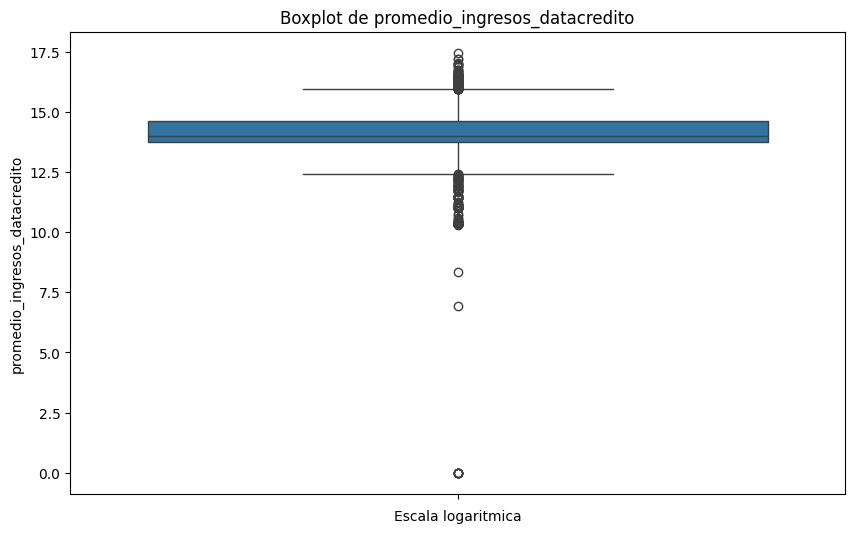

In [67]:
#Log (1+x)
plt.figure(figsize=(10, 6))
sns.boxplot(y=np.log1p(df['promedio_ingresos_datacredito']))
plt.title('Boxplot de promedio_ingresos_datacredito')
plt.xlabel('Escala logaritmica')
plt.show()

In [68]:
y_real = np.expm1(14)
print(y_real)

y_real = np.expm1(15)
print(y_real)

1202603.2841647768
3269016.3724721107


**Analisis de la variable promedio ingresos datacredito**

**1 Histograma**

+ La mayoría de los valores se concentran alrededor de 14–15 en escala log1p, lo que indica que los ingresos promedio de los clientes, transformados logarítmicamente, se sitúan en ese rango.

+ También se observan valores en 0, que probablemente representen clientes sin ingresos reportados o con inconsistencias en la información.

+ Hay algunos valores en rangos menores (10–12) y otros en rangos altos (16–17), que son menos frecuentes.

**2.Boxplot**

+ La mediana está cerca de 14.5, confirmando lo observado en el histograma.

+ El IQR es pequeño, lo que significa que la mayoría de los clientes reportan ingresos en un rango estrecho alrededor de ese valor.

+ Se observan varios outliers hacia arriba (16–17) que corresponden a ingresos bastante altos

+ También existen outliers hacia abajo, con algunos casos en valores cercanos a 0, lo cual es inusual y puede indicar:

  + Clientes sin ingresos formales declarados.

  + Problemas de calidad de datos.

  + Segmentos poblacionales con ingresos informales no capturados.

**3. Implaciones en el negocio**

+ La mayoría de los clientes se agrupa en un rango de ingresos relativamente estable (alrededor de 14–15 en log1p). Esto facilita segmentar a la clientela en grupos homogéneos de ingresos.

+ Los outliers podrían representar clientes de alto poder adquisitivo (potencial para créditos de mayor monto) o clientes vulnerables con ingresos muy bajos (riesgo de impago).

+ Los clientes con ingresos bajos o nulos (outliers inferiores) requieren especial atención, ya que pueden representar un alto riesgo de incumplimiento.

+ Para clientes en el rango mayoritario (14–15), se pueden diseñar productos masivos con condiciones estándar.

+ Para clientes en los extremos (outliers altos y bajos), convendría aplicar políticas diferenciadas:

  + Altos ingresos → productos premium, líneas de crédito amplias.

  + Bajos ingresos → microcréditos, con mayor control de riesgo.

**Variables categoricas**

In [69]:
df.tipo_credito.value_counts()

,count
tipo_credito,
4,7747
9,2876
10,116
6,21
7,2
68,1


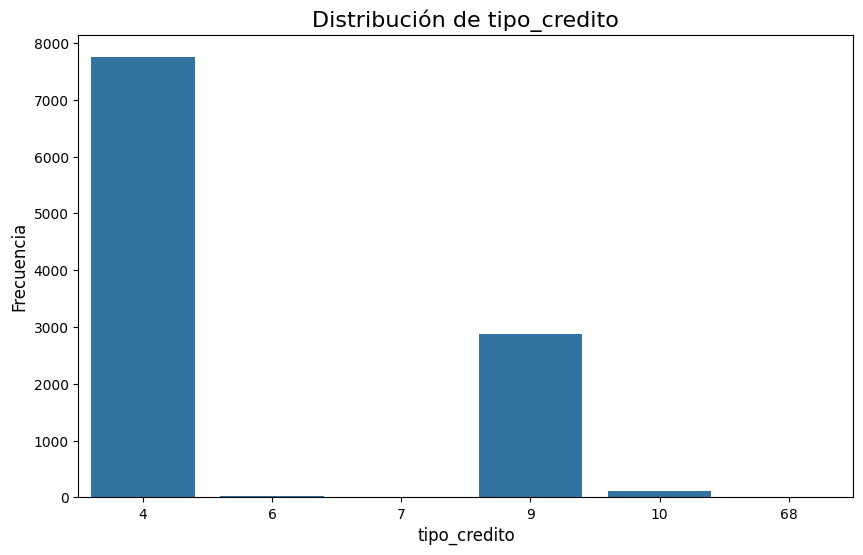

In [70]:
plt.figure(figsize=(10, 6))

# Crea el countplot con seaborn.
sns.countplot(data=df, x='tipo_credito')

# Añade título y etiquetas para los ejes
plt.title('Distribución de tipo_credito', fontsize=16)
plt.xlabel('tipo_credito', fontsize=12)
plt.ylabel('Frecuencia', fontsize=12)

# Muestra el gráfico
plt.show()

**Analisis de la variable tipo de credito**

+ La mayoría de los clientes tienen crédito tipo 4, seguido por el tipo 9, los demás tipos (6, 7, 10, 68) son muy poco representativos.

+ El producto de crédito tipo 4 domina la cartera. Esto implica que cualquier política de riesgo o estrategia comercial debe enfocarse principalmente en este segmento.

*

In [71]:
df.tipo_laboral.value_counts()

,count
tipo_laboral,
Empleado,6754
Independiente,4009


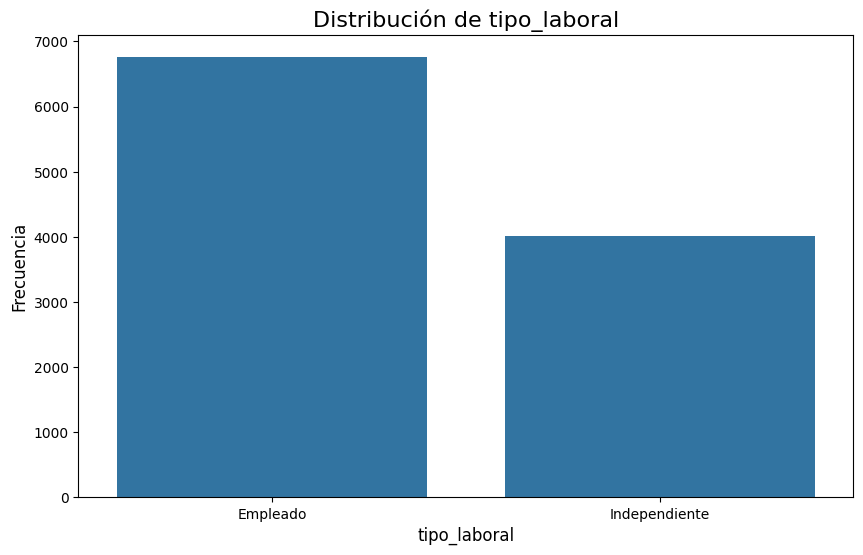

In [72]:
plt.figure(figsize=(10, 6))

# Crea el countplot con seaborn.
sns.countplot(data=df, x='tipo_laboral')

# Añade título y etiquetas para los ejes
plt.title('Distribución de tipo_laboral', fontsize=16)
plt.xlabel('tipo_laboral', fontsize=12)
plt.ylabel('Frecuencia', fontsize=12)

# Muestra el gráfico
plt.show()

**Analisis de la variable tipo laboral**

+ Hay más empleados formales que independientes, pero los independientes son una parte importante.

+ Los empleados suelen tener ingresos más estables, lo que en teoría se relaciona con un menor riesgo crediticio.

+ Los independientes son un segmento clave, aunque pueden tener ingresos altos, su variabilidad implica mayor incertidumbre. Esto exige un análisis diferenciado para definir políticas de riesgo y condiciones de crédito más estrictas (tasas, montos, garantías).



In [73]:
df.tendencia_ingresos.value_counts()

,count
tendencia_ingresos,
Creciente,5335
Decreciente,1301
Estable,1195


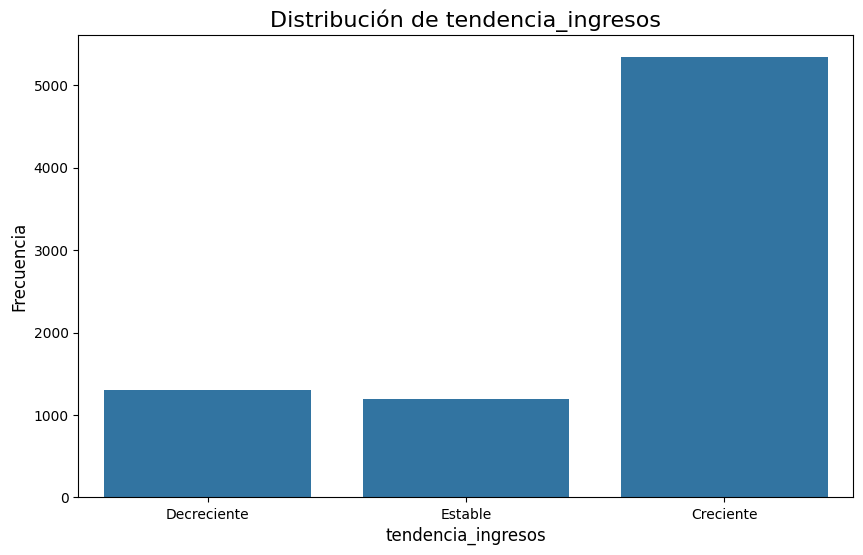

In [74]:
plt.figure(figsize=(10, 6))

# Crea el countplot con seaborn.
sns.countplot(data=df, x='tendencia_ingresos')

# Añade título y etiquetas para los ejes
plt.title('Distribución de tendencia_ingresos', fontsize=16)
plt.xlabel('tendencia_ingresos', fontsize=12)
plt.ylabel('Frecuencia', fontsize=12)

# Muestra el gráfico
plt.show()

**Analisis de la variable tendencia ingresos**

+ La mayoría presenta ingresos crecientes, lo cual es positivo desde la perspectiva de riesgo.

+ Los ingresos decrecientes y estables son menos frecuentes pero relevantes.

+ Clientes con ingresos crecientes son atractivos para la colocación de créditos, probablemente asociados a buena capacidad de pago futuro.

+ Los de ingresos decrecientes deben ser analizados con cuidado, ya que reflejan un potencial riesgo de incumplimiento.

+ En la política de negocio, podría ajustarse la oferta según tendencia: más crédito o mejores condiciones a quienes tienen ingresos crecientes, mientras que a los decrecientes se les podría ofrecer montos menores o exigir garantías.

In [75]:
df.Pago_atiempo.value_counts()

,count
Pago_atiempo,
1,10252
0,511


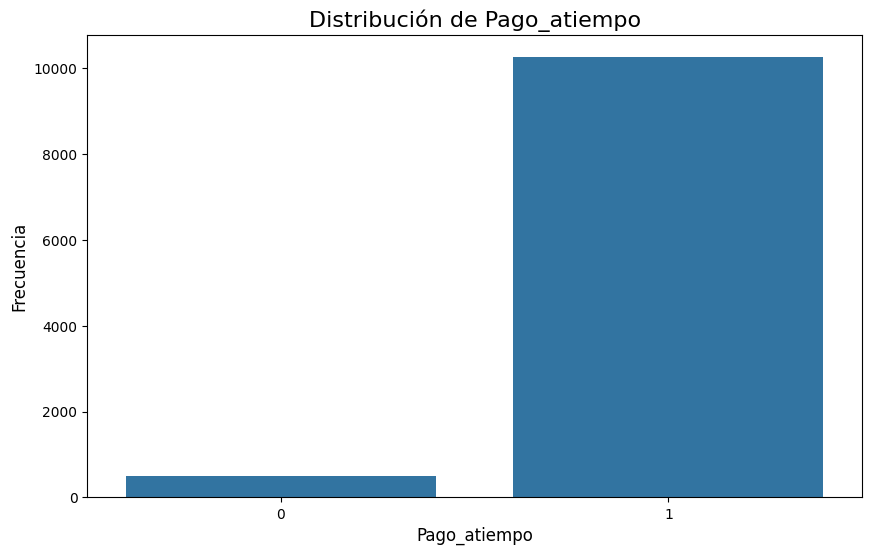

In [76]:
plt.figure(figsize=(10, 6))

# Crea el countplot con seaborn.
sns.countplot(data=df, x='Pago_atiempo')

# Añade título y etiquetas para los ejes
plt.title('Distribución de Pago_atiempo', fontsize=16)
plt.xlabel('Pago_atiempo', fontsize=12)
plt.ylabel('Frecuencia', fontsize=12)

# Muestra el gráfico
plt.show()

**Analisis a la variable objetivo Pago a tiempo**

+ La gran mayoría de clientes sí paga a tiempo, mientras que el grupo que no paga a tiempo es minoritario.

+ Existe un desbalance de clases. Será necesario aplicar técnicas como SMOTE, undersampling o métricas ajustadas (AUC, recall, F1) para no perder la capacidad de detección de los morosos.

+ Desde negocio, la tasa de morosidad parece relativamente baja, lo cual es positivo, pero el costo de los incumplimientos puede ser alto. Por lo tanto, aunque son pocos, son estratégicamente muy relevantes.


**Analisis bivariable**

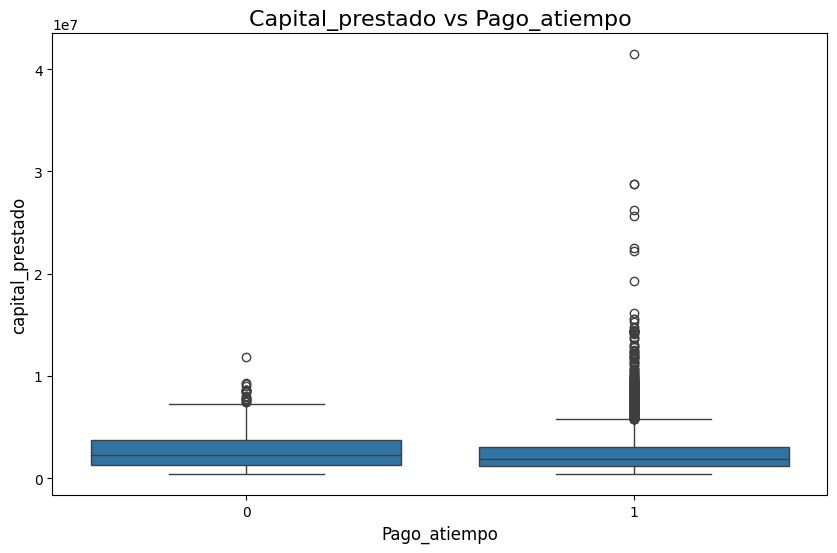

In [77]:
plt.figure(figsize=(10, 6))

# Crea el countplot con seaborn.
sns.boxplot(data=df, y='capital_prestado', x='Pago_atiempo')

# Añade título y etiquetas para los ejes
plt.title('Capital_prestado vs Pago_atiempo', fontsize=16)
plt.xlabel('Pago_atiempo', fontsize=12)
plt.ylabel('capital_prestado', fontsize=12)

# Muestra el gráfico
plt.show()

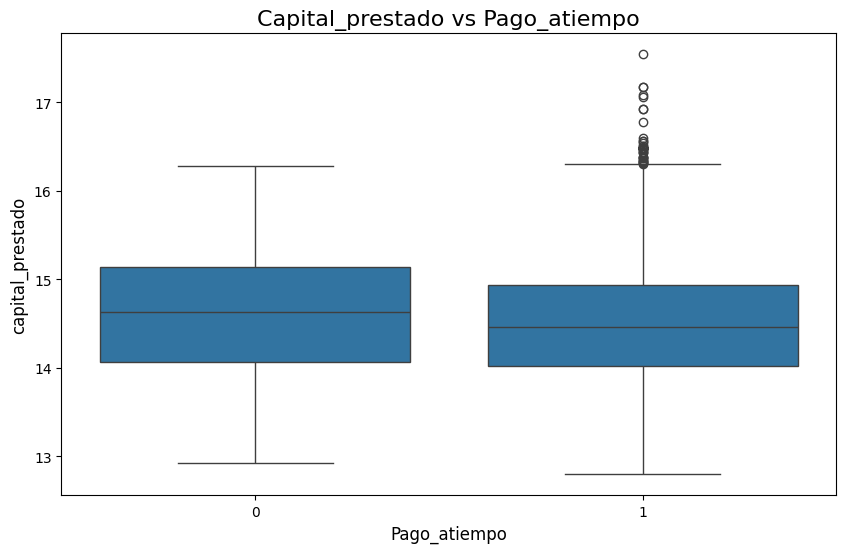

In [78]:
plt.figure(figsize=(10, 6))

# Crea el boxplot con seaborn.
sns.boxplot(data=df, y=np.log1p(df['capital_prestado']), x='Pago_atiempo')

# Añade título y etiquetas para los ejes
plt.title('Capital_prestado vs Pago_atiempo', fontsize=16)
plt.xlabel('Pago_atiempo', fontsize=12)
plt.ylabel('capital_prestado', fontsize=12)

# Muestra el gráfico
plt.show()

**Analisis bivariable de capital_prestado vs pago_atiempo**

+ Las cajas se ven similares entre ambos grupos

+ La mediana de capital_prestado está en un rango parecido para quienes pagaron a tiempo (1) y quienes no (0). El monto prestado no es muy diferente entre los dos grupos

+ En ambos grupos, la caja es relativamente estrecha comparada con el rango total, la mayoria de los prestamos estan concentrados en un rango bajo/medio

+ Los outliers son muy altos en la escala normal pero cuando se cambia a escala log1p se puede ver que los outliers vienen principalmente de los que si pagan a tiempo

+ Aunque el comportamiento es similar el grupo que pago a tiempo muestra una capicdad de endeudamiento mayor (se les prestan sumas mas grandes y aun asi cumplen)

+ En cambio, quienes no cumplen tienden a tener préstamos más acotados.



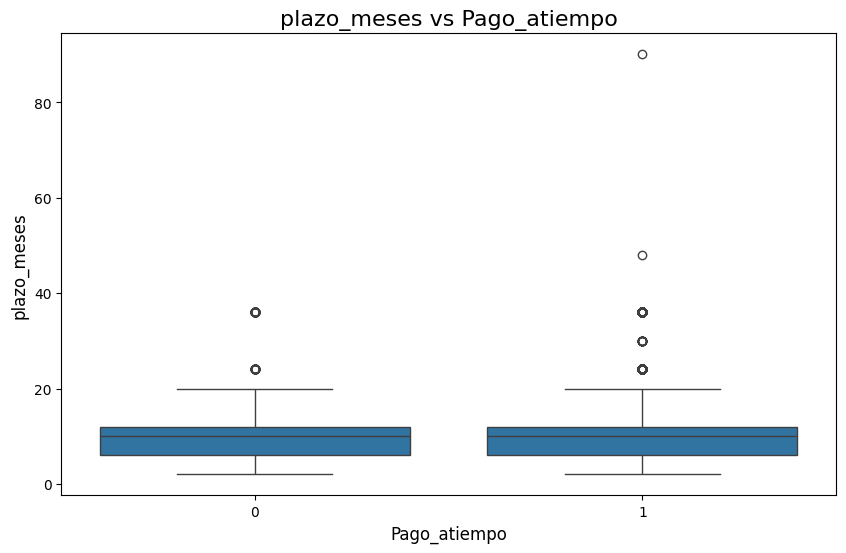

In [79]:
plt.figure(figsize=(10, 6))

# Crea el countplot con seaborn.
sns.boxplot(data=df, y='plazo_meses', x='Pago_atiempo')

# Añade título y etiquetas para los ejes
plt.title('plazo_meses vs Pago_atiempo', fontsize=16)
plt.xlabel('Pago_atiempo', fontsize=12)
plt.ylabel('plazo_meses', fontsize=12)

# Muestra el gráfico
plt.show()

** Analisis bivariable de plazo_meses vs pago_atiempo**

+ Tanto en los que pagaron a tiempo como en los que no, la mediana del plazo está alrededor de 10–12 meses.

+ Los rangos intercuartílicos son muy similares, lo que indica que la mayoría de los plazos de los créditos son parecidos en ambos grupos.

+ La dispersión de los plazos no varía de manera notable entre los que pagan y los que no.

+ No hay una diferencia sustancial en la mediana de los plazos entre quienes pagan a tiempo y quienes no.

+ Esto sugiere que el plazo del crédito no parece ser un factor determinante para predecir si alguien pagará a tiempo o no.

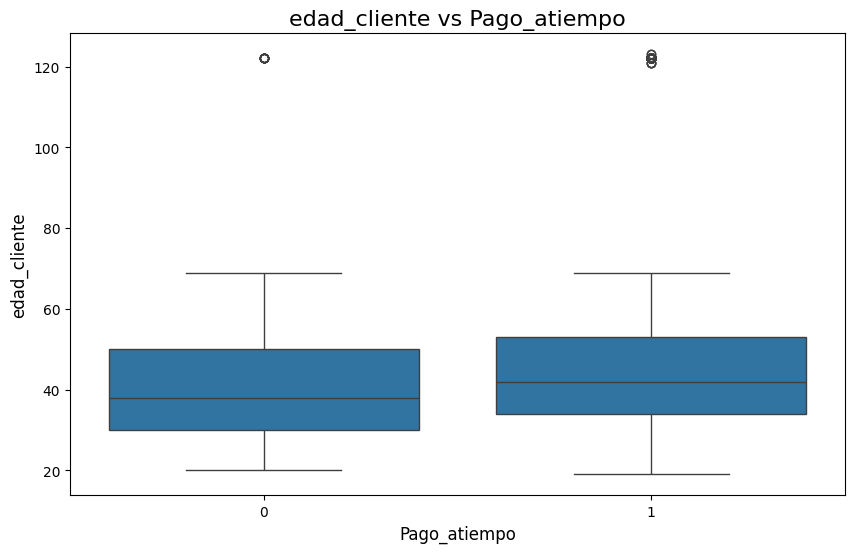

In [80]:
plt.figure(figsize=(10, 6))

# Crea el countplot con seaborn.
sns.boxplot(data=df, y='edad_cliente', x='Pago_atiempo')

# Añade título y etiquetas para los ejes
plt.title('edad_cliente vs Pago_atiempo', fontsize=16)
plt.xlabel('Pago_atiempo', fontsize=12)
plt.ylabel('edad_cliente', fontsize=12)

# Muestra el gráfico
plt.show()

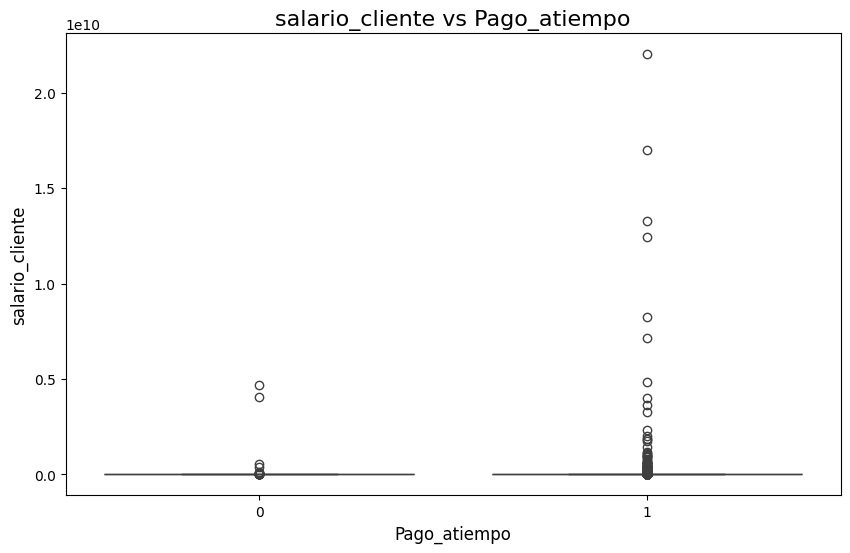

In [81]:
plt.figure(figsize=(10, 6))

# Crea el countplot con seaborn.
sns.boxplot(data=df, y='salario_cliente', x='Pago_atiempo')

# Añade título y etiquetas para los ejes
plt.title('salario_cliente vs Pago_atiempo', fontsize=16)
plt.xlabel('Pago_atiempo', fontsize=12)
plt.ylabel('salario_cliente', fontsize=12)

# Muestra el gráfico
plt.show()

**Analisis bivariable de edad_cliente vs pago_atiempo**

+ Para los clientes que no pagan a tiempo (Pago_atiempo = 0), la mediana de la edad está cerca de 40 años.

+ Para los que sí pagan a tiempo (Pago_atiempo = 1), la mediana está más alta, alrededor de 41 años.

+ Ambos grupos presentan valores atípicos muy altos (edades cercanas o mayores a 120). Esos casos probablemente son errores de digitación o datos atípicos extremos.

+ El rango superior en cumplidos llega más alto (≈70 años), mientras que en morosos es más bajo (~68).

+ En morosos (0): la mayoría está entre ~30 y 50 años.

+ En cumplidos (1): el rango está más desplazado hacia arriba (~33 a 52 años).

+ Esto refuerza que los clientes que cumplen tienden a ser ligeramente mayores.

+ los clientes de mayor edad tienden a pagar más a tiempo, mientras que los más jóvenes presentan un mayor riesgo de mora.


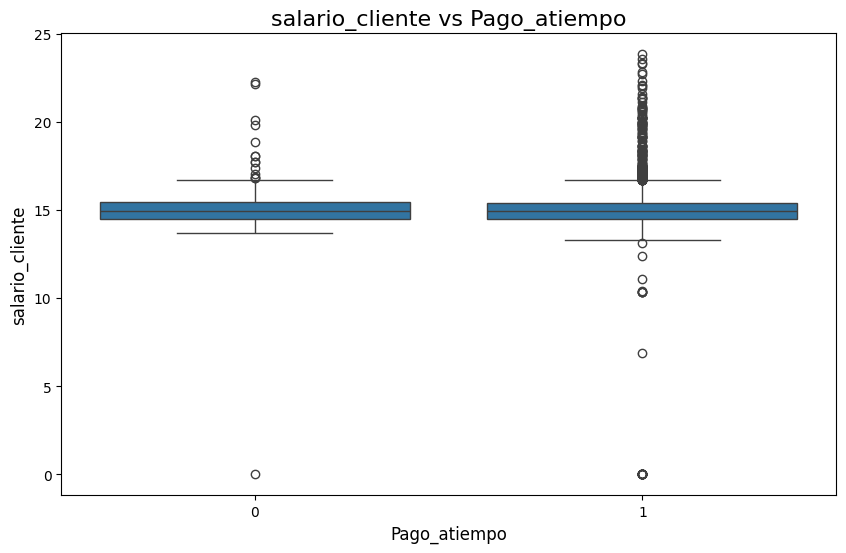

In [82]:
plt.figure(figsize=(10, 6))

# Crea el countplot con seaborn.
sns.boxplot(data=df, y=np.log1p(df['salario_cliente']), x='Pago_atiempo')

# Añade título y etiquetas para los ejes
plt.title('salario_cliente vs Pago_atiempo', fontsize=16)
plt.xlabel('Pago_atiempo', fontsize=12)
plt.ylabel('salario_cliente', fontsize=12)

# Muestra el gráfico
plt.show()

**Analisis bivariable salario_cliente vs pago_atiempo**

+ Tanto en clientes que no pagan a tiempo (0) como en los que sí pagan a tiempo (1), la mediana del salario está en torno a 15 en escala logarítmica, lo que corresponde aproximadamente a salarios entre 3 y 3,3 millones (dependiendo de la base).

+ Ambos grupos tienen un IQR muy parecido (~14,5 a ~15,5 log), es decir, se concentran en un rango de ingresos bastante similar.

+ Esto sugiere que el salario no discrimina fuertemente entre cumplidos y morosos.

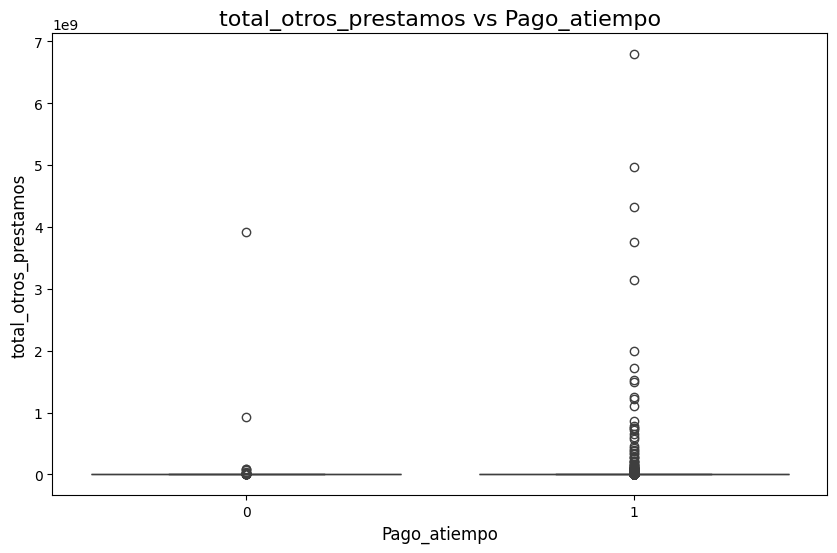

In [83]:
plt.figure(figsize=(10, 6))

# Crea el countplot con seaborn.
sns.boxplot(data=df, y='total_otros_prestamos', x='Pago_atiempo')

# Añade título y etiquetas para los ejes
plt.title('total_otros_prestamos vs Pago_atiempo', fontsize=16)
plt.xlabel('Pago_atiempo', fontsize=12)
plt.ylabel('total_otros_prestamos', fontsize=12)

# Muestra el gráfico
plt.show()

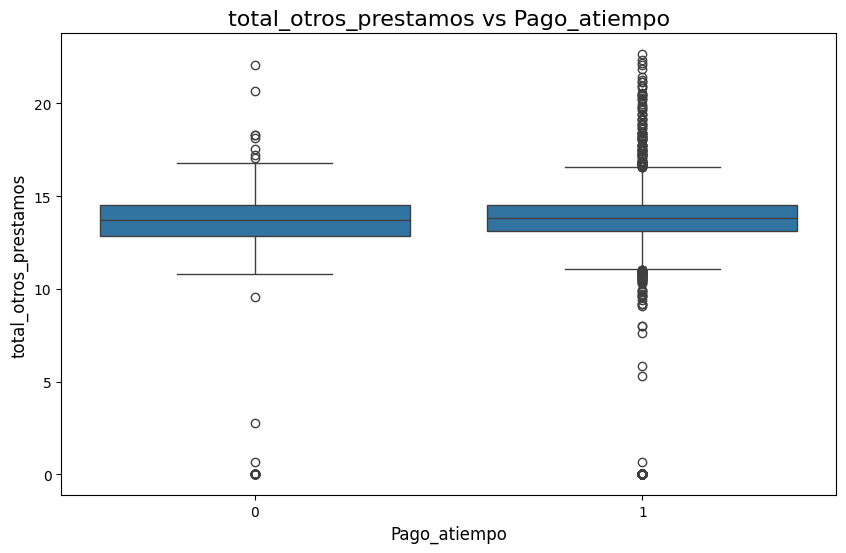

In [84]:
plt.figure(figsize=(10, 6))

# Crea el countplot con seaborn.
sns.boxplot(data=df, y=np.log1p(df['total_otros_prestamos']), x='Pago_atiempo')

# Añade título y etiquetas para los ejes
plt.title('total_otros_prestamos vs Pago_atiempo', fontsize=16)
plt.xlabel('Pago_atiempo', fontsize=12)
plt.ylabel('total_otros_prestamos', fontsize=12)

# Muestra el gráfico
plt.show()

**Analisis bivariables total otros prestamos vs pago a tiempo**



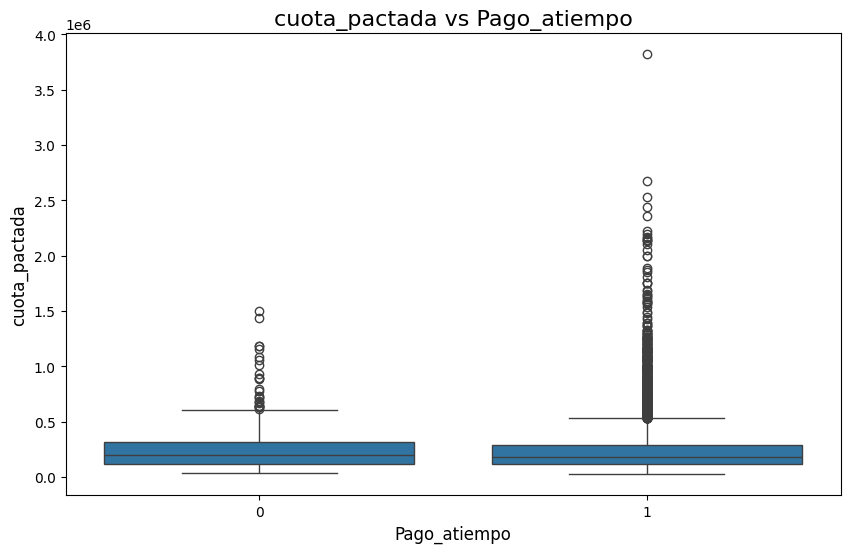

In [85]:
plt.figure(figsize=(10, 6))

# Crea el countplot con seaborn.
sns.boxplot(data=df, y='cuota_pactada', x='Pago_atiempo')

# Añade título y etiquetas para los ejes
plt.title('cuota_pactada vs Pago_atiempo', fontsize=16)
plt.xlabel('Pago_atiempo', fontsize=12)
plt.ylabel('cuota_pactada', fontsize=12)

# Muestra el gráfico
plt.show()

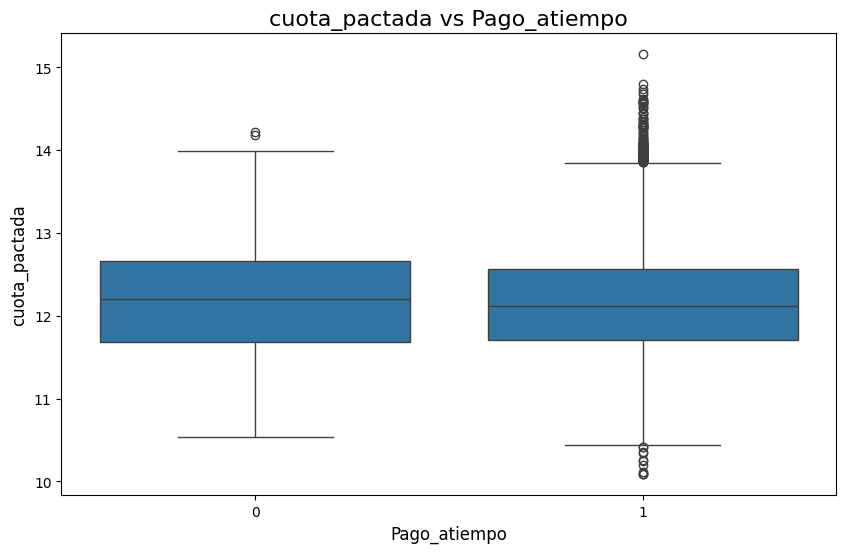

In [86]:
plt.figure(figsize=(10, 6))

# Crea el countplot con seaborn.
sns.boxplot(data=df, y=np.log1p(df['cuota_pactada']), x='Pago_atiempo')

# Añade título y etiquetas para los ejes
plt.title('cuota_pactada vs Pago_atiempo', fontsize=16)
plt.xlabel('Pago_atiempo', fontsize=12)
plt.ylabel('cuota_pactada', fontsize=12)

# Muestra el gráfico
plt.show()

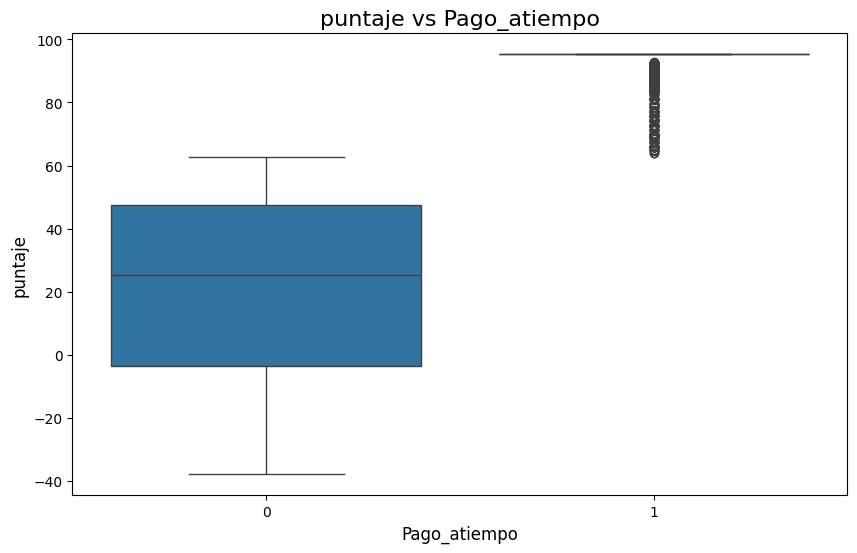

In [87]:
plt.figure(figsize=(10, 6))

# Crea el countplot con seaborn.
sns.boxplot(data=df, y='puntaje', x='Pago_atiempo')

# Añade título y etiquetas para los ejes
plt.title('puntaje vs Pago_atiempo', fontsize=16)
plt.xlabel('Pago_atiempo', fontsize=12)
plt.ylabel('puntaje', fontsize=12)

# Muestra el gráfico
plt.show()

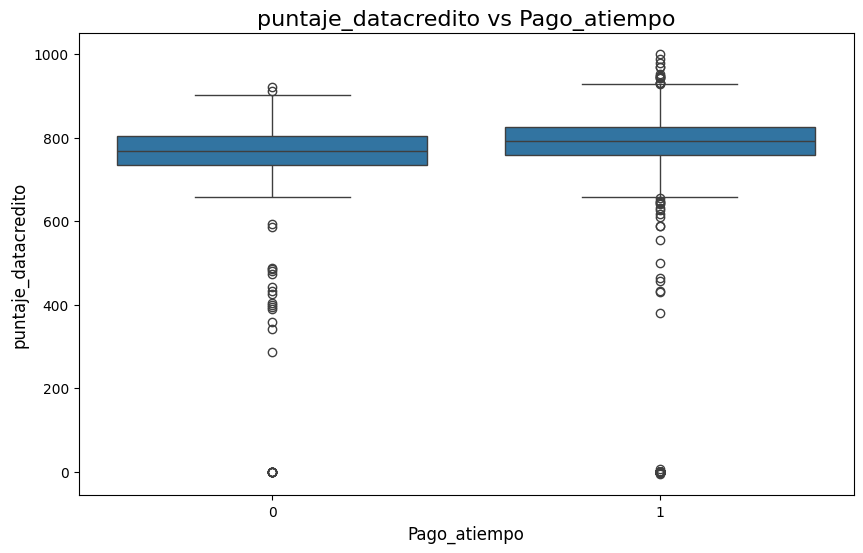

In [88]:
plt.figure(figsize=(10, 6))

# Crea el countplot con seaborn.
sns.boxplot(data=df, y='puntaje_datacredito', x='Pago_atiempo')

# Añade título y etiquetas para los ejes
plt.title('puntaje_datacredito vs Pago_atiempo', fontsize=16)
plt.xlabel('Pago_atiempo', fontsize=12)
plt.ylabel('puntaje_datacredito', fontsize=12)

# Muestra el gráfico
plt.show()

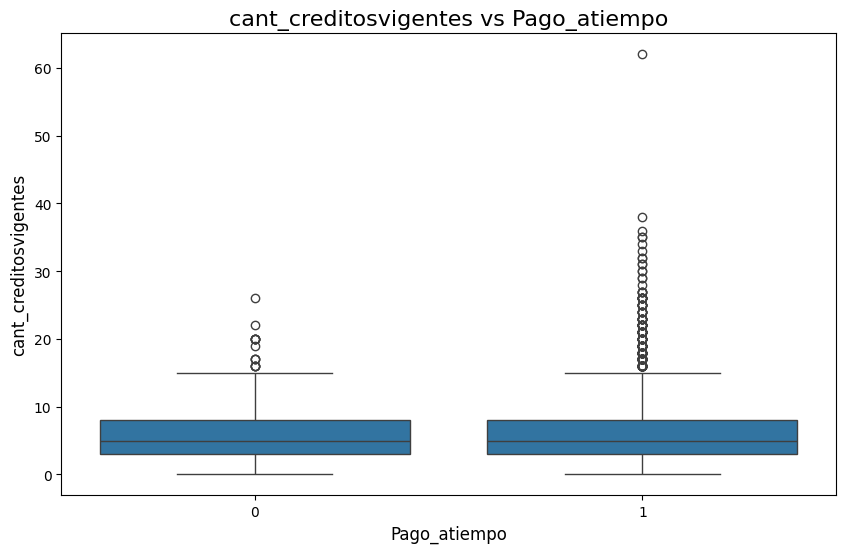

In [89]:
plt.figure(figsize=(10, 6))

# Crea el countplot con seaborn.
sns.boxplot(data=df, y='cant_creditosvigentes', x='Pago_atiempo')

# Añade título y etiquetas para los ejes
plt.title('cant_creditosvigentes vs Pago_atiempo', fontsize=16)
plt.xlabel('Pago_atiempo', fontsize=12)
plt.ylabel('cant_creditosvigentes', fontsize=12)

# Muestra el gráfico
plt.show()

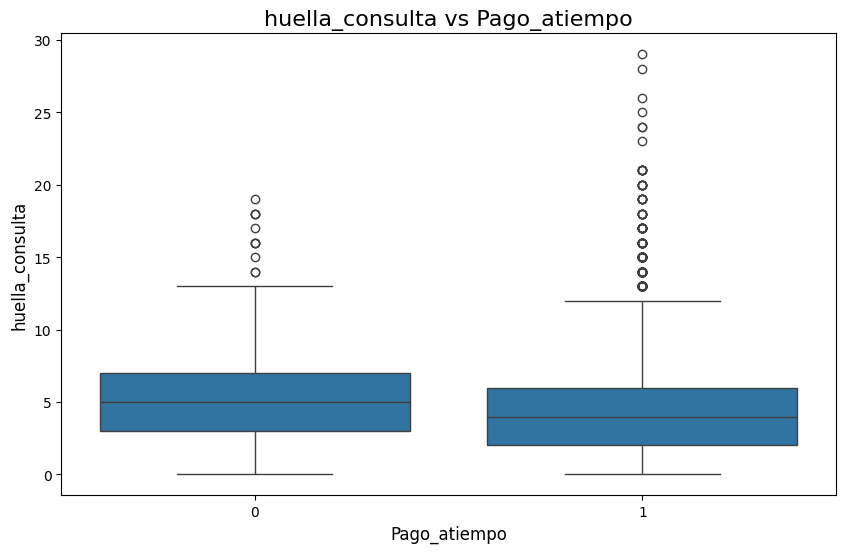

In [90]:
plt.figure(figsize=(10, 6))

# Crea el countplot con seaborn.
sns.boxplot(data=df, y='huella_consulta', x='Pago_atiempo')

# Añade título y etiquetas para los ejes
plt.title('huella_consulta vs Pago_atiempo', fontsize=16)
plt.xlabel('Pago_atiempo', fontsize=12)
plt.ylabel('huella_consulta', fontsize=12)

# Muestra el gráfico
plt.show()

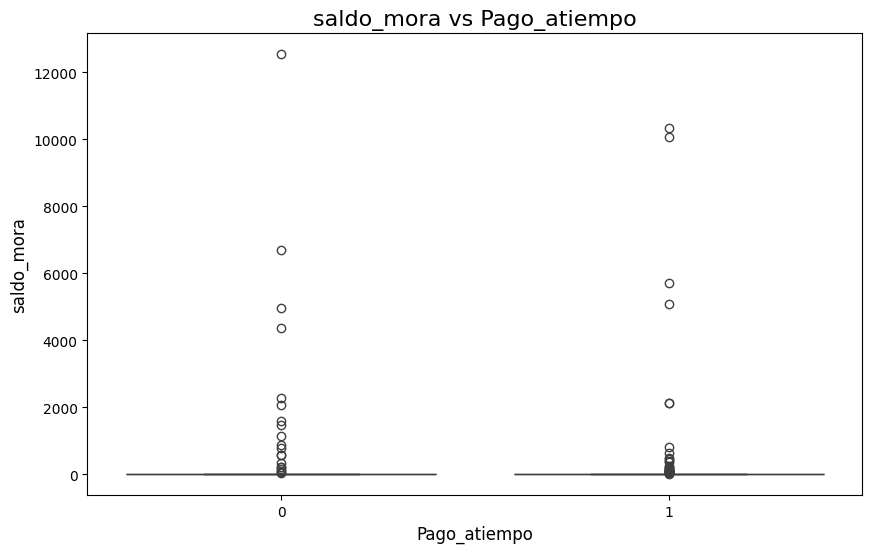

In [91]:
plt.figure(figsize=(10, 6))

# Crea el countplot con seaborn.
sns.boxplot(data=df, y='saldo_mora', x='Pago_atiempo')

# Añade título y etiquetas para los ejes
plt.title('saldo_mora vs Pago_atiempo', fontsize=16)
plt.xlabel('Pago_atiempo', fontsize=12)
plt.ylabel('saldo_mora', fontsize=12)

# Muestra el gráfico
plt.show()

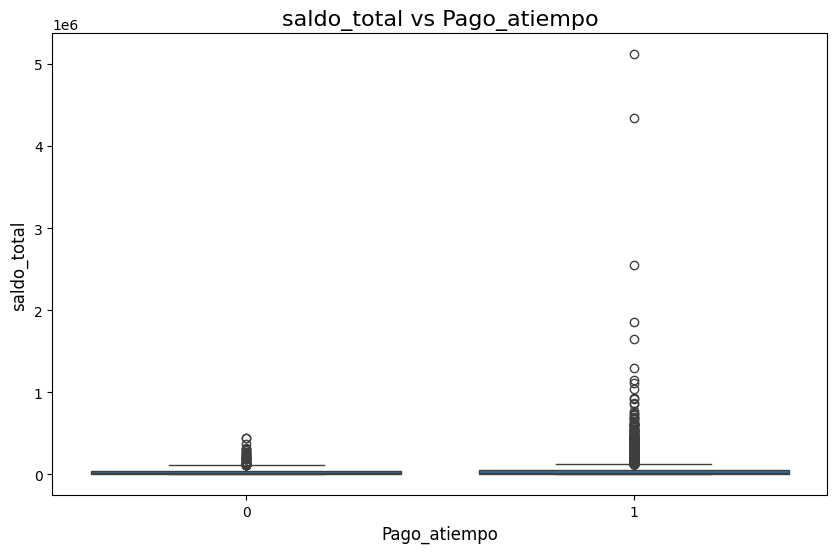

In [92]:
plt.figure(figsize=(10, 6))

# Crea el countplot con seaborn.
sns.boxplot(data=df, y='saldo_total', x='Pago_atiempo')

# Añade título y etiquetas para los ejes
plt.title('saldo_total vs Pago_atiempo', fontsize=16)
plt.xlabel('Pago_atiempo', fontsize=12)
plt.ylabel('saldo_total', fontsize=12)

# Muestra el gráfico
plt.show()

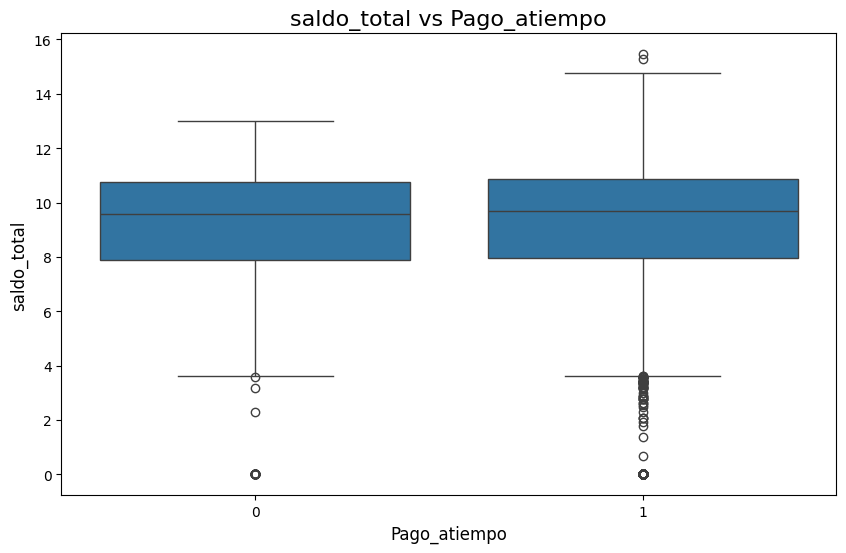

In [93]:
plt.figure(figsize=(10, 6))

# Crea el countplot con seaborn.
sns.boxplot(data=df, y=np.log1p(df['saldo_total']), x='Pago_atiempo')

# Añade título y etiquetas para los ejes
plt.title('saldo_total vs Pago_atiempo', fontsize=16)
plt.xlabel('Pago_atiempo', fontsize=12)
plt.ylabel('saldo_total', fontsize=12)

# Muestra el gráfico
plt.show()

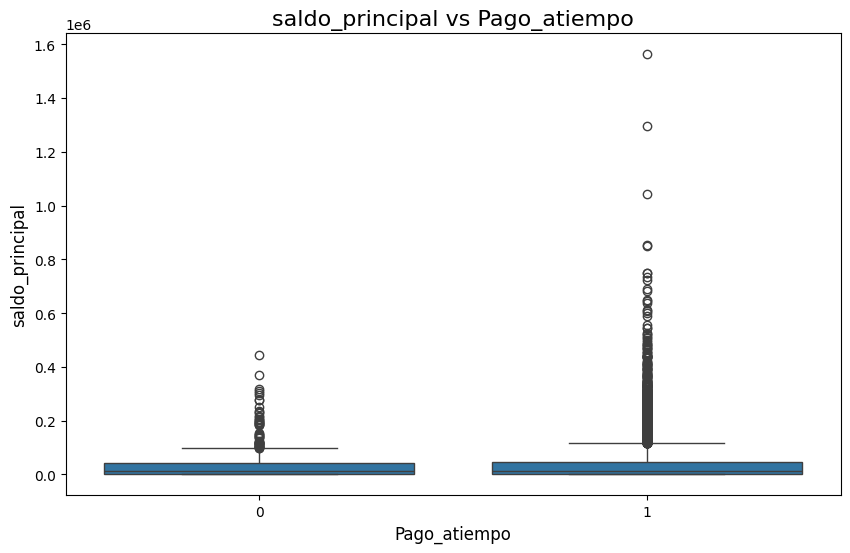

In [94]:
plt.figure(figsize=(10, 6))

# Crea el countplot con seaborn.
sns.boxplot(data=df, y='saldo_principal', x='Pago_atiempo')

# Añade título y etiquetas para los ejes
plt.title('saldo_principal vs Pago_atiempo', fontsize=16)
plt.xlabel('Pago_atiempo', fontsize=12)
plt.ylabel('saldo_principal', fontsize=12)

# Muestra el gráfico
plt.show()

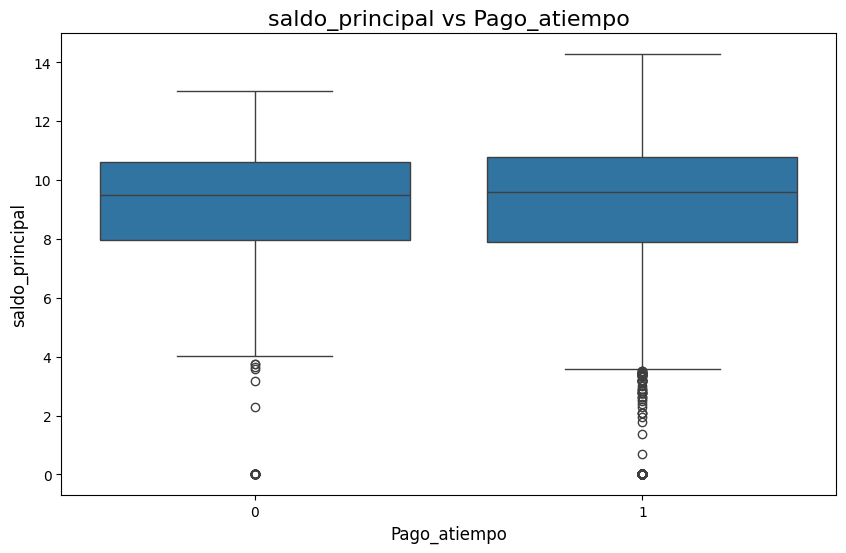

In [95]:
plt.figure(figsize=(10, 6))

# Crea el countplot con seaborn.
sns.boxplot(data=df, y=np.log1p(df['saldo_principal']), x='Pago_atiempo')

# Añade título y etiquetas para los ejes
plt.title('saldo_principal vs Pago_atiempo', fontsize=16)
plt.xlabel('Pago_atiempo', fontsize=12)
plt.ylabel('saldo_principal', fontsize=12)

# Muestra el gráfico
plt.show()

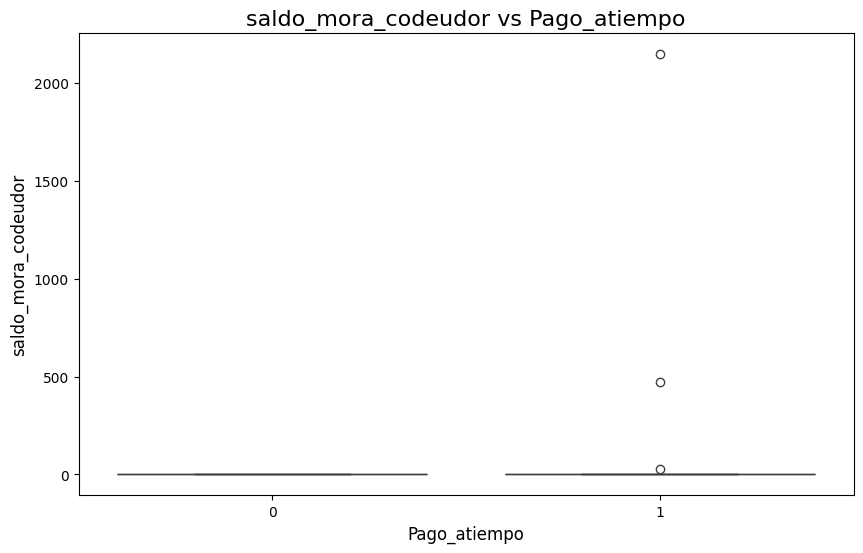

In [96]:
plt.figure(figsize=(10, 6))

# Crea el countplot con seaborn.
sns.boxplot(data=df, y='saldo_mora_codeudor', x='Pago_atiempo')

# Añade título y etiquetas para los ejes
plt.title('saldo_mora_codeudor vs Pago_atiempo', fontsize=16)
plt.xlabel('Pago_atiempo', fontsize=12)
plt.ylabel('saldo_mora_codeudor', fontsize=12)

# Muestra el gráfico
plt.show()

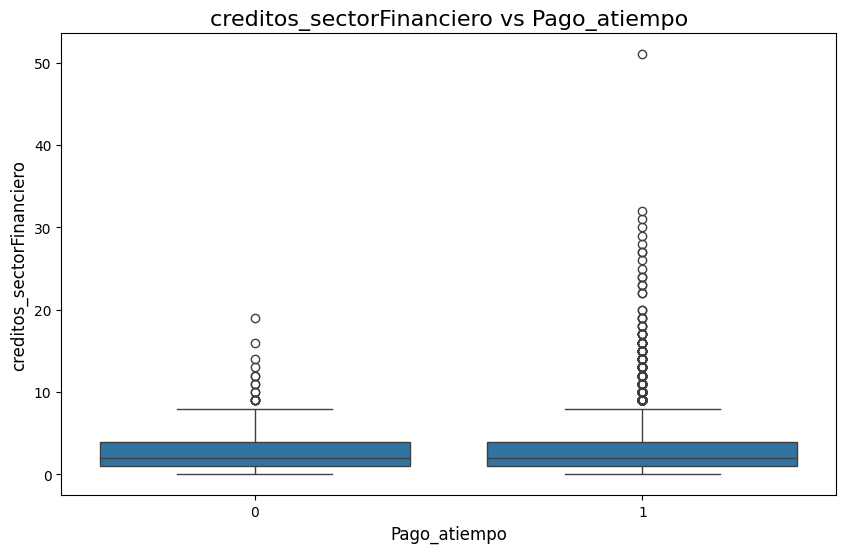

In [97]:
plt.figure(figsize=(10, 6))

# Crea el countplot con seaborn.
sns.boxplot(data=df, y='creditos_sectorFinanciero', x='Pago_atiempo')

# Añade título y etiquetas para los ejes
plt.title('creditos_sectorFinanciero vs Pago_atiempo', fontsize=16)
plt.xlabel('Pago_atiempo', fontsize=12)
plt.ylabel('creditos_sectorFinanciero', fontsize=12)

# Muestra el gráfico
plt.show()

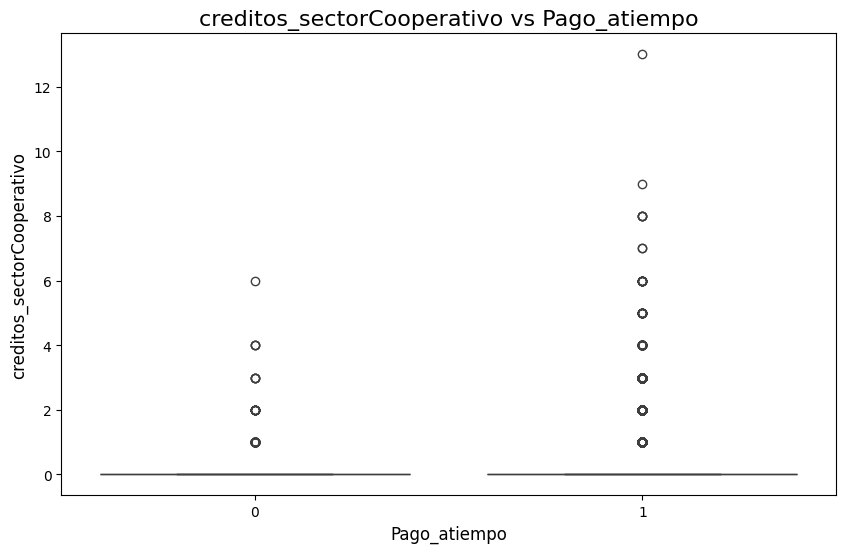

In [98]:
plt.figure(figsize=(10, 6))

# Crea el countplot con seaborn.
sns.boxplot(data=df, y='creditos_sectorCooperativo', x='Pago_atiempo')

# Añade título y etiquetas para los ejes
plt.title('creditos_sectorCooperativo vs Pago_atiempo', fontsize=16)
plt.xlabel('Pago_atiempo', fontsize=12)
plt.ylabel('creditos_sectorCooperativo', fontsize=12)

# Muestra el gráfico
plt.show()

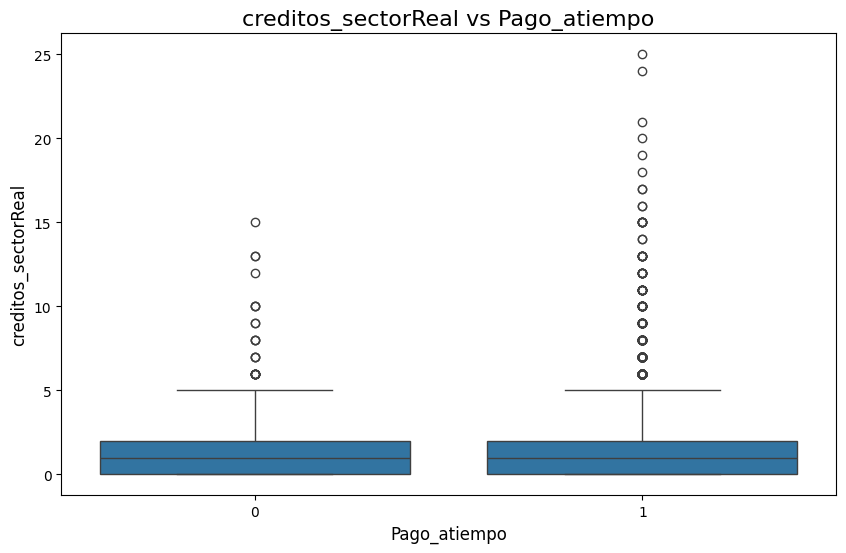

In [99]:
plt.figure(figsize=(10, 6))

# Crea el countplot con seaborn.
sns.boxplot(data=df, y='creditos_sectorReal', x='Pago_atiempo')

# Añade título y etiquetas para los ejes
plt.title('creditos_sectorReal vs Pago_atiempo', fontsize=16)
plt.xlabel('Pago_atiempo', fontsize=12)
plt.ylabel('creditos_sectorReal', fontsize=12)

# Muestra el gráfico
plt.show()

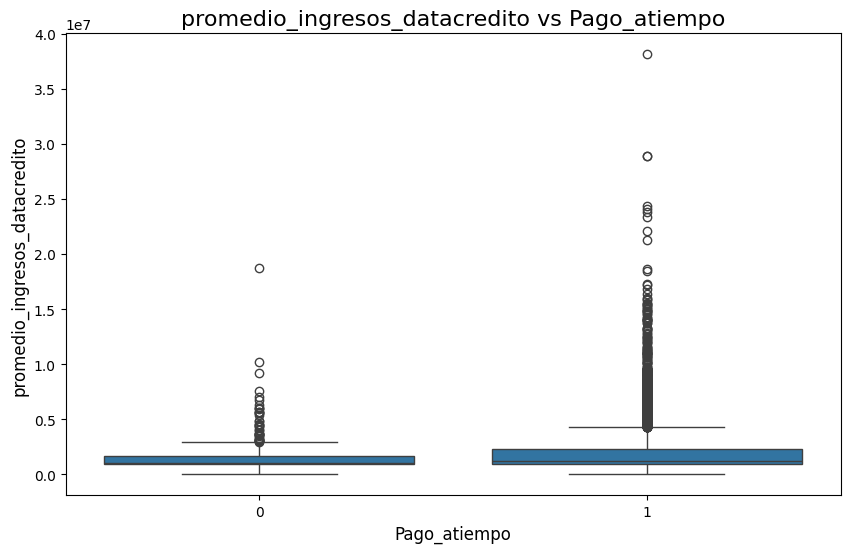

In [100]:
plt.figure(figsize=(10, 6))

# Crea el countplot con seaborn.
sns.boxplot(data=df, y='promedio_ingresos_datacredito', x='Pago_atiempo')

# Añade título y etiquetas para los ejes
plt.title('promedio_ingresos_datacredito vs Pago_atiempo', fontsize=16)
plt.xlabel('Pago_atiempo', fontsize=12)
plt.ylabel('promedio_ingresos_datacredito', fontsize=12)

# Muestra el gráfico
plt.show()

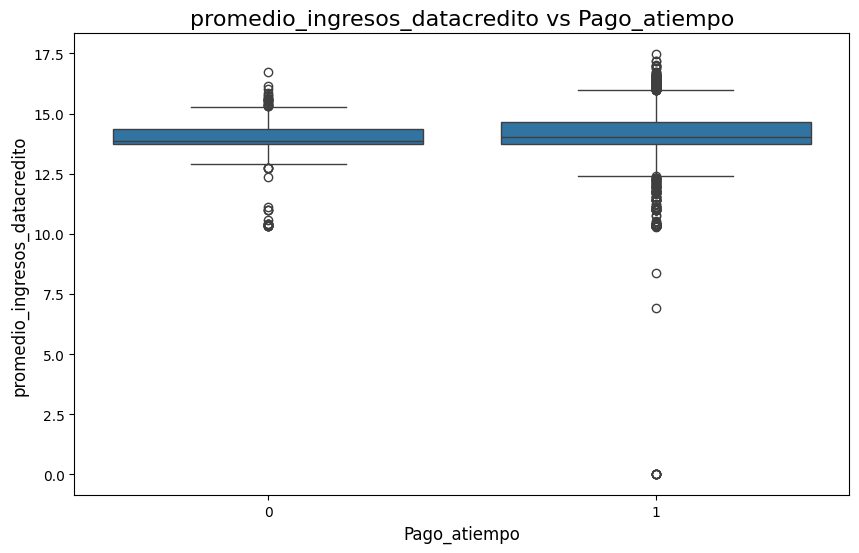

In [101]:
plt.figure(figsize=(10, 6))

# Crea el countplot con seaborn.
sns.boxplot(data=df, y=np.log1p(df['promedio_ingresos_datacredito']), x='Pago_atiempo')

# Añade título y etiquetas para los ejes
plt.title('promedio_ingresos_datacredito vs Pago_atiempo', fontsize=16)
plt.xlabel('Pago_atiempo', fontsize=12)
plt.ylabel('promedio_ingresos_datacredito', fontsize=12)

# Muestra el gráfico
plt.show()

**Variables Categoricas**

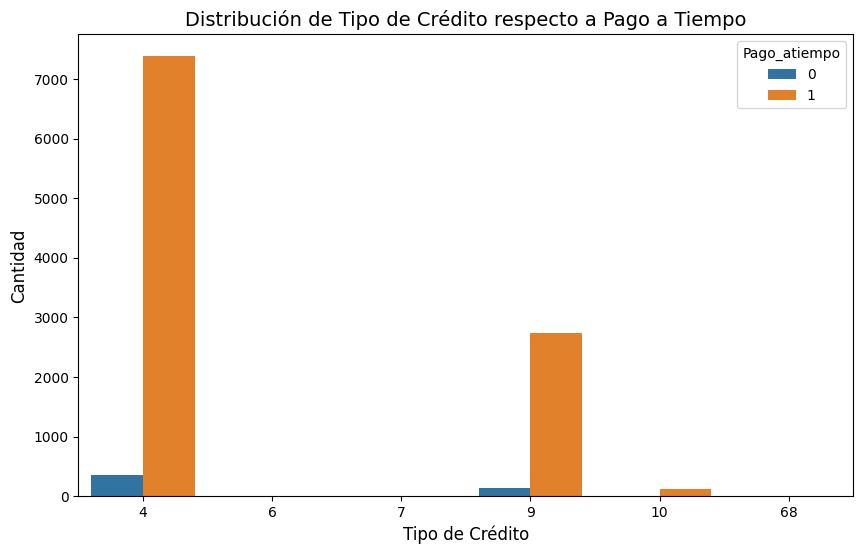

In [102]:
plt.figure(figsize=(10,6))
sns.countplot(data=df, x="tipo_credito", hue="Pago_atiempo")

plt.title("Distribución de Tipo de Crédito respecto a Pago a Tiempo", fontsize=14)
plt.xlabel("Tipo de Crédito", fontsize=12)
plt.ylabel("Cantidad", fontsize=12)

plt.show()

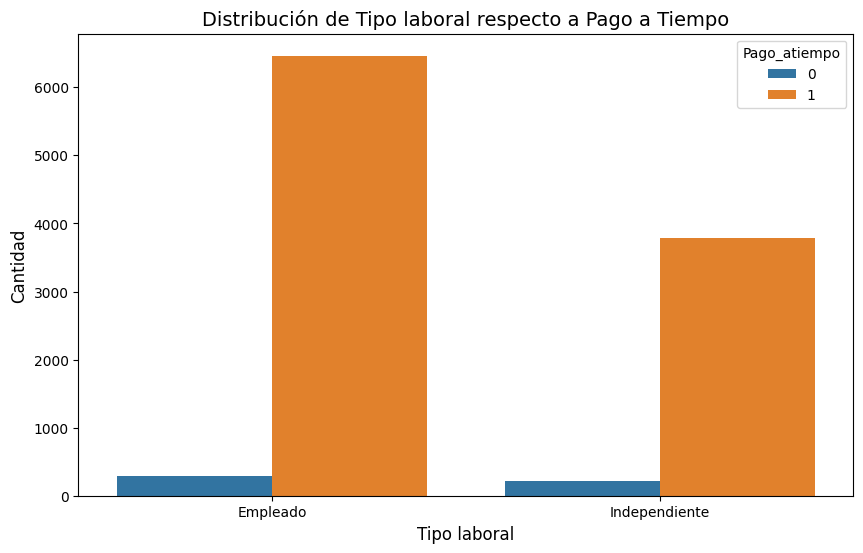

In [103]:
plt.figure(figsize=(10,6))
sns.countplot(data=df, x="tipo_laboral", hue="Pago_atiempo")

plt.title("Distribución de Tipo laboral respecto a Pago a Tiempo", fontsize=14)
plt.xlabel("Tipo laboral", fontsize=12)
plt.ylabel("Cantidad", fontsize=12)

plt.show()

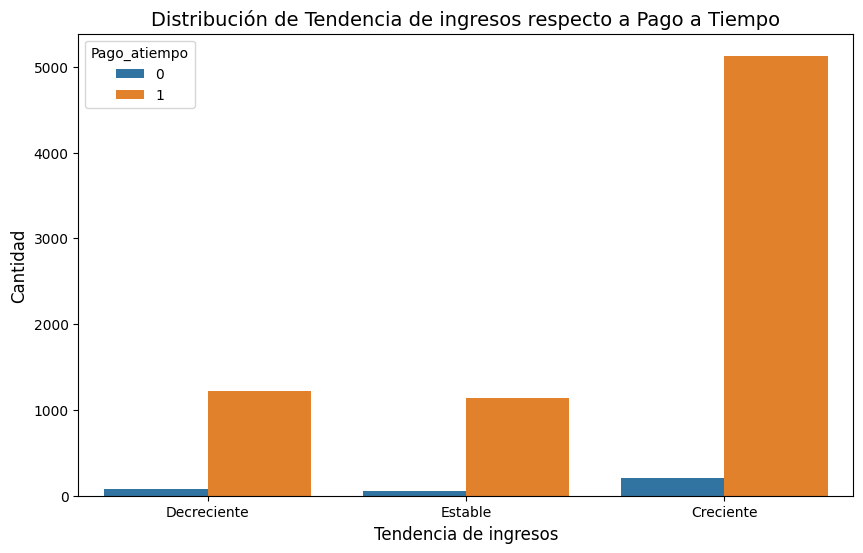

In [104]:
plt.figure(figsize=(10,6))
sns.countplot(data=df, x="tendencia_ingresos", hue="Pago_atiempo")

plt.title("Distribución de Tendencia de ingresos respecto a Pago a Tiempo", fontsize=14)
plt.xlabel("Tendencia de ingresos", fontsize=12)
plt.ylabel("Cantidad", fontsize=12)

plt.show()

In [105]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10763 entries, 0 to 10762
Data columns (total 23 columns):
 #   Column                         Non-Null Count  Dtype         
---  ------                         --------------  -----         
 0   tipo_credito                   10763 non-null  category      
 1   fecha_prestamo                 10763 non-null  datetime64[ns]
 2   capital_prestado               10763 non-null  float64       
 3   plazo_meses                    10763 non-null  int64         
 4   edad_cliente                   10763 non-null  int64         
 5   tipo_laboral                   10763 non-null  category      
 6   salario_cliente                10763 non-null  int64         
 7   total_otros_prestamos          10763 non-null  int64         
 8   cuota_pactada                  10763 non-null  int64         
 9   puntaje                        10763 non-null  float64       
 10  puntaje_datacredito            10757 non-null  float64       
 11  cant_creditosvi

**Analisis Multivariable**

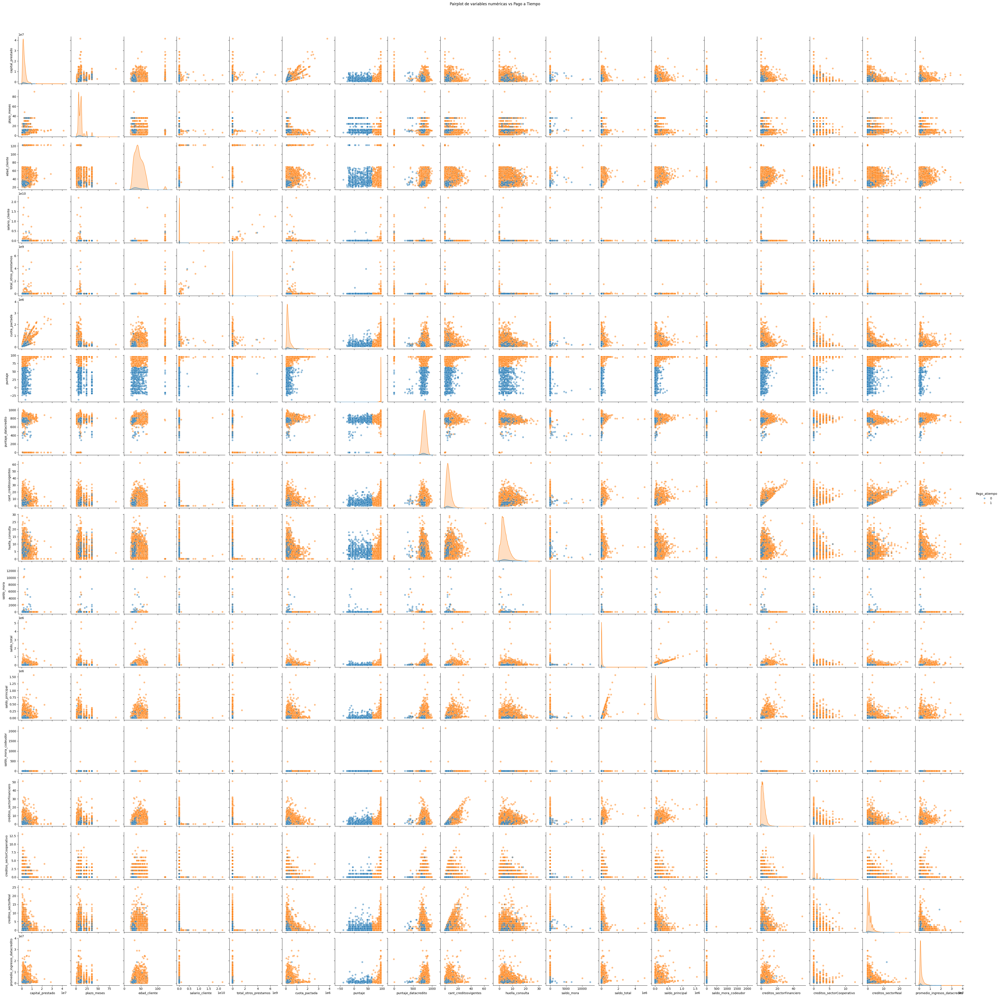

In [106]:
# Pairplot de todas las variables numéricas con respecto a la variable objetivo
sns.pairplot(df, hue="Pago_atiempo", diag_kind="kde", plot_kws={'alpha':0.5})

plt.suptitle("Pairplot de variables numéricas vs Pago a Tiempo", y=1.02)
plt.show()


**Analisis multivariable**

+ Varias variables tienen colas largas (sesgadas a la derecha), lo cual indica la presencia de outliers (ejemplo: salario, otros préstamos, ingresos).

+ Ninguna variable por sí sola determina el pago, pero en conjunto (al usarlas en un modelo multivariable), pueden capturar patrones ocultos.

+ Esto indica que la morosidad es multifactorial, depende de un balance entre ingresos, deudas y tipo de crédito.

Pago_atiempo                                          0         1
tipo_credito tipo_laboral  tendencia_ingresos                    
4            Empleado      Decreciente         0.053619  0.946381
                           Estable             0.044402  0.955598
                           Creciente           0.036273  0.963727
             Independiente Decreciente         0.077821  0.922179
                           Estable             0.043814  0.956186
                           Creciente           0.048753  0.951247
6            Empleado      Decreciente         0.000000  1.000000
                           Creciente           0.500000  0.500000
7            Independiente Estable             0.000000  1.000000
9            Empleado      Decreciente         0.073298  0.926702
                           Estable             0.041322  0.958678
                           Creciente           0.026250  0.973750
             Independiente Decreciente         0.063158  0.936842
          

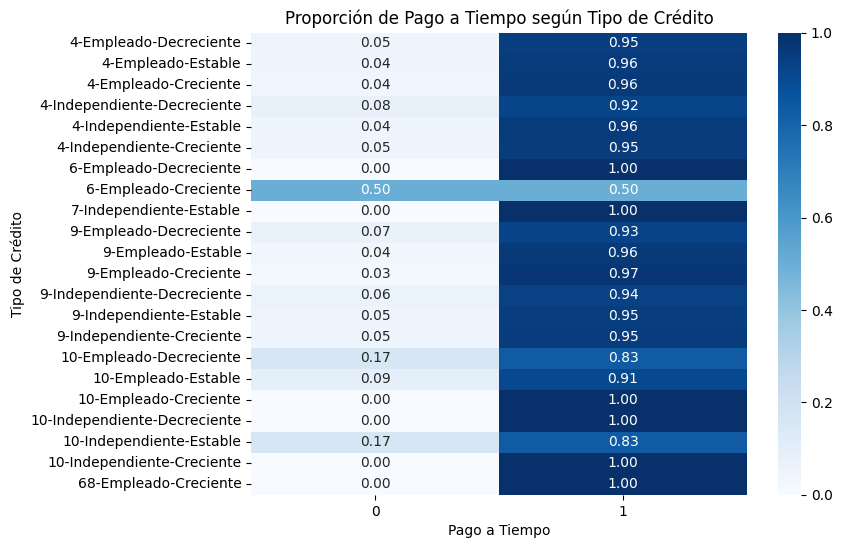

In [107]:
ct = pd.crosstab(index=[df["tipo_credito"], df["tipo_laboral"], df["tendencia_ingresos"]], columns=df["Pago_atiempo"], normalize="index")

print(ct)  # Para ver la tabla en consola

# Heatmap para visualizar proporciones
plt.figure(figsize=(8,6))
sns.heatmap(ct, annot=True, fmt=".2f", cmap="Blues")
plt.title("Proporción de Pago a Tiempo según Tipo de Crédito")
plt.ylabel("Tipo de Crédito")
plt.xlabel("Pago a Tiempo")
plt.show()

**Analisis croostab**

+ La gran mayoría de los segmentos muestran un 95% o más de clientes pagando a tiempo

+ Algunos grupos presentan mayor incumplimiento:

  + 6-Empleado-Creciente → 50% incumple.

  + 10-Empleado-Decreciente → 17% incumple.

  + 10-Independiente-Estable → 17% incumple.

+ La mayoría de los clientes son confiables, pero ciertos perfiles específicos requieren mayor vigilancia.

+ La entidad podría ajustar políticas de riesgo y tasas de interés para los segmentos con menor cumplimiento (por ejemplo, Empleado con ingresos decrecientes).

+ También podría usar esta información para diseñar alertas tempranas y programas de educación financiera dirigidos a los grupos más vulnerables.

**Reglas de validacion**

tipo_credito: Debe ser un valor numérico entero.

fecha_prestamo: Debe seguir el formato de fecha y hora YYYY-MM-DD HH:MM:SS.

capital_prestado: Debe ser un valor numérico y positivo, ya que el capital prestado no puede ser cero o negativo.

plazo_meses: Debe ser un número entero y positivo.

edad_cliente: Debe ser un número entero y coherente para un cliente de crédito (por ejemplo, entre 18 y 99 años).

tipo_laboral: Debe ser un valor de texto que pertenezca a un conjunto predefinido de categorías (por ejemplo, 'Empleado', 'Independiente').

salario_cliente y total_otros_prestamos: Deben ser valores numéricos y positivos.

cuota_pactada: Debe ser un valor numérico y positivo.

puntaje y puntaje_datacredito: Deben ser valores numéricos y deben encontrarse dentro de un rango aceptable. Por ejemplo, el puntaje de Datacrédito podría estar entre 300 y 950.

cant_creditosvigentes, huella_consulta, creditos_sectorFinanciero, creditos_sectorCooperativo, creditos_sectorReal: Deben ser valores numéricos enteros no negativos.

saldo_mora, saldo_total, saldo_principal, saldo_mora_codeudor: Deben ser valores numéricos no negativos.

promedio_ingresos_datacredito: Debe ser un valor numérico y positivo.

tendencia_ingresos: Debe ser un valor de texto que pertenezca a un conjunto de categorías predefinidas, como 'Estable' o 'Creciente'.

Pago_atiempo: Debe ser un valor binario (0 o 1).

**Transformaciones**

Hacer One-Hot-Encoding o Dummies a la variable tipo_laboral

Label-Encoding a la variables tendencia_ingresos

La fecha se puede descomponer como mes, dia de la semana, hora del dia, antiguedad etc



** Creacion de nuevas variables**

Relacion entre total de la deuda y el salario (Deuda/ingreso): Indica que porcentaje del salario de un cliente esta comprometido para pagar deudas, una relacion alta significa que gran parte de los ingresos se destian al pago de deudas

Relacion D/I = (capital_prestado + total_otros_prestamos) / salario_cliente

In [84]:
df["relacion_deuda_ingreso"] = (df["capital_prestado"] + df["total_otros_prestamos"]) / df["salario_cliente"]

In [85]:
valores_a_buscar = [np.inf, -np.inf]

df_infinitos = df[df['relacion_deuda_ingreso'].isin(valores_a_buscar)]

df_infinitos

,tipo_credito,fecha_prestamo,capital_prestado,plazo_meses,edad_cliente,tipo_laboral,salario_cliente,total_otros_prestamos,cuota_pactada,puntaje,...,saldo_total,saldo_principal,saldo_mora_codeudor,creditos_sectorFinanciero,creditos_sectorCooperativo,creditos_sectorReal,promedio_ingresos_datacredito,tendencia_ingresos,Pago_atiempo,relacion_deuda_ingreso
74,9,2024-12-06 17:11:19,677718.0,10,68,Empleado,0,0,57390,95.227787,...,71240.0,71240.0,0.0,1,0,0,2711627.0,Creciente,1,inf
289,9,2024-11-29 10:00:21,1459977.6,10,59,Independiente,0,2000000,123634,95.227787,...,6365.0,4687.0,0.0,6,0,1,3000000.0,Decreciente,1,inf
320,4,2025-08-28 15:15:45,840000.0,6,41,Empleado,0,0,126436,95.227787,...,0.0,NaN,NaN,0,0,0,NaN,NaN,1,inf
392,9,2025-01-16 10:47:36,3424414.8,10,38,Independiente,0,0,290443,91.728786,...,56796.0,56796.0,0.0,0,2,0,NaN,NaN,1,inf
461,6,2025-08-23 08:51:10,1843218.0,12,67,Empleado,0,337000,149806,95.227787,...,2694.0,2694.0,0.0,1,0,1,1760890.0,Creciente,1,inf
462,9,2024-11-27 14:24:58,2414822.4,9,65,Independiente,0,0,225200,95.227787,...,11013.0,11013.0,0.0,3,0,0,905161.0,Creciente,1,inf
1057,9,2024-12-15 12:35:54,2311030.8,11,42,Independiente,0,2000000,195440,95.227787,...,13583.0,13583.0,0.0,4,0,2,885813.0,Estable,1,inf
1405,9,2025-03-01 12:54:40,2030037.6,10,68,Empleado,0,0,172359,95.227787,...,7408.0,7408.0,0.0,0,1,1,923771.0,Creciente,1,inf
1486,9,2025-06-07 17:27:16,964020.0,7,61,Independiente,0,0,113978,95.227787,...,4595.0,4595.0,0.0,1,0,0,615779.0,Decreciente,1,inf
2864,9,2024-12-11 16:43:42,6529003.2,9,57,Empleado,0,430000,608877,95.227787,...,198.0,198.0,0.0,1,0,0,905965.0,Creciente,1,inf


In [86]:
df.relacion_deuda_ingreso.describe()

c:\Users\Juan\Downloads\Pyhton_ETL - copia\codigoproyecto-venv\lib\site-packages\pandas\core\nanops.py:1016: RuntimeWarning: invalid value encountered in subtract
  sqr = _ensure_numeric((avg - values) ** 2)


count    1.076300e+04
mean              inf
std               NaN
min      1.318197e-04
25%      7.208800e-01
50%      1.008151e+00
75%      1.400000e+00
max               inf
Name: relacion_deuda_ingreso, dtype: float64

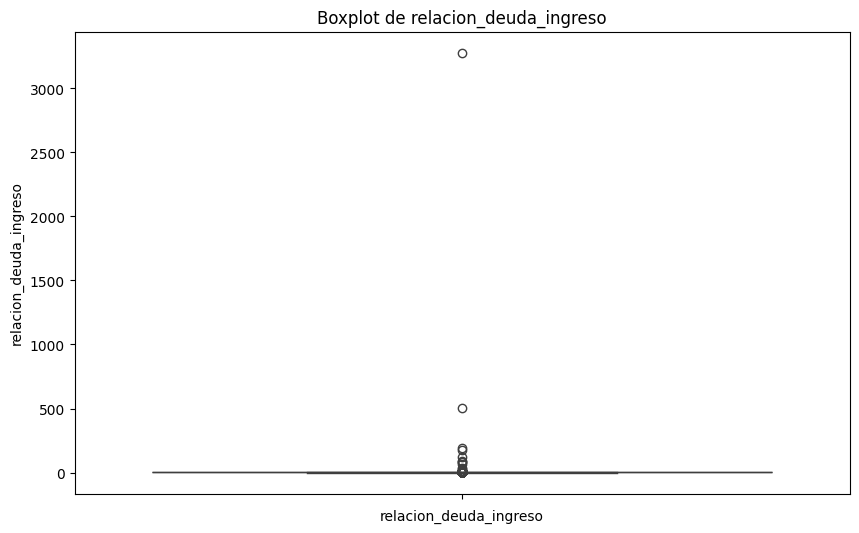

In [87]:
plt.figure(figsize=(10, 6))
sns.boxplot(data=df, y='relacion_deuda_ingreso')
plt.title('Boxplot de relacion_deuda_ingreso')
plt.xlabel('relacion_deuda_ingreso')
plt.show()

**Ingeneria de caracteristicas**

In [88]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10763 entries, 0 to 10762
Data columns (total 24 columns):
 #   Column                         Non-Null Count  Dtype         
---  ------                         --------------  -----         
 0   tipo_credito                   10763 non-null  category      
 1   fecha_prestamo                 10763 non-null  datetime64[ns]
 2   capital_prestado               10763 non-null  float64       
 3   plazo_meses                    10763 non-null  int64         
 4   edad_cliente                   10763 non-null  int64         
 5   tipo_laboral                   10763 non-null  category      
 6   salario_cliente                10763 non-null  int64         
 7   total_otros_prestamos          10763 non-null  int64         
 8   cuota_pactada                  10763 non-null  int64         
 9   puntaje                        10763 non-null  float64       
 10  puntaje_datacredito            10757 non-null  float64       
 11  cant_creditosvi

In [108]:
df.edad_cliente[df["edad_cliente"]>100] = np.nan
df.relacion_deuda_ingreso[df["relacion_deuda_ingreso"].isin(valores_a_buscar)] = np.nan

#Agregar mas reglas de validacion 

C:\Users\Juan\AppData\Local\Temp\ipykernel_20216\3749409642.py:2: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df.relacion_deuda_ingreso[df["relacion_deuda_ingreso"].isin(valores_a_buscar)] = np.nan
C:\Users\Juan\AppData\Local\Temp\ipykerne

In [109]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10763 entries, 0 to 10762
Data columns (total 20 columns):
 #   Column                         Non-Null Count  Dtype   
---  ------                         --------------  -----   
 0   tipo_credito                   10763 non-null  category
 1   capital_prestado               10763 non-null  float64 
 2   plazo_meses                    10763 non-null  int64   
 3   edad_cliente                   10613 non-null  float64 
 4   tipo_laboral                   10763 non-null  category
 5   salario_cliente                10763 non-null  int64   
 6   total_otros_prestamos          10763 non-null  int64   
 7   puntaje_datacredito            10757 non-null  float64 
 8   cant_creditosvigentes          10763 non-null  int64   
 9   huella_consulta                10763 non-null  int64   
 10  saldo_mora                     10607 non-null  float64 
 11  saldo_total                    10607 non-null  float64 
 12  saldo_principal                1

In [110]:
features_numericas = ['edad_cliente', 'puntaje_datacredito','saldo_mora', 'saldo_total', 'saldo_principal',
                      'saldo_mora_codeudor', 'promedio_ingresos_datacredito', 'relacion_deuda_ingreso']

In [111]:
from sklearn.impute import SimpleImputer

ImpNumeros = SimpleImputer(missing_values=np.nan, strategy='mean')
df[features_numericas] = ImpNumeros.fit_transform(df[features_numericas])

In [112]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10763 entries, 0 to 10762
Data columns (total 20 columns):
 #   Column                         Non-Null Count  Dtype   
---  ------                         --------------  -----   
 0   tipo_credito                   10763 non-null  category
 1   capital_prestado               10763 non-null  float64 
 2   plazo_meses                    10763 non-null  int64   
 3   edad_cliente                   10763 non-null  float64 
 4   tipo_laboral                   10763 non-null  category
 5   salario_cliente                10763 non-null  int64   
 6   total_otros_prestamos          10763 non-null  int64   
 7   puntaje_datacredito            10763 non-null  float64 
 8   cant_creditosvigentes          10763 non-null  int64   
 9   huella_consulta                10763 non-null  int64   
 10  saldo_mora                     10763 non-null  float64 
 11  saldo_total                    10763 non-null  float64 
 12  saldo_principal                1

In [113]:
features_categoricas = ['tendencia_ingresos']

In [114]:
ImpCateg = SimpleImputer(missing_values=np.nan, strategy='most_frequent')
df[features_categoricas] = ImpCateg.fit_transform(df[features_categoricas])

In [115]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10763 entries, 0 to 10762
Data columns (total 20 columns):
 #   Column                         Non-Null Count  Dtype   
---  ------                         --------------  -----   
 0   tipo_credito                   10763 non-null  category
 1   capital_prestado               10763 non-null  float64 
 2   plazo_meses                    10763 non-null  int64   
 3   edad_cliente                   10763 non-null  float64 
 4   tipo_laboral                   10763 non-null  category
 5   salario_cliente                10763 non-null  int64   
 6   total_otros_prestamos          10763 non-null  int64   
 7   puntaje_datacredito            10763 non-null  float64 
 8   cant_creditosvigentes          10763 non-null  int64   
 9   huella_consulta                10763 non-null  int64   
 10  saldo_mora                     10763 non-null  float64 
 11  saldo_total                    10763 non-null  float64 
 12  saldo_principal                1

**Correlaciones**

In [94]:
data_num = pd.get_dummies(df, drop_first=True, dtype=int)
data_num.head()

,fecha_prestamo,capital_prestado,plazo_meses,edad_cliente,salario_cliente,total_otros_prestamos,cuota_pactada,puntaje,puntaje_datacredito,cant_creditosvigentes,...,relacion_deuda_ingreso,tipo_credito_6,tipo_credito_7,tipo_credito_9,tipo_credito_10,tipo_credito_68,tipo_laboral_Independiente,tendencia_ingresos_Decreciente,tendencia_ingresos_Estable,Pago_atiempo_1
0,2024-12-21 11:31:35,3692160.0,10,42,8000000,2500000,341296,88.768094,695.0,10,...,0.774020,0,1,0,0,0,1,0,1,1
1,2025-04-22 09:47:35,840000.0,6,60,3000000,2000000,124876,95.227787,789.0,3,...,0.946667,0,0,0,0,0,0,0,0,1
2,2026-01-08 12:22:40,5974028.4,10,36,4036000,829000,529554,47.613894,740.0,4,...,1.685587,0,0,1,0,0,1,0,0,0
3,2025-08-04 12:04:10,1671240.0,6,48,1524547,498000,252420,95.227787,837.0,4,...,1.422875,0,0,0,0,0,0,0,0,1
4,2025-04-26 11:24:26,2781636.0,11,44,5000000,4000000,217037,95.227787,771.0,4,...,1.356327,0,0,1,0,0,0,0,0,1


In [95]:
data_num.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10763 entries, 0 to 10762
Data columns (total 29 columns):
 #   Column                          Non-Null Count  Dtype         
---  ------                          --------------  -----         
 0   fecha_prestamo                  10763 non-null  datetime64[ns]
 1   capital_prestado                10763 non-null  float64       
 2   plazo_meses                     10763 non-null  int64         
 3   edad_cliente                    10763 non-null  int64         
 4   salario_cliente                 10763 non-null  int64         
 5   total_otros_prestamos           10763 non-null  int64         
 6   cuota_pactada                   10763 non-null  int64         
 7   puntaje                         10763 non-null  float64       
 8   puntaje_datacredito             10757 non-null  float64       
 9   cant_creditosvigentes           10763 non-null  int64         
 10  huella_consulta                 10763 non-null  int64         
 11  sa

In [96]:
data_num.corr()


,fecha_prestamo,capital_prestado,plazo_meses,edad_cliente,salario_cliente,total_otros_prestamos,cuota_pactada,puntaje,puntaje_datacredito,cant_creditosvigentes,...,relacion_deuda_ingreso,tipo_credito_6,tipo_credito_7,tipo_credito_9,tipo_credito_10,tipo_credito_68,tipo_laboral_Independiente,tendencia_ingresos_Decreciente,tendencia_ingresos_Estable,Pago_atiempo_1
fecha_prestamo,1.000000,0.075205,0.030561,-0.010307,0.006539,0.018215,0.117858,0.050885,-0.030336,-0.003802,...,0.012016,0.008475,-0.009778,0.081256,0.012875,0.003676,0.011260,-0.001443,-0.099896,0.036403
capital_prestado,0.075205,1.000000,0.299781,0.125006,0.047038,0.065190,0.764104,-0.043213,-0.151203,0.050692,...,0.002036,0.009868,0.040572,0.003534,0.046909,0.001961,0.026737,-0.006233,0.040690,-0.040624
plazo_meses,0.030561,0.299781,1.000000,-0.085572,-0.012839,-0.013317,-0.227221,-0.074331,0.002263,-0.002911,...,-0.000816,0.051722,0.081045,-0.189184,0.078592,0.054397,-0.164408,0.041004,-0.001645,-0.063105
edad_cliente,-0.010307,0.125006,-0.085572,1.000000,0.147414,0.199710,0.154653,0.033215,-0.380759,-0.038541,...,-0.000265,-0.009915,-0.007648,0.147181,0.008123,-0.009568,0.056044,-0.101638,-0.005512,0.032252
salario_cliente,0.006539,0.047038,-0.012839,0.147414,1.000000,0.596990,0.052353,-0.003740,-0.190664,-0.040600,...,-0.001664,-0.001774,-0.000507,0.038701,-0.004100,-0.000391,-0.015092,-0.013893,0.001517,-0.003981
total_otros_prestamos,0.018215,0.065190,-0.013317,0.199710,0.596990,1.000000,0.059430,-0.006892,-0.283266,-0.050249,...,0.017645,-0.002230,-0.000488,0.069019,-0.004614,-0.000508,-0.027609,-0.014988,-0.008929,-0.010041
cuota_pactada,0.117858,0.764104,-0.227221,0.154653,0.052353,0.059430,1.000000,-0.005896,-0.132308,0.053578,...,0.001318,-0.015073,0.002152,0.066879,-0.004567,-0.008913,0.130395,-0.031765,0.042045,-0.011814
puntaje,0.050885,-0.043213,-0.074331,0.033215,-0.003740,-0.006892,-0.005896,1.000000,0.090551,0.014367,...,0.001975,-0.109926,0.000686,0.003987,0.015718,0.002376,-0.029328,-0.030248,0.003148,0.923134
puntaje_datacredito,-0.030336,-0.151203,0.002263,-0.380759,-0.190664,-0.283266,-0.132308,0.090551,1.000000,0.105010,...,0.010403,-0.015716,-0.004134,-0.144455,0.008533,0.002134,0.088881,0.026360,0.044371,0.067882
cant_creditosvigentes,-0.003802,0.050692,-0.002911,-0.038541,-0.040600,-0.050249,0.053578,0.014367,0.105010,1.000000,...,-0.000764,-0.017080,0.007793,0.041226,-0.005046,0.000662,0.075647,0.001637,0.036950,0.008829


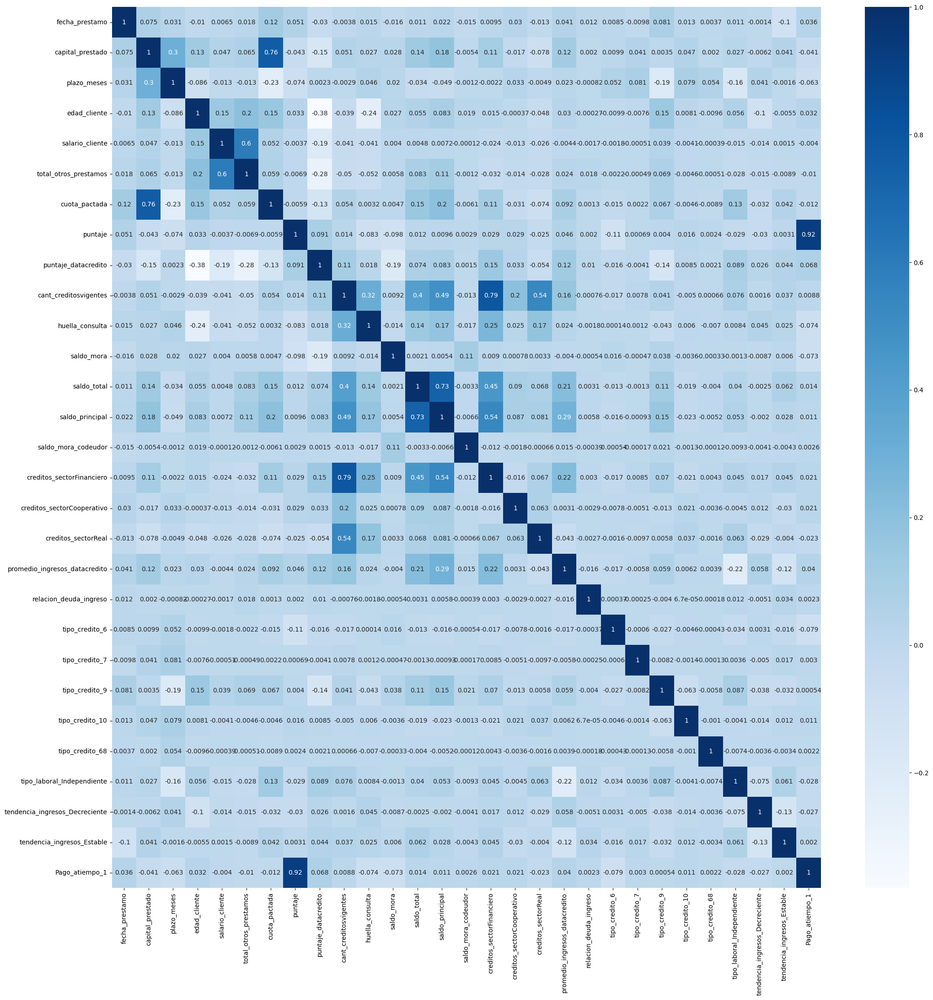

In [97]:
plt.figure(figsize=(25,25))
sns.heatmap(data_num.corr(), annot=True, cmap='Blues')
plt.show()

In [98]:
#Estas variables son redundantes tienen una correlacion peligrosamente alta > 0.7
df = df.drop(["cuota_pactada", "fecha_prestamo", "creditos_sectorFinanciero", "puntaje"], axis = 1)

In [99]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10763 entries, 0 to 10762
Data columns (total 20 columns):
 #   Column                         Non-Null Count  Dtype   
---  ------                         --------------  -----   
 0   tipo_credito                   10763 non-null  category
 1   capital_prestado               10763 non-null  float64 
 2   plazo_meses                    10763 non-null  int64   
 3   edad_cliente                   10763 non-null  int64   
 4   tipo_laboral                   10763 non-null  category
 5   salario_cliente                10763 non-null  int64   
 6   total_otros_prestamos          10763 non-null  int64   
 7   puntaje_datacredito            10757 non-null  float64 
 8   cant_creditosvigentes          10763 non-null  int64   
 9   huella_consulta                10763 non-null  int64   
 10  saldo_mora                     10607 non-null  float64 
 11  saldo_total                    10607 non-null  float64 
 12  saldo_principal                1

In [179]:
df["edad_cliente"] = df["edad_cliente"].astype(int)
df["tendencia_ingresos"] = df["tendencia_ingresos"].astype('category')
df['antiguedad_dias'] = df['antiguedad_dias'].astype(int)

<Axes: xlabel='Pago_atiempo'>

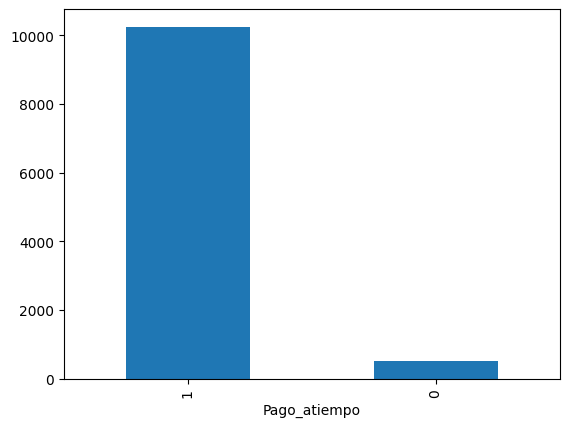

In [138]:
df.value_counts(df['Pago_atiempo']).plot(kind="bar")

In [100]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10763 entries, 0 to 10762
Data columns (total 20 columns):
 #   Column                         Non-Null Count  Dtype   
---  ------                         --------------  -----   
 0   tipo_credito                   10763 non-null  category
 1   capital_prestado               10763 non-null  float64 
 2   plazo_meses                    10763 non-null  int64   
 3   edad_cliente                   10763 non-null  int64   
 4   tipo_laboral                   10763 non-null  category
 5   salario_cliente                10763 non-null  int64   
 6   total_otros_prestamos          10763 non-null  int64   
 7   puntaje_datacredito            10757 non-null  float64 
 8   cant_creditosvigentes          10763 non-null  int64   
 9   huella_consulta                10763 non-null  int64   
 10  saldo_mora                     10607 non-null  float64 
 11  saldo_total                    10607 non-null  float64 
 12  saldo_principal                1

In [184]:
#Vamos a usar un model RN, entonces tenemos que normalizar

from sklearn.preprocessing import MinMaxScaler

min_max_scaler = MinMaxScaler()
df[['capital_prestado', 'plazo_meses', 'edad_cliente', 'salario_cliente', 'total_otros_prestamos', 'puntaje', 'puntaje_datacredito', 'cant_creditosvigentes', 'huella_consulta', 'saldo_mora', 'saldo_total', 'saldo_principal', 'saldo_mora_codeudor', 'creditos_sectorCooperativo', 'creditos_sectorReal','promedio_ingresos_datacredito', 'relacion_deuda_ingreso', 'antiguedad_dias']] = min_max_scaler.fit_transform(df[['capital_prestado', 'plazo_meses', 'edad_cliente', 'salario_cliente', 'total_otros_prestamos', 'puntaje', 'puntaje_datacredito', 'cant_creditosvigentes', 'huella_consulta', 'saldo_mora', 'saldo_total', 'saldo_principal', 'saldo_mora_codeudor', 'creditos_sectorCooperativo', 'creditos_sectorReal','promedio_ingresos_datacredito', 'relacion_deuda_ingreso', 'antiguedad_dias']])

df.head()

,tipo_credito,capital_prestado,plazo_meses,edad_cliente,tipo_laboral,salario_cliente,total_otros_prestamos,puntaje,puntaje_datacredito,cant_creditosvigentes,...,saldo_total,saldo_principal,saldo_mora_codeudor,creditos_sectorCooperativo,creditos_sectorReal,promedio_ingresos_datacredito,tendencia_ingresos,relacion_deuda_ingreso,antiguedad_dias,Pago_atiempo
0,7,0.081106,0.090909,0.46,Independiente,0.000364,0.000368,0.951518,0.697813,0.161290,...,0.010019,0.032810,0.0,0.0,0.00,0.023842,Estable,0.000236,0.937343,1
1,4,0.011683,0.045455,0.82,Empleado,0.000136,0.000295,1.000000,0.791252,0.048387,...,0.001695,0.005551,0.0,0.0,0.08,0.024642,Creciente,0.000289,0.631579,1
2,9,0.136647,0.090909,0.34,Independiente,0.000183,0.000122,0.642640,0.742545,0.064516,...,0.003656,0.011971,0.0,0.0,0.00,0.052620,Creciente,0.000514,0.661654,0
3,4,0.031916,0.045455,0.58,Empleado,0.000069,0.000073,1.000000,0.838966,0.064516,...,0.003085,0.010102,0.0,0.0,0.00,0.040313,Creciente,0.000434,0.370927,1
4,9,0.058943,0.102273,0.50,Empleado,0.000227,0.000589,1.000000,0.773360,0.064516,...,0.040032,0.131093,0.0,0.0,0.04,0.024496,Creciente,0.000414,0.621554,1


In [185]:
df = pd.get_dummies(df, columns=['tipo_laboral'], drop_first=True, dtype=int)
df.head()

,tipo_credito,capital_prestado,plazo_meses,edad_cliente,salario_cliente,total_otros_prestamos,puntaje,puntaje_datacredito,cant_creditosvigentes,huella_consulta,...,saldo_principal,saldo_mora_codeudor,creditos_sectorCooperativo,creditos_sectorReal,promedio_ingresos_datacredito,tendencia_ingresos,relacion_deuda_ingreso,antiguedad_dias,Pago_atiempo,tipo_laboral_Independiente
0,7,0.081106,0.090909,0.46,0.000364,0.000368,0.951518,0.697813,0.161290,0.172414,...,0.032810,0.0,0.0,0.00,0.023842,Estable,0.000236,0.937343,1,1
1,4,0.011683,0.045455,0.82,0.000136,0.000295,1.000000,0.791252,0.048387,0.034483,...,0.005551,0.0,0.0,0.08,0.024642,Creciente,0.000289,0.631579,1,0
2,9,0.136647,0.090909,0.34,0.000183,0.000122,0.642640,0.742545,0.064516,0.172414,...,0.011971,0.0,0.0,0.00,0.052620,Creciente,0.000514,0.661654,0,1
3,4,0.031916,0.045455,0.58,0.000069,0.000073,1.000000,0.838966,0.064516,0.137931,...,0.010102,0.0,0.0,0.00,0.040313,Creciente,0.000434,0.370927,1,0
4,9,0.058943,0.102273,0.50,0.000227,0.000589,1.000000,0.773360,0.064516,0.206897,...,0.131093,0.0,0.0,0.04,0.024496,Creciente,0.000414,0.621554,1,0


In [186]:
df = pd.get_dummies(df, columns=['tipo_credito', 'tendencia_ingresos'], drop_first=False, dtype=int)
df.head()

,capital_prestado,plazo_meses,edad_cliente,salario_cliente,total_otros_prestamos,puntaje,puntaje_datacredito,cant_creditosvigentes,huella_consulta,saldo_mora,...,tipo_laboral_Independiente,tipo_credito_4,tipo_credito_6,tipo_credito_7,tipo_credito_9,tipo_credito_10,tipo_credito_68,tendencia_ingresos_Creciente,tendencia_ingresos_Decreciente,tendencia_ingresos_Estable
0,0.081106,0.090909,0.46,0.000364,0.000368,0.951518,0.697813,0.161290,0.172414,0.0,...,1,0,0,1,0,0,0,0,0,1
1,0.011683,0.045455,0.82,0.000136,0.000295,1.000000,0.791252,0.048387,0.034483,0.0,...,0,1,0,0,0,0,0,1,0,0
2,0.136647,0.090909,0.34,0.000183,0.000122,0.642640,0.742545,0.064516,0.172414,0.0,...,1,0,0,0,1,0,0,1,0,0
3,0.031916,0.045455,0.58,0.000069,0.000073,1.000000,0.838966,0.064516,0.137931,0.0,...,0,1,0,0,0,0,0,1,0,0
4,0.058943,0.102273,0.50,0.000227,0.000589,1.000000,0.773360,0.064516,0.206897,0.0,...,0,0,0,0,1,0,0,1,0,0


In [116]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10763 entries, 0 to 10762
Data columns (total 20 columns):
 #   Column                         Non-Null Count  Dtype   
---  ------                         --------------  -----   
 0   tipo_credito                   10763 non-null  category
 1   capital_prestado               10763 non-null  float64 
 2   plazo_meses                    10763 non-null  int64   
 3   edad_cliente                   10763 non-null  float64 
 4   tipo_laboral                   10763 non-null  category
 5   salario_cliente                10763 non-null  int64   
 6   total_otros_prestamos          10763 non-null  int64   
 7   puntaje_datacredito            10763 non-null  float64 
 8   cant_creditosvigentes          10763 non-null  int64   
 9   huella_consulta                10763 non-null  int64   
 10  saldo_mora                     10763 non-null  float64 
 11  saldo_total                    10763 non-null  float64 
 12  saldo_principal                1

In [ ]:
#Variables a eliminar salario_cliente, algunas clases del tipo_credito, la que menos nulos tenga saldo toal se elimina saldo principal